In [3]:
import scipy.io as scio 
import pandas as pd
pd.reset_option('display.max_columns')  # 恢复最大列数的默认设置
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import h5py
import glob

# .mat转为.h5（仅运行一次即可）

## 对于Round-1

- 将数字信号转化为Marker，然后保存为hdf5文件

In [3]:
def add_marker(biopac_file_path, save_path):
    # 加载数据
    raw_biopac = scio.loadmat(biopac_file_path)
    # 提取数据
    biopac_data = raw_biopac['data']
    biopac_labels = raw_biopac['labels']
    # 设置表头
    headers = ['PPG', 'RSP', 'EMG A', 'SKT A', 'EDA', 'ECG', 'EMG B', 'SKT B', 
               'Dig0', 'Dig 1', 'Dig2', 'Dig3', 'Dig4', 'Dig5', 'Dig6', 'Dig7', 'ECG rate']
    # 将数据转换为 DataFrame
    df_biopac_raw = pd.DataFrame(biopac_data, columns=headers)
    
    # 获取第8~15列的列名
    column_dig = df_biopac_raw.columns[8:16]
    # 将非零值转换为1
    df_biopac_raw[column_dig] = df_biopac_raw[column_dig].applymap(lambda x: 1 if x != 0 else 0)
    # 生成二进制字符串
    binary_string = df_biopac_raw[column_dig[::-1]].apply(lambda row: ''.join(str(bit) for bit in row), axis=1)
    # 转换为十进制数
    decimal_values = binary_string.apply(lambda binary: int(binary, 2))
    # 将十进制数赋值给新的列"Marker"
    df_biopac_raw['Marker'] = decimal_values
    
    # 删除Dig0~Dig7
    df_biopac_data = df_biopac_raw.drop(column_dig, axis=1)
    
    try:
        # 将 DataFrame 保存为 HDF5 文件
        df_biopac_data.to_hdf(save_path, key="df", mode="w")
    except Exception as e:
        print(e)
    
    print(f'Save {biopac_file_path} success!')

In [2]:
# 指定要遍历的路径
path_biopac = r'E:\10.Doctoral materials\0.Micro-expression\1.PROJECTS\0.Multi-modality\biopac_data_mat\Round-1'

# 创建一个空列表用于存储 .mat 文件名
mat_files = []

# 遍历路径下的所有文件
for filename in os.listdir(path_biopac):
    if filename.endswith('.mat'):
        mat_files.append(filename)

# 输出结果
print(mat_files)
print(len(mat_files))

['fengdengfang_8.2.mat', 'linjiaying_7.19.mat', 'liuhaoyu_7.28.mat', 'liyan_8.2.mat', 'lvpinxin_8.3.mat', 'mayiran_7.18.mat', 'qiangweihua_7.31.mat', 'qingwenyang_8.3.mat', 'shengxin_7.31.mat', 'shitianyang_7.20.mat', 'wangjintao_7.19.mat', 'wangsen_8.1.mat', 'wangshuai_8.2.mat', 'wangsixian_7.19.mat', 'wangxiaomin_7.18.mat', 'wangxinyi_7.27.mat', 'wangziheng_7.27.mat', 'wangzishan_7.17.mat', 'wujinghan_7.21.mat', 'xietao_8.2.mat', 'yangmi_7.28.mat', 'yansen_7.31.mat', 'yuelu_7.20.mat', 'zhangbuyuan_8.1.mat', 'zhangdi_7.21.mat', 'zhaolei_8.3.mat', 'zhaoshaohua_8.1.mat', 'zhengchangyan_7.28.mat', 'zhengwansheng_7.18.mat']
29


In [51]:
for mat in mat_files:
    save_path = os.path.join('biopac_data_HDF5/Round-1', mat.split('.mat')[0] + ".h5")
    print(save_path)
    biopac_file_path = 'biopac_data_mat/Round-1/' +  mat
    add_marker(biopac_file_path, save_path)

biopac_data_HDF5\fengdengfang_8.2.h5
Save biopac_data/fengdengfang_8.2.mat success!
biopac_data_HDF5\linjiaying_7.19.h5
Save biopac_data/linjiaying_7.19.mat success!
biopac_data_HDF5\liuhaoyu_7.28.h5
Save biopac_data/liuhaoyu_7.28.mat success!
biopac_data_HDF5\liyan_8.2.h5
Save biopac_data/liyan_8.2.mat success!
biopac_data_HDF5\lvpinxin_8.3.h5
The file 'biopac_data_HDF5\lvpinxin_8.3.h5' is already opened.  Please close it before reopening in write mode.
Save biopac_data/lvpinxin_8.3.mat success!
biopac_data_HDF5\mayiran_7.18.h5
Save biopac_data/mayiran_7.18.mat success!
biopac_data_HDF5\qiangweihua_7.31.h5
Save biopac_data/qiangweihua_7.31.mat success!
biopac_data_HDF5\qingwenyang_8.3.h5
Save biopac_data/qingwenyang_8.3.mat success!
biopac_data_HDF5\shengxin_7.31.h5
Save biopac_data/shengxin_7.31.mat success!
biopac_data_HDF5\shitianyang_7.20.h5
Save biopac_data/shitianyang_7.20.mat success!
biopac_data_HDF5\wangjintao_7.19.h5
Save biopac_data/wangjintao_7.19.mat success!
biopac_data_

## 对于Round-2

In [2]:
def get_marker(df, AB_type):
    # 获取第8~15列的列名
    column_dig = df.columns[6:14]
    # 将非零值转换为1
    df[column_dig] = df[column_dig].applymap(lambda x: 1 if x != 0 else 0)
    # 生成二进制字符串
    binary_string = df[column_dig[::-1]].apply(lambda row: ''.join(str(bit) for bit in row), axis=1)
    if AB_type =='A':
        # 转换为十进制数
        decimal_values = binary_string.apply(lambda binary: int(binary, 2))
    if AB_type =='B':
        # 转换为十进制数，非零加上 25
        decimal_values = binary_string.apply(lambda binary: int(binary, 2) + 
                                             25 if int(binary, 2) != 0 else int(binary, 2))
    # 将十进制数赋值给新的列"Marker"
    df['Marker'] = decimal_values
    # 删除Dig0~Dig7
    df = df.drop(column_dig, axis=1)
        
    return df

In [3]:
def add_marker(sub, save_path):
    mat_path_A = os.path.join('biopac_data_mat\Round-2', sub.split('.mat')[0] + '_A.mat')
    mat_path_B = os.path.join('biopac_data_mat\Round-2', sub.split('.mat')[0] + '_B.mat')
    
    # 设置表头
    headers = ['PPG', 'RSP', 'EMG A', 'EDA', 'ECG', 'EMG B', 
               'Dig0', 'Dig 1', 'Dig2', 'Dig3', 'Dig4', 'Dig5', 'Dig6', 'Dig7']

    # 加载数据
    data_A = scio.loadmat(mat_path_A)['data']
    data_B = scio.loadmat(mat_path_B)['data']

    # 将数据转换为 DataFrame
    df_data_A = pd.DataFrame(data_A, columns=headers)
    df_data_B = pd.DataFrame(data_B, columns=headers)
    
    df_data_A = get_marker(df_data_A, 'A')
    df_data_B = get_marker(df_data_B, 'B')
    
    df_data_combined = pd.concat([df_data_A, df_data_B], ignore_index=True)
    
    try:
        # 将 DataFrame 保存为 HDF5 文件
        df_data_combined.to_hdf(save_path, key="df", mode="w")
    except Exception as e:
        print(e)
    
    print(f'Save {save_path} success!')

In [4]:
# 指定要遍历的路径
path_biopac = r'E:\10.Doctoral materials\0.Micro-expression\1.PROJECTS\0.Multi-modality\biopac_data_mat\Round-2'

# 创建一个空列表用于存储 .mat 文件名
mat_files = []

# 遍历路径下的所有文件
for filename in os.listdir(path_biopac):
    if filename.endswith('.mat'):
        mat_files.append(filename)

# 输出结果
print(mat_files)
print(len(mat_files))

# 获取被试列表
sub_list = list(set([name.replace('_A', '').replace('_B', '') for name in mat_files]))
print(sub_list)
print(len(sub_list))

['chenhao_20240111_A.mat', 'chenhao_20240111_B.mat', 'fuxiangyu_20240110_A.mat', 'fuxiangyu_20240110_B.mat', 'lida_20240108_A.mat', 'lida_20240108_B.mat', 'lishaoling_20240103_A.mat', 'lishaoling_20240103_B.mat', 'lixiaohui_20240109_A.mat', 'lixiaohui_20240109_B.mat', 'songyihang_20240112_A.mat', 'songyihang_20240112_B.mat', 'wangyongqi_20240112_A.mat', 'wangyongqi_20240112_B.mat', 'xiaoyunfeng_20240108_A.mat', 'xiaoyunfeng_20240108_B.mat', 'zhenghongwei_20240103_A.mat', 'zhenghongwei_20240103_B.mat', 'zhouyang_20240109_A.mat', 'zhouyang_20240109_B.mat']
20
['zhenghongwei_20240103.mat', 'lishaoling_20240103.mat', 'wangyongqi_20240112.mat', 'lida_20240108.mat', 'fuxiangyu_20240110.mat', 'songyihang_20240112.mat', 'xiaoyunfeng_20240108.mat', 'lixiaohui_20240109.mat', 'chenhao_20240111.mat', 'zhouyang_20240109.mat']
10


In [5]:
for sub in sub_list:
    save_path = os.path.join('biopac_data_HDF5\Round-2', sub.split('.mat')[0] + ".h5")
    add_marker(sub, save_path)

Save biopac_data_HDF5\Round-2\zhenghongwei_20240103.h5 success!
Save biopac_data_HDF5\Round-2\lishaoling_20240103.h5 success!
Save biopac_data_HDF5\Round-2\wangyongqi_20240112.h5 success!
Save biopac_data_HDF5\Round-2\lida_20240108.h5 success!
Save biopac_data_HDF5\Round-2\fuxiangyu_20240110.h5 success!
Save biopac_data_HDF5\Round-2\songyihang_20240112.h5 success!
Save biopac_data_HDF5\Round-2\xiaoyunfeng_20240108.h5 success!
Save biopac_data_HDF5\Round-2\lixiaohui_20240109.h5 success!
Save biopac_data_HDF5\Round-2\chenhao_20240111.h5 success!
Save biopac_data_HDF5\Round-2\zhouyang_20240109.h5 success!


# 数据加载

## 加载一个被试的数据

In [4]:
import scipy.io as scio 
import pandas as pd
pd.set_option('display.expand_frame_repr', False)
pd.reset_option('display.max_columns')  # 恢复最大列数的默认设置
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import h5py
import glob
import neurokit2 as nk
from IPython.display import display
import inspect
from scipy import stats
from tabulate import tabulate
from warnings import warn
print(nk.__version__)

0.2.9


In [5]:
subject = 'fengdengfang_20230802'
biopac_file_path = 'biopac_data_HDF5' + '/' + subject + '.h5'
# 读取 HDF5 文件中的 DataFrame
df_biopac_data = pd.read_hdf(biopac_file_path, key='df')
df_biopac_data

,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
0,-0.010071,-0.010986,-0.004883,32.000000,7.916363e-07,-0.002747,0.005493,31.998779,0.000000,100
1,-0.010681,-0.010071,-0.004730,32.000610,7.916363e-07,-0.003052,0.005798,32.000610,0.000000,100
2,-0.009766,-0.010986,-0.004883,32.001221,3.052549e-03,-0.002747,0.005341,32.000000,0.000000,100
3,-0.009460,-0.010986,-0.005188,32.000000,1.526671e-03,-0.003052,0.005798,31.999390,0.000000,100
4,-0.009460,-0.010376,-0.004578,32.000610,1.526671e-03,-0.002747,0.005646,32.000000,0.000000,100
...,...,...,...,...,...,...,...,...,...,...
4713100,0.864258,-10.000000,-0.004883,32.001221,2.689819e+01,0.134735,0.005646,32.000000,85.592011,100
4713101,0.876770,-10.000000,-0.004883,32.000610,2.689819e+01,0.133820,0.005341,31.996948,85.592011,100
4713102,0.890808,-10.000000,-0.004883,32.001221,2.689667e+01,0.131531,0.005646,32.000610,85.592011,100
4713103,0.905457,-10.000000,-0.005035,32.000610,2.689667e+01,0.130005,0.005798,32.000000,85.592011,100


## 取对应Marker的值

In [25]:
marker = 117 # fear
df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
df_biopac_marker = df_biopac_marker.reset_index(drop=True)

In [26]:
df_biopac_marker

,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
0,1.822510,-4.967957,-0.004883,32.000000,28.086854,0.021210,0.005798,32.000000,89.285714,117
1,1.813660,-4.973450,-0.005035,32.000000,28.089906,0.020142,0.005798,32.000610,89.285714,117
2,1.804810,-4.982910,-0.004883,31.998169,28.088380,0.018921,0.005341,31.997559,89.285714,117
3,1.794434,-4.992371,-0.005188,31.998779,28.086854,0.017548,0.005798,32.000000,89.285714,117
4,1.784668,-4.997864,-0.005035,32.000000,28.088380,0.017090,0.005493,31.999390,89.285714,117
...,...,...,...,...,...,...,...,...,...,...
59113,1.375732,1.668091,-0.004883,32.000000,27.177430,0.067749,0.005646,31.999390,94.339623,117
59114,1.391907,1.668091,-0.004425,32.000000,27.177430,0.066071,0.005798,32.000610,94.339623,117
59115,1.406555,1.663208,-0.005035,31.998779,27.178956,0.065308,0.005798,31.999390,94.339623,117
59116,1.421204,1.663818,-0.004730,32.000610,27.175904,0.064545,0.005341,32.001831,94.339623,117


## 降采样

In [21]:
# 降采样到 200Hz
# 选择每 5 个样本
df_biopac_marker_downsampled = df_biopac_marker.iloc[::5]  # 每隔 5 个样本选取一次
df_biopac_marker_downsampled.reset_index(drop=True)

,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
0,0.038147,-1.867676,-0.004883,32.000000,23.027039,-0.272675,0.005951,32.000610,103.806228,115
1,0.032959,-1.904602,-0.004578,32.000000,23.027039,-0.260925,0.005646,32.000000,103.806228,115
2,0.034485,-1.944275,-0.004730,32.000000,23.027039,-0.254364,0.005646,32.000000,103.806228,115
3,0.029297,-1.979980,-0.004730,32.001221,23.027039,-0.250092,0.005646,32.000000,103.806228,115
4,0.024109,-2.019348,-0.005035,32.000000,23.025513,-0.247040,0.005646,32.000610,103.806228,115
...,...,...,...,...,...,...,...,...,...,...
10986,-0.185852,-3.370667,-0.004730,32.000000,23.114014,-0.176544,0.006104,32.000000,91.463415,115
10987,-0.190430,-3.374023,-0.004883,32.000610,23.112488,-0.132751,0.005646,31.998779,91.463415,115
10988,-0.191040,-3.378601,-0.004883,32.000610,23.114014,-0.083923,0.006104,32.000000,91.463415,115
10989,-0.194702,-3.380432,-0.005341,31.999390,23.114014,-0.037689,0.005493,32.000000,91.463415,115


## 绘制波形图

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
from matplotlib.ticker import FuncFormatter

# Butterworth 滤波器设计
def butter_lowpass(cutoff, fs, order=5):
    nyq = 2 * fs  # Nyquist frequency
    normal_cutoff = cutoff / nyq  # 归一化频率
    b, a = butter(order, normal_cutoff, btype='low', analog=False)  # Butterworth 滤波器
    return b, a

def lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)  # 应用滤波器
    return y

def format_func(value, tick_number):
    return int(value / 1000)  # 将坐标轴上的数值除以1000

# 根据 'time' 列和 'amplitude' 列绘制波形图
def draw_wave_filter(df, PS):
    # 设置滤波器参数
    cutoff_frequency = 5  # 截止频率
    filtered_signal = lowpass_filter(df[PS], cutoff_frequency, fs = 1000)

    # 绘图
    color_scheme = ['RoyalBlue', 'DarkOrange', 'ForestGreen', 'Crimson', 'MediumPurple', 'SaddleBrown', 'DeepPink',
    'DimGray',  'GoldenRod', 'Teal']

    plt.figure(figsize=(18, 1.5))
    
    # 定义 PS 值和对应的颜色映射
    ps_color_map = {
        'PPG': color_scheme[0],
        'RSP': color_scheme[1],
        'SKT': color_scheme[5],
        'EDA': color_scheme[4],
        'ECG': color_scheme[7],
        'ECG rate': color_scheme[8]
        }

    if PS == 'SKT A' or PS == 'SKT B':
        PS = 'SKT'
 
    plt.plot(filtered_signal, label=PS, color=ps_color_map.get(PS, None), linewidth=2)
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.gca().xaxis.set_major_formatter(FuncFormatter(format_func))
#     plt.title(PS)
#     plt.xlabel('Time (s)')
#     plt.ylabel('Amplitude')
#     plt.legend(fontsize=22, loc='upper right')
    plt.grid()
    plt.show()
    
def draw_wave(df, PS):
    # 绘图
    plt.figure(figsize=(12, 2.5))
    plt.plot(df[PS], color='blue', alpha=0.5)
    plt.title(PS)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()
    plt.show()

### raw数据

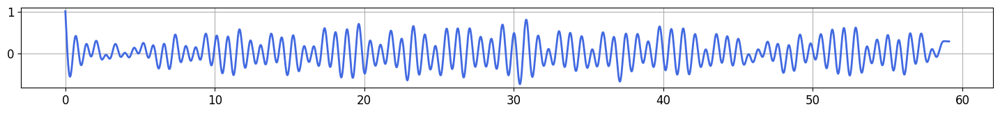

In [48]:
PS = 'PPG'
draw_wave_filter(df_biopac_marker, PS)

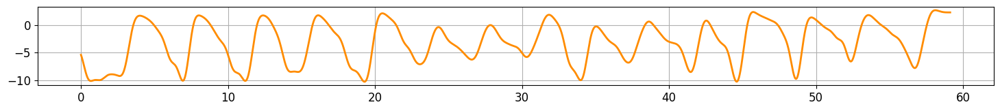

In [49]:
PS = 'RSP'
draw_wave_filter(df_biopac_marker, PS)

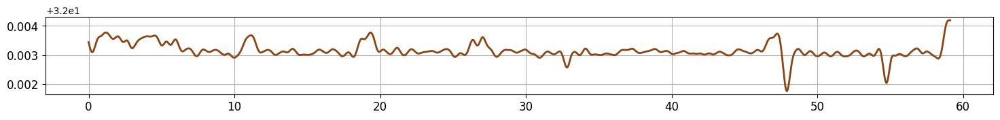

In [50]:
PS = 'SKT A'
draw_wave_filter(df_biopac_marker, PS)

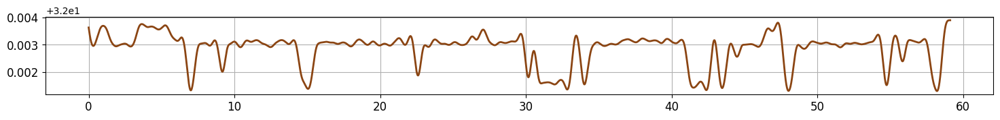

In [51]:
PS = 'SKT B'
draw_wave_filter(df_biopac_marker, PS)

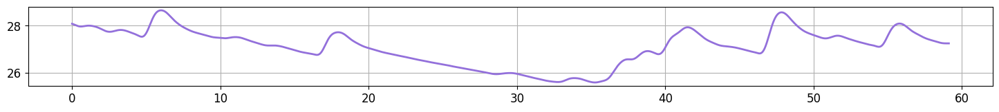

In [52]:
PS = 'EDA'
draw_wave_filter(df_biopac_marker, PS)

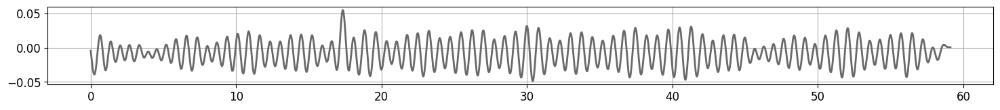

In [53]:
PS = 'ECG'
draw_wave_filter(df_biopac_marker, PS)

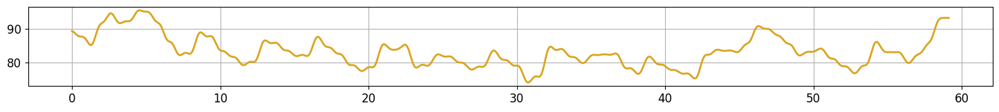

In [54]:
PS = 'ECG rate'
draw_wave_filter(df_biopac_marker, PS)

### 采样后数据

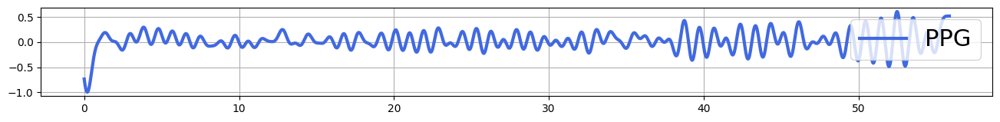

In [468]:
PS = 'PPG'
draw_wave_filter(df_biopac_marker_downsampled, PS)

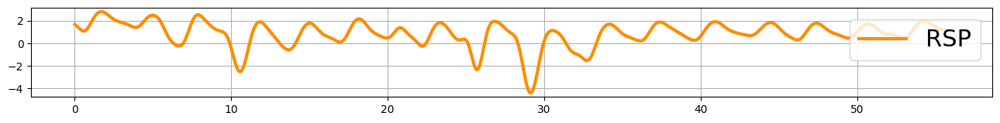

In [469]:
PS = 'RSP'
draw_wave_filter(df_biopac_marker_downsampled, PS)

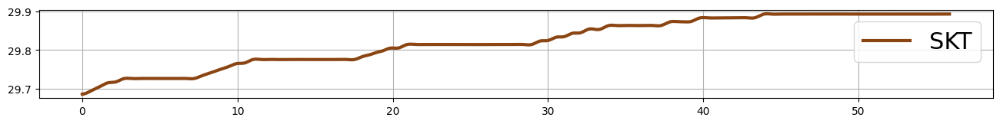

In [470]:
PS = 'SKT A'
draw_wave_filter(df_biopac_marker_downsampled, PS)

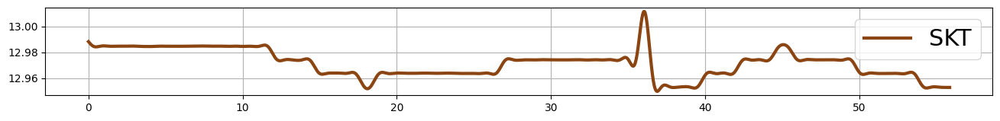

In [471]:
PS = 'SKT B'
draw_wave_filter(df_biopac_marker_downsampled, PS)

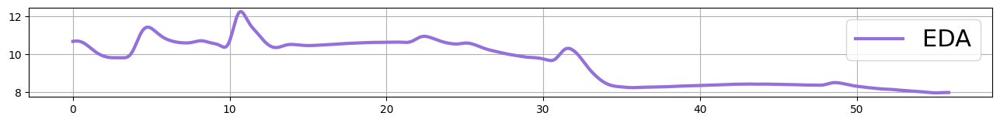

In [472]:
PS = 'EDA'
draw_wave_filter(df_biopac_marker_downsampled, PS)

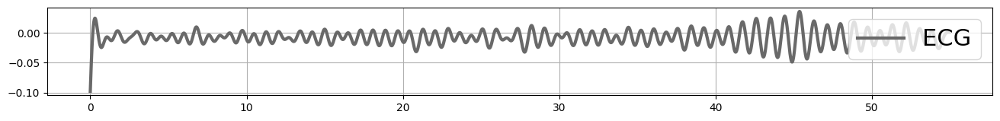

In [484]:
PS = 'ECG'
draw_wave_filter(df_biopac_marker_downsampled, PS)

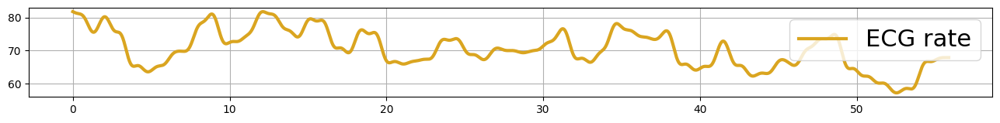

In [474]:
PS = 'ECG rate'
draw_wave_filter(df_biopac_marker_downsampled, PS)

# neurokit2

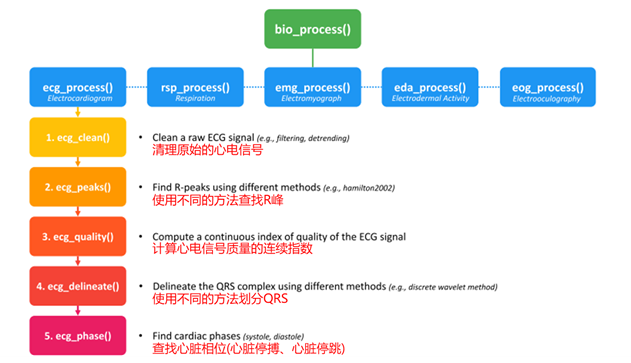

## 间隔相关特征（Interval-related Analysis）

### ECG

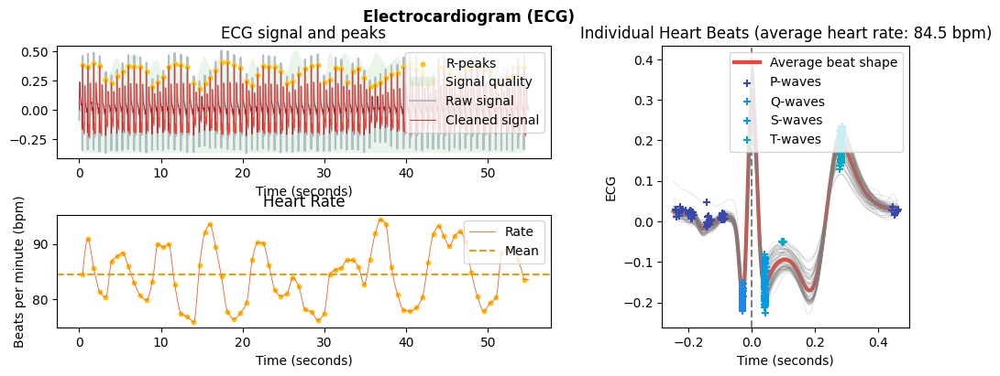

In [5]:
ecg = df_biopac_marker['ECG'].to_numpy()
signals, info = nk.ecg_process(ecg, sampling_rate=1000) # 对ECG数据进行预处理，并计算出各种特征，如心跳间隔、心率等
nk.ecg_plot(signals, info)

#### 提取并可视化单次心跳

- 本示例展示了如何使用 NeuroKit 从心电图 (ECG) 中提取 QRS 波群（单个心跳）并将其可视化。

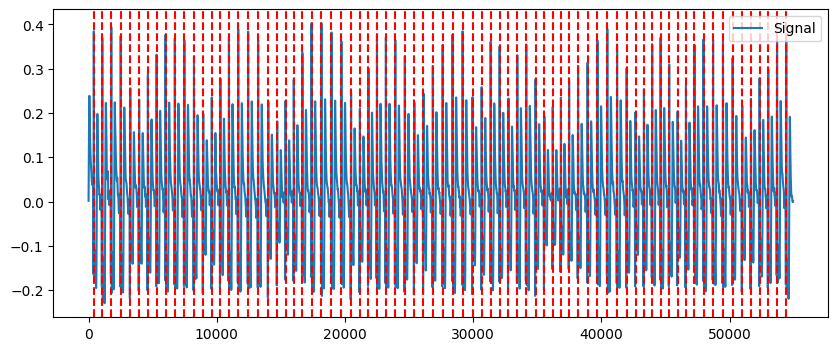

In [6]:
# Extract clean ECG and R-peaks location
rpeaks = info["ECG_R_Peaks"]
cleaned_ecg = signals["ECG_Clean"]
# Visualize R-peaks in ECG signal
plot = nk.events_plot(rpeaks, cleaned_ecg)

一旦我们知道了 R 峰的位置，我们就可以在其周围创建信号窗口（长度为 1 秒，R 峰前400毫秒，后600毫秒），我们可以将其称为epochs。   
对心脏搏动周围的信号进行分段

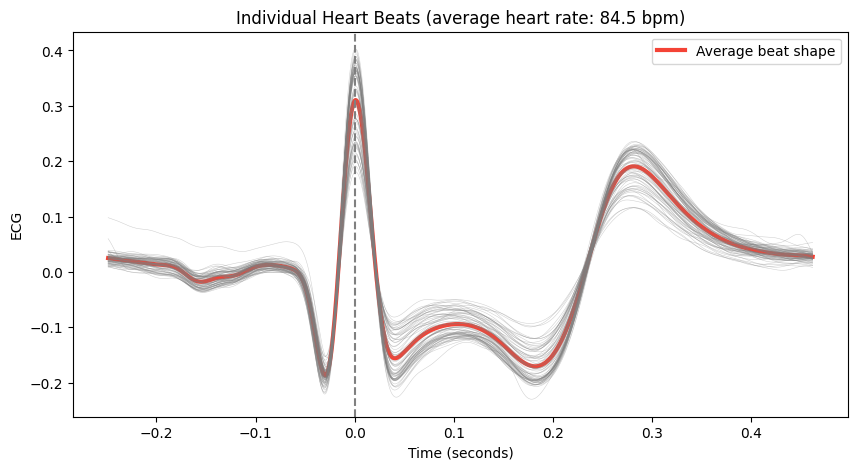

In [7]:
# 从 ECG 信号中提取心跳数据，并将其可视化为单个心跳的叠加图
epochs = nk.ecg_segment(cleaned_ecg, rpeaks=None, sampling_rate=1000, show=True)

In [8]:
# Define a function to create epochs
def extract_heartbeats(cleaned, peaks, sampling_rate=None): 
    heartbeats = nk.epochs_create(cleaned, 
                                  events=peaks, 
                                  epochs_start=-0.3, 
                                  epochs_end=0.4, 
                                  sampling_rate=sampling_rate)
    heartbeats = nk.epochs_to_df(heartbeats)
    return heartbeats
    
heartbeats = extract_heartbeats(cleaned_ecg, peaks=rpeaks, sampling_rate=1000)
heartbeats

,Signal,Index,Label,Time
0,0.155683,108,1,-0.300000
1,0.153866,109,1,-0.298999
2,0.152119,110,1,-0.297997
3,0.150436,111,1,-0.296996
4,0.148815,112,1,-0.295994
...,...,...,...,...
53895,0.016615,54813,77,0.395994
53896,0.016116,54814,77,0.396996
53897,0.015619,54815,77,0.397997
53898,0.015134,54816,77,0.398999


共有77 个心跳， 在 0.7 秒的时间窗口内包含 700 个时间点

In [9]:
heartbeats_pivoted = heartbeats.pivot(index='Time', columns='Label', values='Signal')
heartbeats_pivoted

Label,1,10,11,12,13,14,15,16,17,18,...,70,71,72,73,74,75,76,77,8,9
Time,,,,,,,,,,,,,,,,,,,,,
-0.300000,0.155683,0.041050,0.039093,0.039255,0.041326,0.042811,0.041016,0.058257,0.031441,0.032944,...,0.023461,0.032501,0.030307,0.039469,0.043151,0.043147,0.040821,0.062726,0.047831,0.044041
-0.298999,0.153866,0.040858,0.038999,0.039088,0.040974,0.042221,0.040598,0.057413,0.031256,0.032189,...,0.023028,0.032538,0.030226,0.039342,0.042542,0.041990,0.039784,0.062571,0.047118,0.043663
-0.297997,0.152119,0.040668,0.038889,0.038880,0.040632,0.041641,0.040233,0.056559,0.031103,0.031443,...,0.022700,0.032537,0.030161,0.039238,0.041998,0.040876,0.038725,0.062379,0.046400,0.043283
-0.296996,0.150436,0.040472,0.038764,0.038632,0.040303,0.041073,0.039918,0.055695,0.030972,0.030720,...,0.022477,0.032495,0.030101,0.039154,0.041524,0.039812,0.037637,0.062150,0.045674,0.042893
-0.295994,0.148815,0.040275,0.038626,0.038348,0.039992,0.040522,0.039647,0.054824,0.030866,0.030023,...,0.022346,0.032411,0.030039,0.039089,0.041117,0.038805,0.036516,0.061878,0.044945,0.042491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.395994,0.037500,0.053109,0.051460,0.046662,0.032112,0.033075,0.036792,0.046169,0.056853,0.054348,...,0.047171,0.048248,0.038188,0.038358,0.030566,0.034195,0.066154,0.016615,0.045133,0.051435
0.396996,0.037033,0.052624,0.050859,0.046230,0.031702,0.032579,0.036367,0.045678,0.055870,0.053753,...,0.046269,0.047904,0.037941,0.037966,0.030492,0.033012,0.065979,0.016116,0.044772,0.050487
0.397997,0.036548,0.052146,0.050331,0.045867,0.031271,0.032077,0.035983,0.045194,0.054850,0.053200,...,0.045424,0.047532,0.037634,0.037505,0.030419,0.031835,0.065791,0.015619,0.044409,0.049591


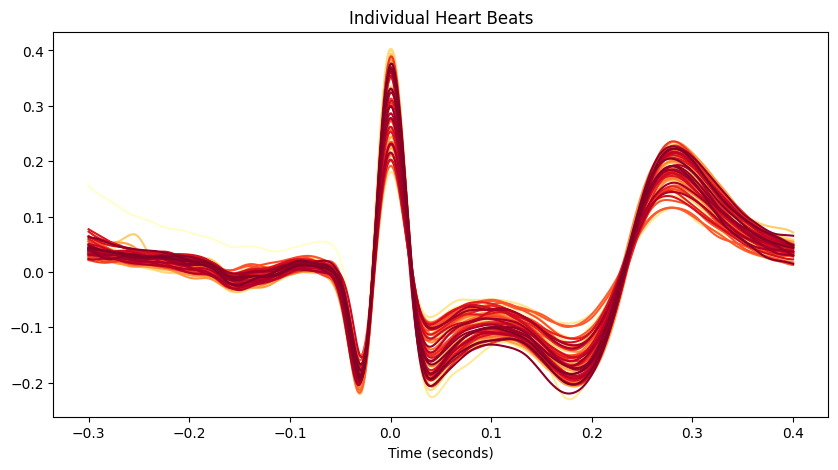

In [10]:
# Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))

ax.set_title("Individual Heart Beats")
ax.set_xlabel("Time (seconds)")

# Aesthetics
labels = list(heartbeats_pivoted)
labels = ['Channel ' + x for x in labels] # Set labels for each signal
cmap = iter(plt.cm.YlOrRd(np.linspace(0,1, int(heartbeats["Label"].nunique())))) # Get color map
lines = [] # Create empty list to contain the plot of each signal

for i, x, color in zip(labels, heartbeats_pivoted, cmap):
    line, = ax.plot(heartbeats_pivoted[x], label='%s' % i, color=color)
    lines.append(line)

#### 定位P、Q、S 和 T 波

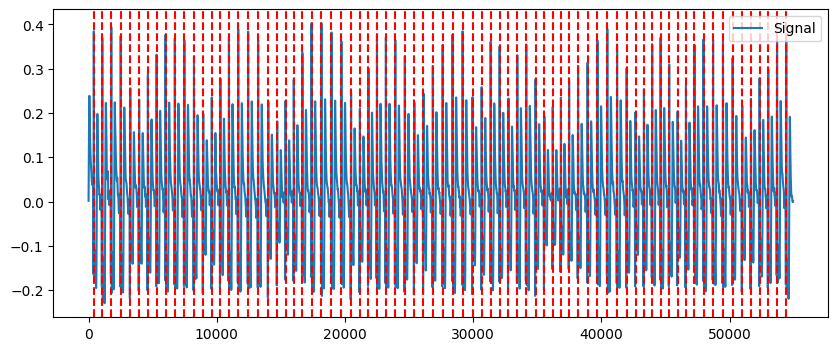

In [11]:
# Extract R-peaks locations
_, rpeaks = nk.ecg_peaks(cleaned_ecg, sampling_rate=1000)

# Visualize R-peaks in ECG signal
plot = nk.events_plot(rpeaks['ECG_R_Peaks'], cleaned_ecg)

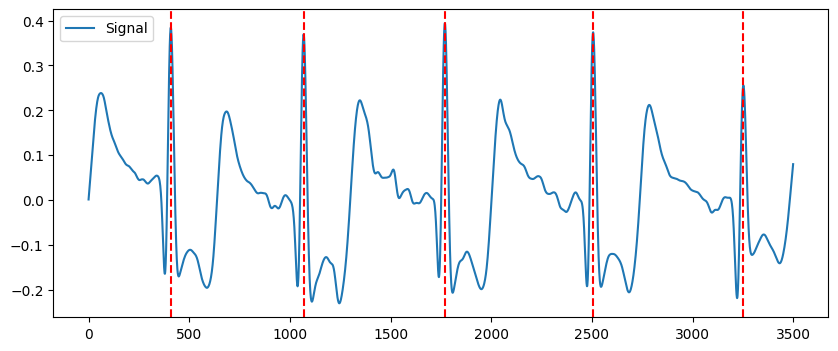

In [12]:
# Zooming into the first 5 R-peaks
plot = nk.events_plot(rpeaks['ECG_R_Peaks'][:5], cleaned_ecg[:3500])

- Peak method

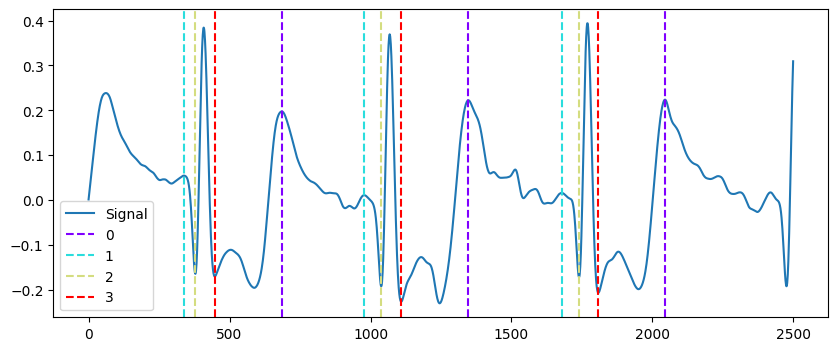

In [13]:
# Delineate the ECG signal
_, waves_peak = nk.ecg_delineate(cleaned_ecg, rpeaks, sampling_rate=1000, method="peak")

# Zooming into the first 3 R-peaks, with focus on T_peaks, P-peaks, Q-peaks and S-peaks
plot = nk.events_plot([waves_peak['ECG_T_Peaks'][:3], 
                       waves_peak['ECG_P_Peaks'][:3],
                       waves_peak['ECG_Q_Peaks'][:3],
                       waves_peak['ECG_S_Peaks'][:3]], cleaned_ecg[:2500])

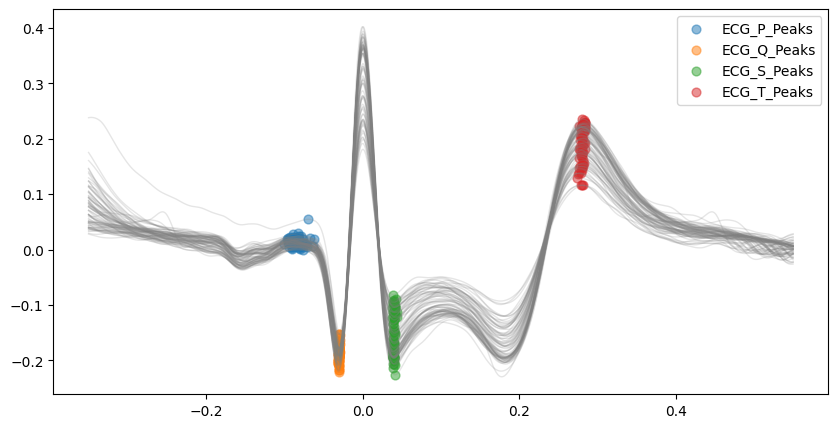

In [14]:
# Delineate the ECG signal and visualizing all peaks of ECG complexes
_, waves_peak = nk.ecg_delineate(cleaned_ecg, 
                                 rpeaks, 
                                 sampling_rate=1000, 
                                 method="peak", 
                                 show=True, 
                                 show_type='peaks')

##### Continuous Wavelet Method (CWT)

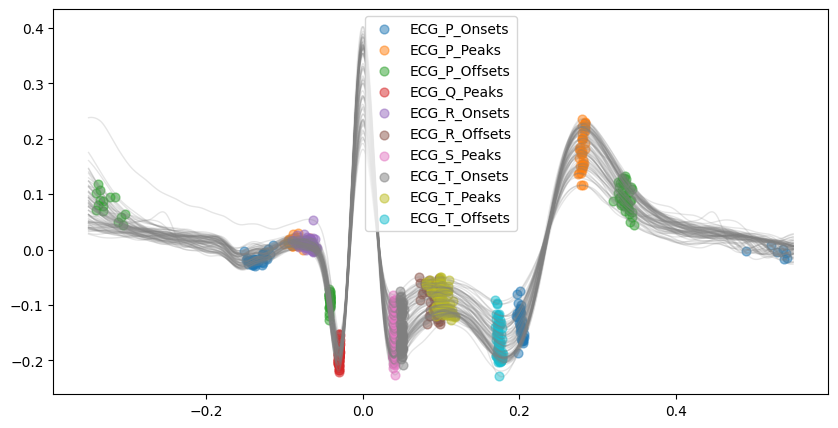

In [15]:
# Delineate the ECG signal
signal_cwt, waves_cwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="cwt", 
                                         show=True, 
                                         show_type='all')

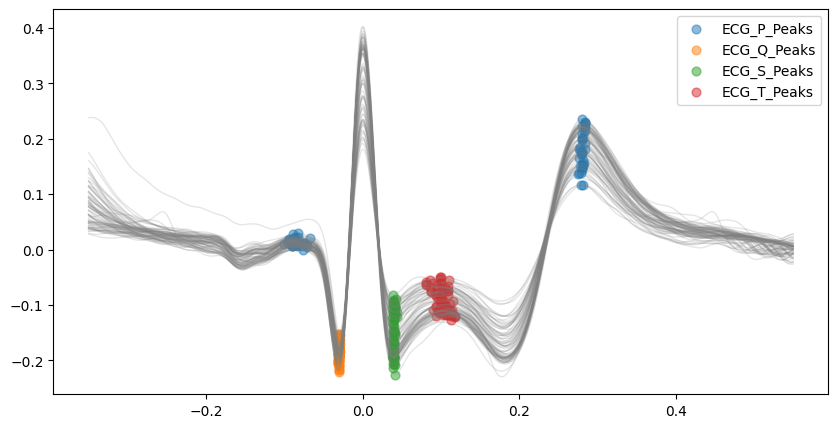

In [16]:
# Visualize P-peaks and T-peaks
signal_cwt, waves_cwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="cwt", 
                                         show=True, 
                                         show_type='peaks')

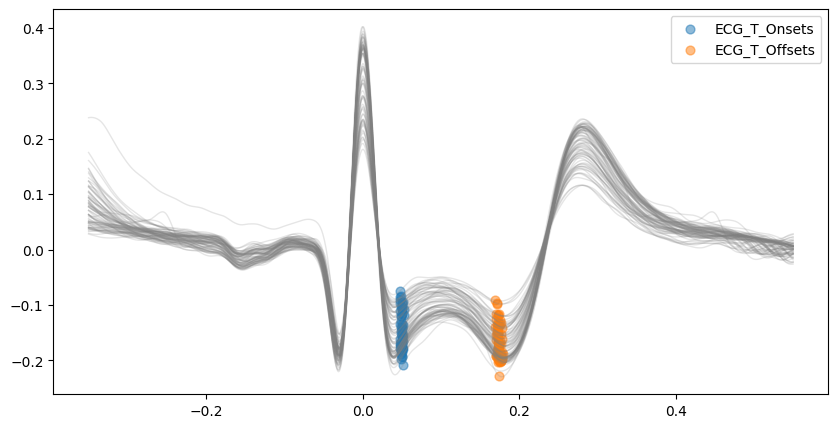

In [17]:
# Visualize T-waves boundaries
signal_cwt, waves_cwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="cwt", 
                                         show=True, 
                                         show_type='bounds_T')

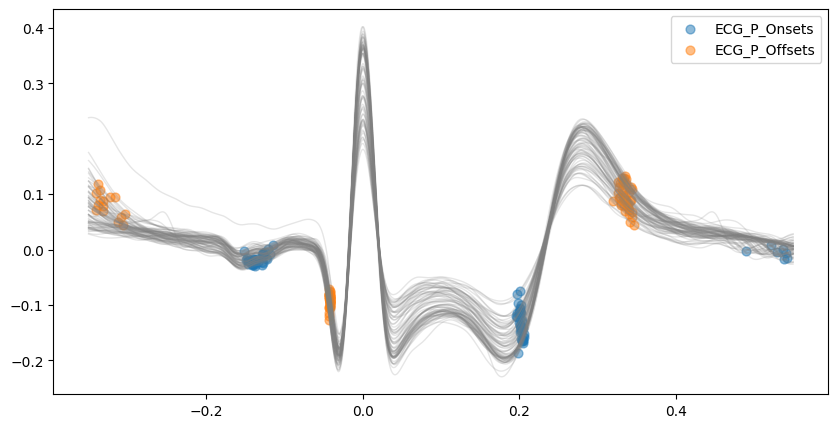

In [18]:
# Visualize P-waves boundaries
signal_cwt, waves_cwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="cwt", 
                                         show=True, 
                                         show_type='bounds_P')

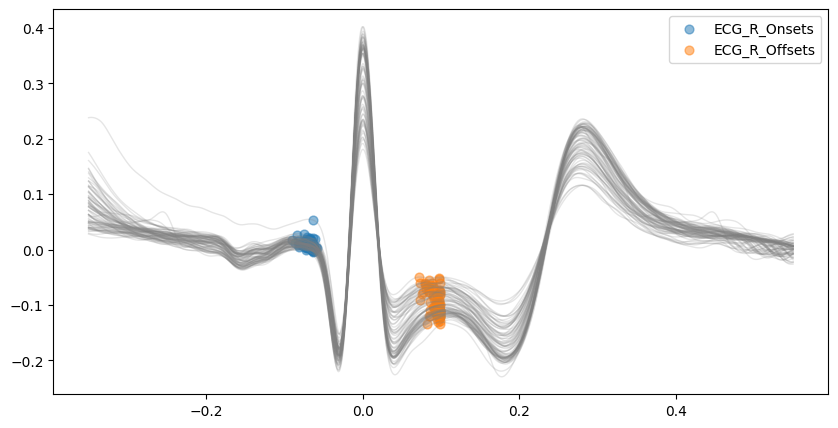

In [19]:
# Visualize R-waves boundaries
signal_cwt, waves_cwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="cwt", 
                                         show=True, 
                                         show_type='bounds_R')

##### Discrete Wavelet Method (DWT)

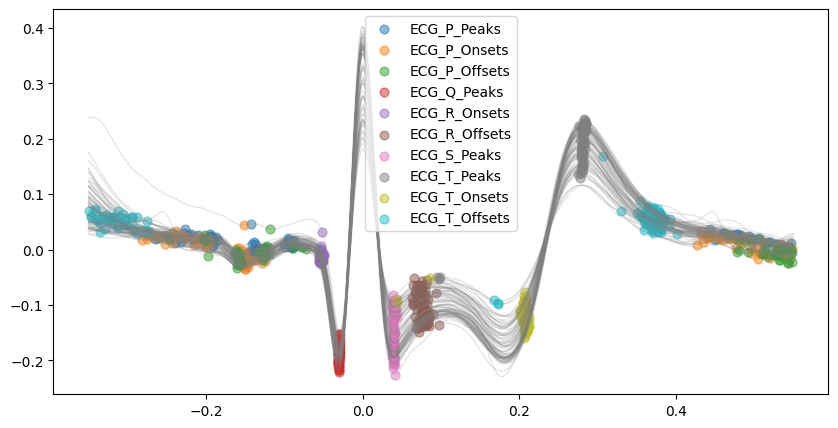

In [20]:
# Delineate the ECG signal
signal_dwt, waves_dwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="dwt", 
                                         show=True, 
                                         show_type='all')

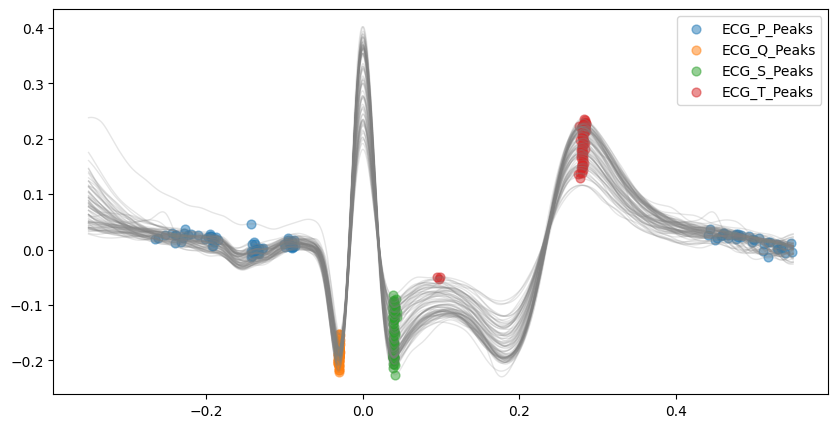

In [21]:
# Visualize P-peaks and T-peaks
signal_dwt, waves_dwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="dwt", 
                                         show=True, 
                                         show_type='peaks')

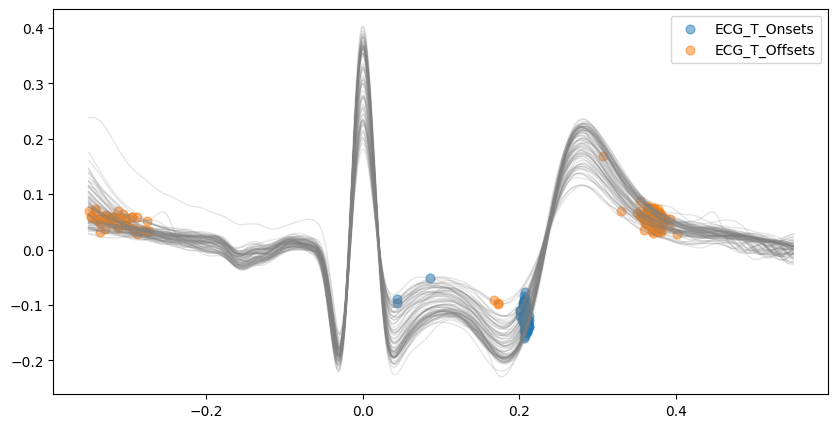

In [20]:
# visualize T-wave boundaries
signal_dwt, waves_dwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="dwt", 
                                         show=True, 
                                         show_type='bounds_T')

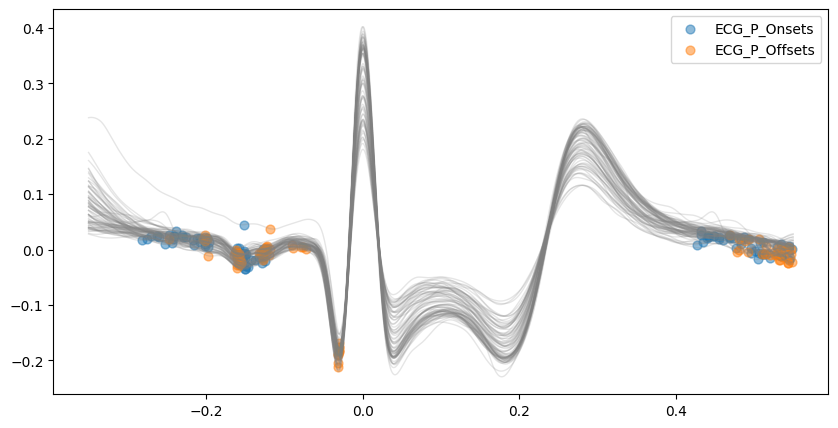

In [21]:
# Visualize P-wave boundaries
signal_dwt, waves_dwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="dwt", 
                                         show=True, 
                                         show_type='bounds_P')

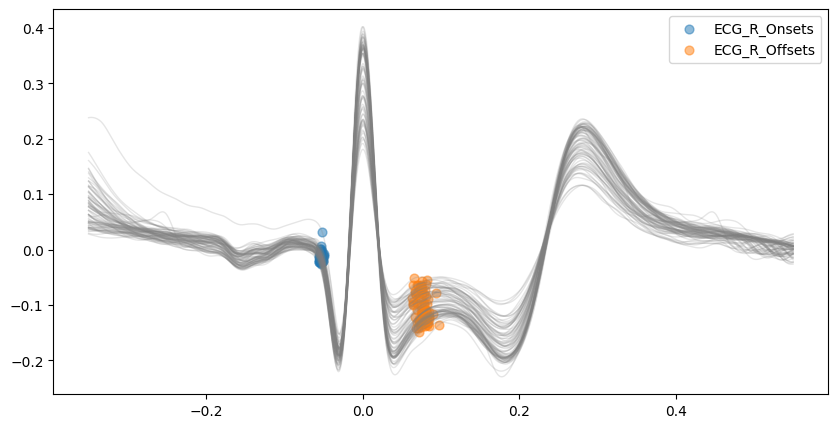

In [22]:
# Visualize R-wave boundaries
signal_dwt, waves_dwt = nk.ecg_delineate(cleaned_ecg, 
                                         rpeaks, 
                                         sampling_rate=1000, 
                                         method="dwt", 
                                         show=True, 
                                         show_type='bounds_R')

### HRV

心率变异是指连续心跳之间的时间变化   
Time domain: RMSSD, MeanNN, SDNN, SDSD, CVNN, etc.   
Frequency domain: Spectral power density in various frequency bands (Ultra low/ULF, Very low/VLF, Low/LF, High/HF, Very high/VHF), Ratio of LF to HF power, Normalized LF (LFn) and HF (HFn), Log transformed HF (LnHF).   
Nonlinear domain: Spread of RR intervals (SD1, SD2, ratio between SD2 to SD1), Cardiac Sympathetic Index (CSI), Cardial Vagal Index (CVI), Modified CSI, Sample Entropy (SampEn).

In [22]:
peaks, info = nk.ecg_peaks(df_biopac_marker['ECG'].to_numpy(), sampling_rate=1000)

- Time-Domain Analysis

,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,HRV_SDSD,...,HRV_IQRNN,HRV_SDRMSSD,HRV_Prc20NN,HRV_Prc80NN,HRV_pNN50,HRV_pNN20,HRV_MinNN,HRV_MaxNN,HRV_HTI,HRV_TINN
0,710.657895,44.030763,NaN,NaN,NaN,NaN,NaN,NaN,32.617582,32.82768,...,76.75,1.349909,666.0,757.0,14.473684,47.368421,636.0,794.0,9.5,62.5


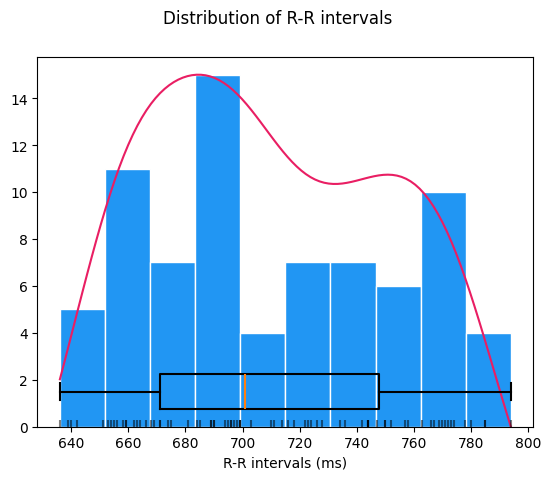

In [23]:
hrv_time = nk.hrv_time(peaks, sampling_rate=1000, show=True)
hrv_time

- Frequency-Domain Analysis

,HRV_ULF,HRV_VLF,HRV_LF,HRV_HF,HRV_VHF,HRV_TP,HRV_LFHF,HRV_LFn,HRV_HFn,HRV_LnHF
0,NaN,NaN,0.060266,0.051138,0.001188,0.112592,1.178488,0.53526,0.454192,-2.97322


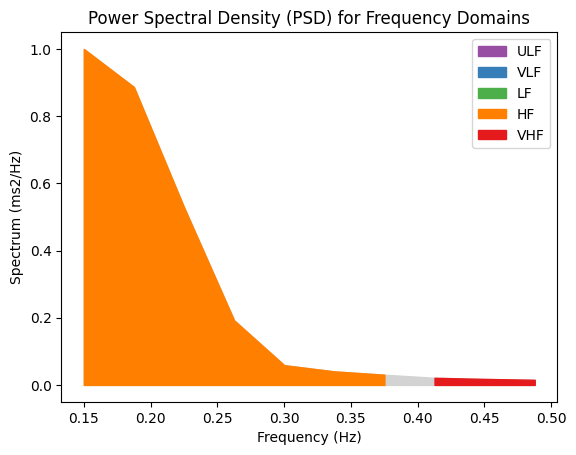

In [20]:
hrv_freq = nk.hrv_frequency(peaks, sampling_rate=1000, show=True, normalize=True)
hrv_freq

- Non-Linear Domain Analysis

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(


,HRV_SD1,HRV_SD2,HRV_SD1SD2,HRV_S,HRV_CSI,HRV_CVI,HRV_CSI_Modified,HRV_PIP,HRV_IALS,HRV_PSS,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,23.212675,57.911182,0.400832,4223.159642,2.494809,4.332608,577.909271,0.328947,0.328767,0.375,...,1.609438,5.89589,1.19291,1.1234,1.207518,1.579032,1.900169,1.760995,2.566662,0.986515


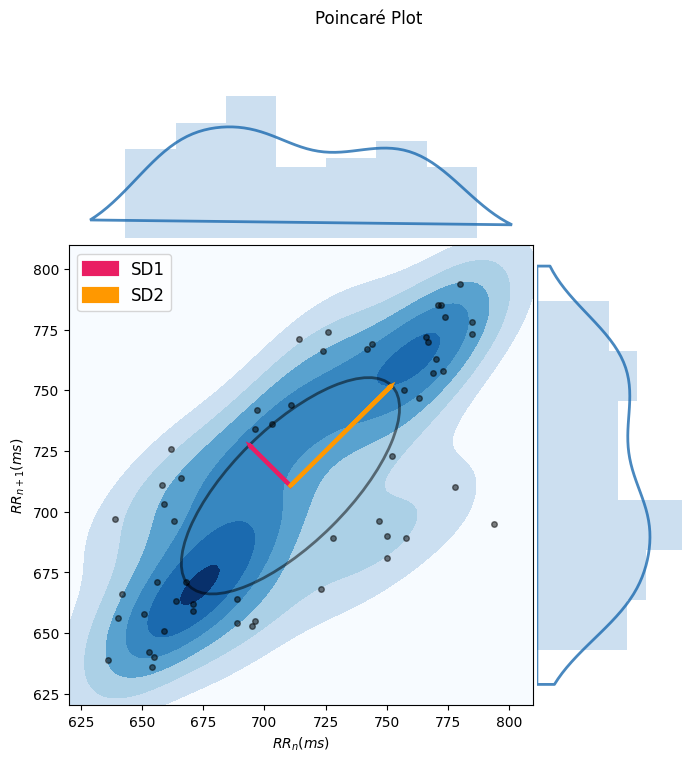

In [22]:
hrv_nonlinear = nk.hrv_nonlinear(peaks, sampling_rate=1000, show=True)
hrv_nonlinear

- All Domains

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=0.5, w_pad=0.5)


,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,HRV_SDSD,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,710.657895,44.030763,NaN,NaN,NaN,NaN,NaN,NaN,32.617582,32.82768,...,1.609438,5.89589,1.19291,1.1234,1.207518,1.579032,1.900169,1.760995,2.566662,0.986515


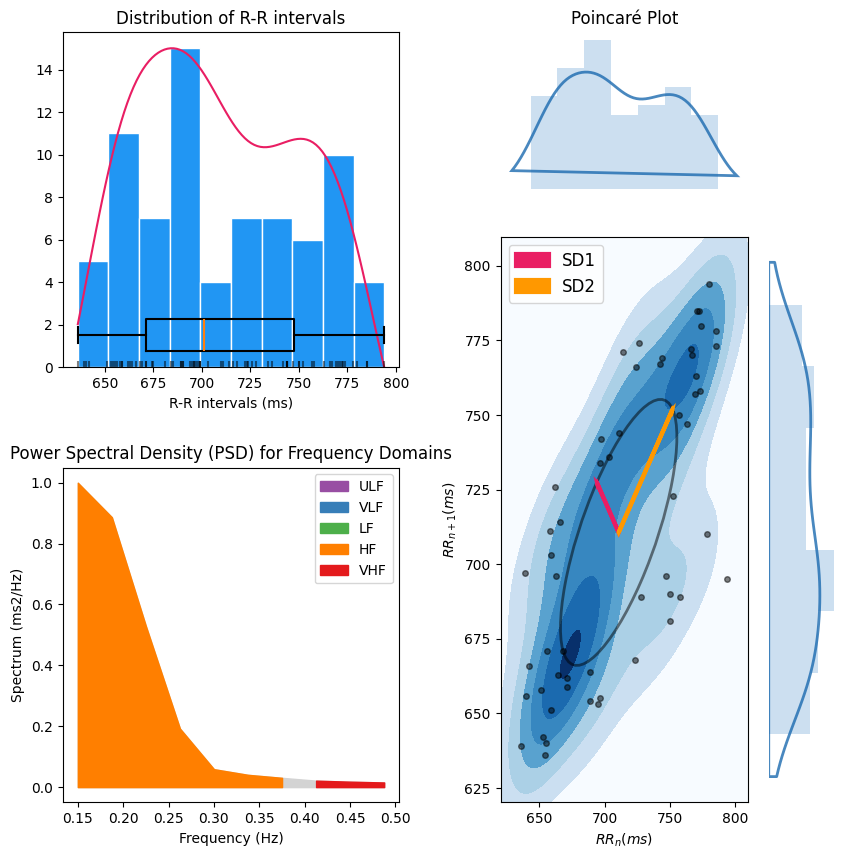

In [8]:
hrv_indices = nk.hrv(peaks, sampling_rate=1000, show=True)
hrv_indices

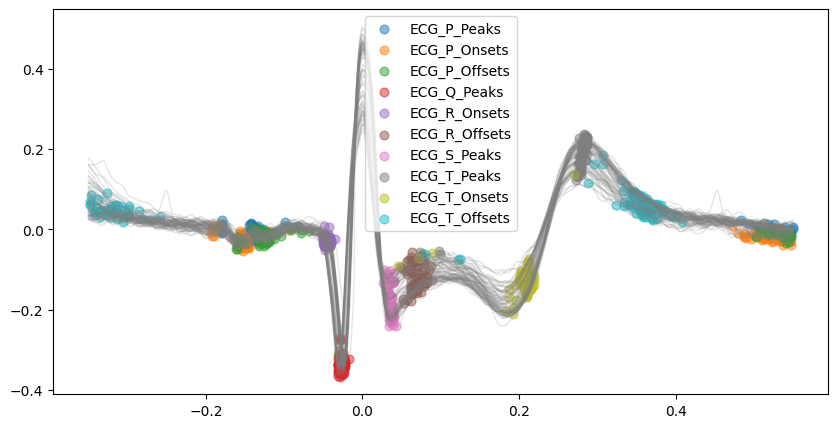

In [9]:
# Extract R-peaks locations
_, rpeaks = nk.ecg_peaks(df_biopac_marker['ECG'].to_numpy(), sampling_rate=1000)

# Delineate
signal, waves = nk.ecg_delineate(df_biopac_marker['ECG'].to_numpy(), rpeaks, sampling_rate=1000, 
                                 method="dwt", show=True, show_type='all')

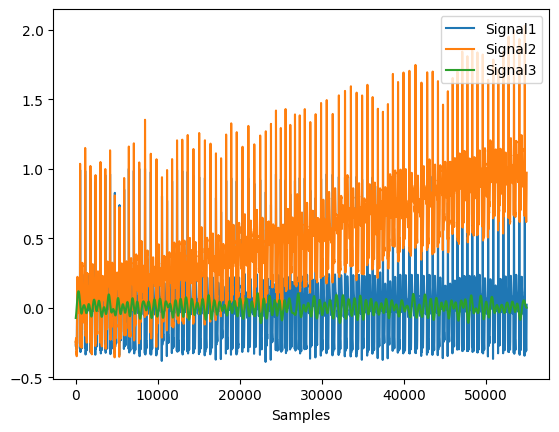

In [91]:
original = df_biopac_marker['ECG'].to_numpy()

distorted = nk.signal_distort(original,
                              noise_amplitude=0.1,
                              noise_frequency=[5, 10, 20],
                              powerline_amplitude=0.05,
                              artifacts_amplitude=0.3,
                              artifacts_number=3,
                              linear_drift=0.5)

# Clean (filter and detrend)
cleaned = nk.signal_detrend(distorted)
cleaned = nk.signal_filter(cleaned, lowcut=0.5, highcut=1.5)

# Compare the 3 signals
plot = nk.signal_plot([original, distorted, cleaned])

### RSP

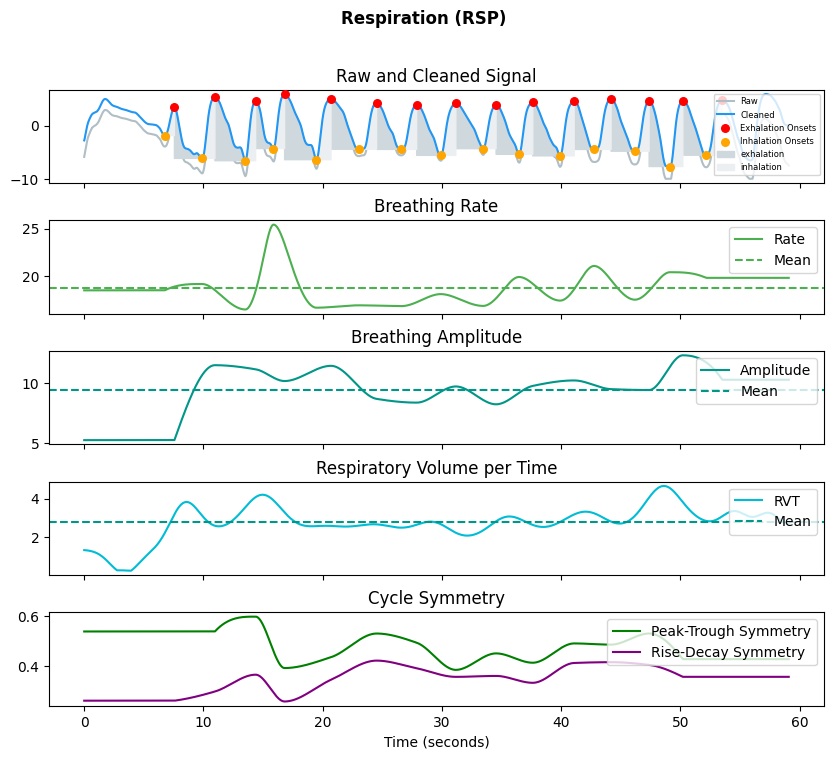

In [60]:
rsp = df_biopac_marker['RSP'].to_numpy()
signals, info = nk.rsp_process(rsp, sampling_rate=1000)
nk.rsp_plot(signals, info)

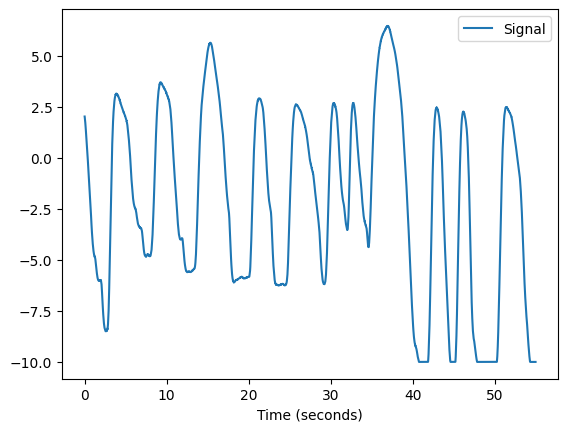

In [26]:
nk.signal_plot(rsp, sampling_rate=1000) # Visualize

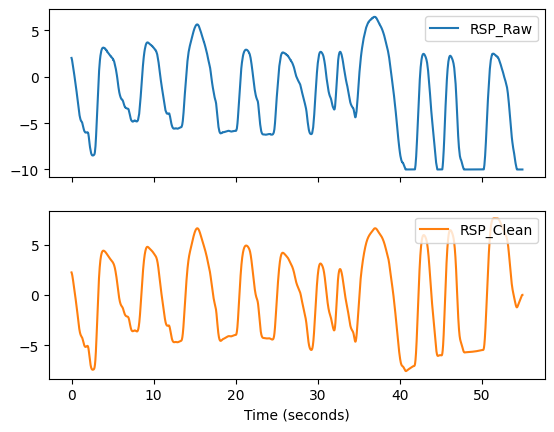

In [28]:
# Clean signal
cleaned = nk.rsp_clean(rsp, sampling_rate=1000)

# Extract peaks
df, peaks_dict = nk.rsp_peaks(cleaned) 
info = nk.rsp_fixpeaks(peaks_dict)
formatted = nk.signal_formatpeaks(info, desired_length=len(cleaned),peak_indices=info["RSP_Peaks"])

nk.signal_plot(pd.DataFrame({"RSP_Raw": rsp, "RSP_Clean": cleaned}), sampling_rate=1000, subplots=True)

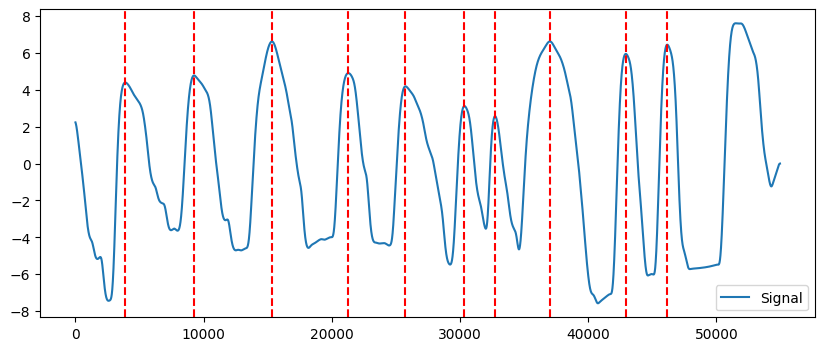

In [29]:
candidate_peaks = nk.events_plot(peaks_dict['RSP_Peaks'], cleaned)

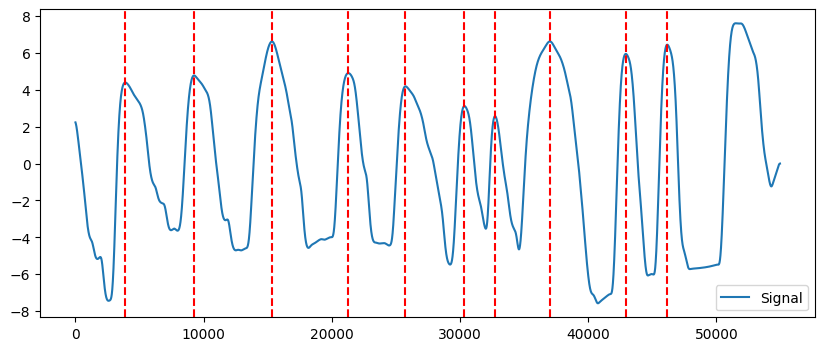

In [30]:
fixed_peaks = nk.events_plot(info['RSP_Peaks'], cleaned)

Text(0, 0.5, 'Breaths Per Minute')

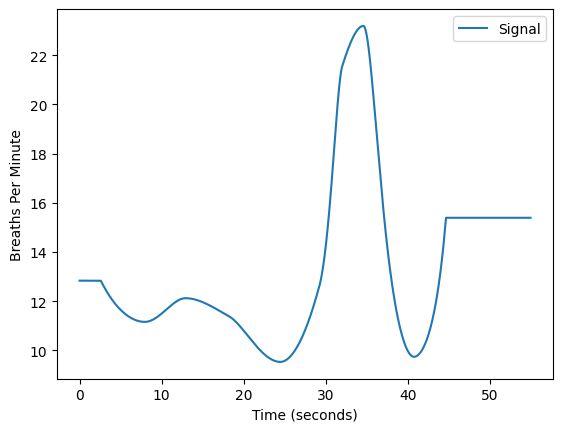

In [32]:
# Extract rate
rsp_rate = nk.rsp_rate(cleaned, peaks_dict, sampling_rate=1000)

# Visualize
nk.signal_plot(rsp_rate, sampling_rate=1000)
plt.ylabel('Breaths Per Minute')

,RRV_RMSSD,RRV_MeanBB,RRV_SDBB,RRV_SDSD,RRV_CVBB,RRV_CVSD,RRV_MedianBB,RRV_MadBB,RRV_MCVBB,RRV_VLF,RRV_LF,RRV_HF,RRV_LFHF,RRV_LFn,RRV_HFn,RRV_SD1,RRV_SD2,RRV_SD2SD1,RRV_ApEn,RRV_SampEn
0,1785.514702,4674.111111,1336.213909,1898.549879,0.285876,0.382001,4949.0,1558.2126,0.314854,NaN,0.02126,0.000302,70.514977,NaN,NaN,1342.477494,1329.920825,0.990647,0.133531,-inf


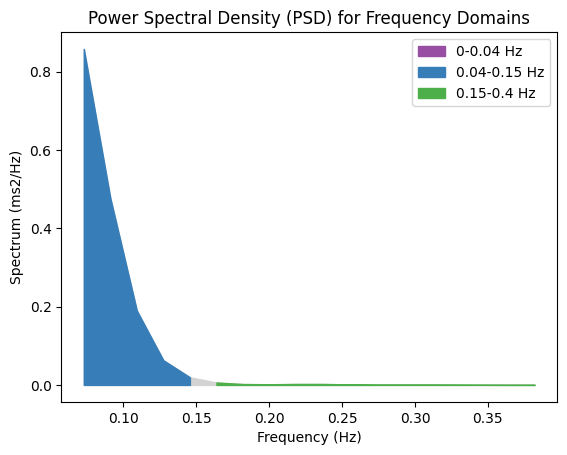

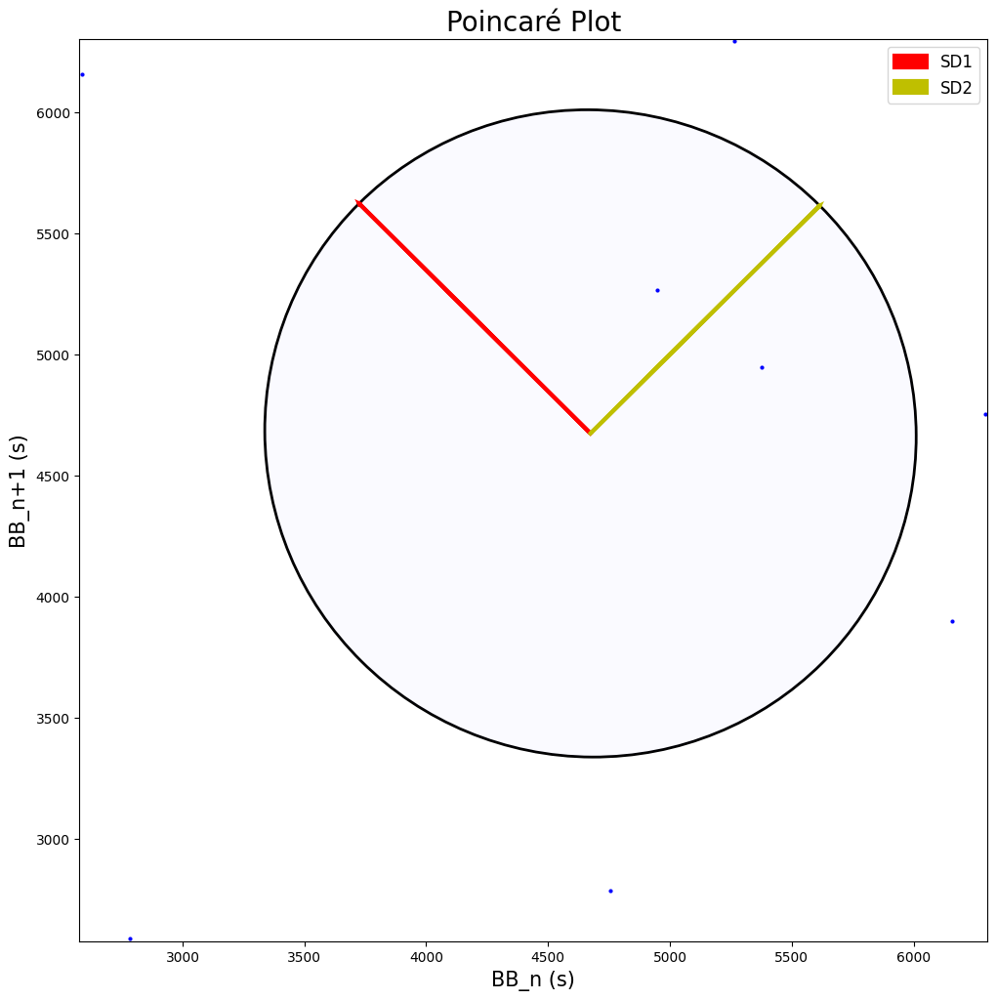

In [33]:
rrv = nk.rsp_rrv(rsp_rate, info, sampling_rate=1000, show=True)
rrv

### PPG

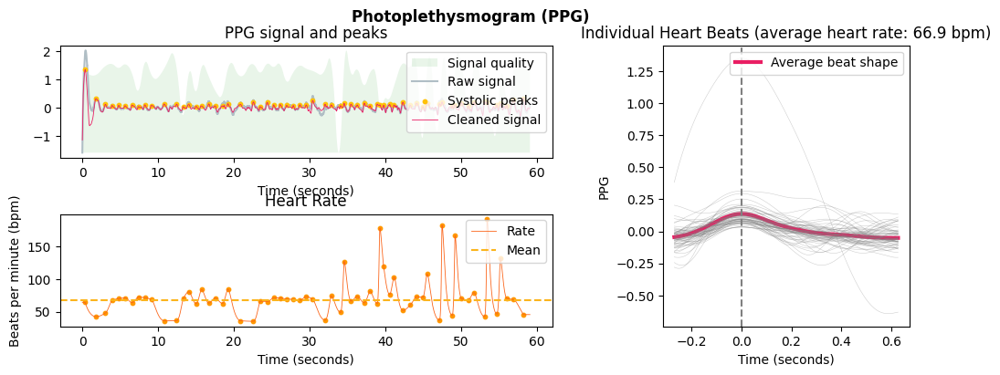

In [110]:
ppg = df_biopac_marker['PPG'].to_numpy()
signals, info = nk.ppg_process(ppg, sampling_rate=1000)
nk.ppg_plot(signals, info)

### EDA

可以将 EDA 信号分解为相位（phasic）和强直（tonic）两个部分，即相位皮肤传导反应（SCR）和强直皮肤传导水平（SCL）。SCR 代表与刺激相关的快速变化信号，而 SCL 则是缓慢变化的连续信号。将这两个信号分开有助于更准确地估计真实的 SCR 幅值。

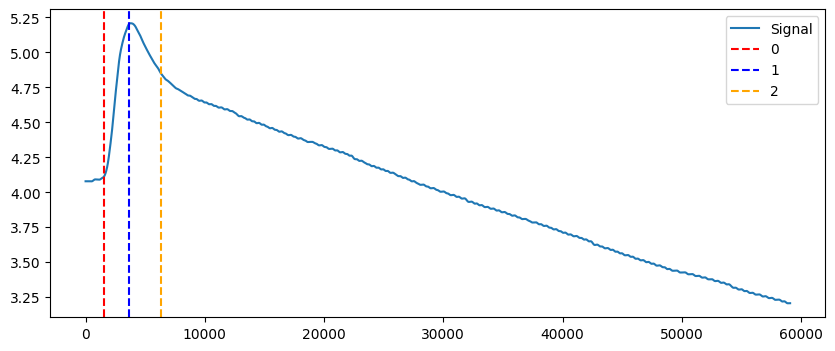

In [82]:
eda = df_biopac_marker['EDA'].to_numpy()
signals, info = nk.eda_process(eda, sampling_rate=1000)

# 提取干净的 EDA 和皮肤传导反应 (SCR) 特征
cleaned = signals["EDA_Clean"]
features = [info["SCR_Onsets"], info["SCR_Peaks"], info["SCR_Recovery"]]

# Visualize SCR features in cleaned EDA signal
plot = nk.events_plot(features, cleaned, color=['red', 'blue', 'orange'])

In [27]:
# Filter phasic and tonic components
data = nk.eda_phasic(nk.standardize(cleaned), sampling_rate=1000)

data

,EDA_Tonic,EDA_Phasic
0,1.732975,-0.168666
1,1.732989,-0.168492
2,1.733003,-0.168316
3,1.733016,-0.168139
4,1.733030,-0.167960
...,...,...
54949,-1.197401,-0.000428
54950,-1.197401,-0.000395
54951,-1.197401,-0.000362
54952,-1.197401,-0.000329


<Axes: >

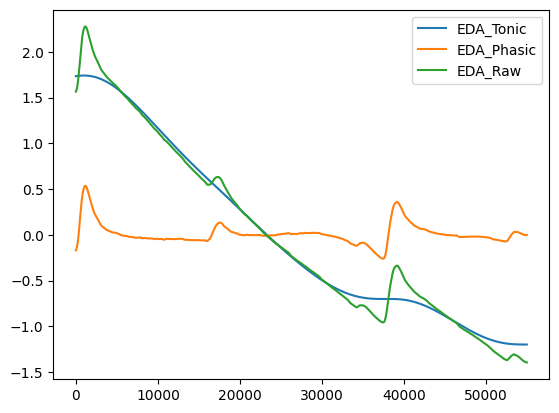

In [30]:
data["EDA_Raw"] = nk.standardize(cleaned)  # Add raw signal
data.plot()

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_plot.py:50: NeuroKitWarning: 'info' dict not provided. Some information might be missing. Sampling rate will be set to 1000 Hz.
  warn(


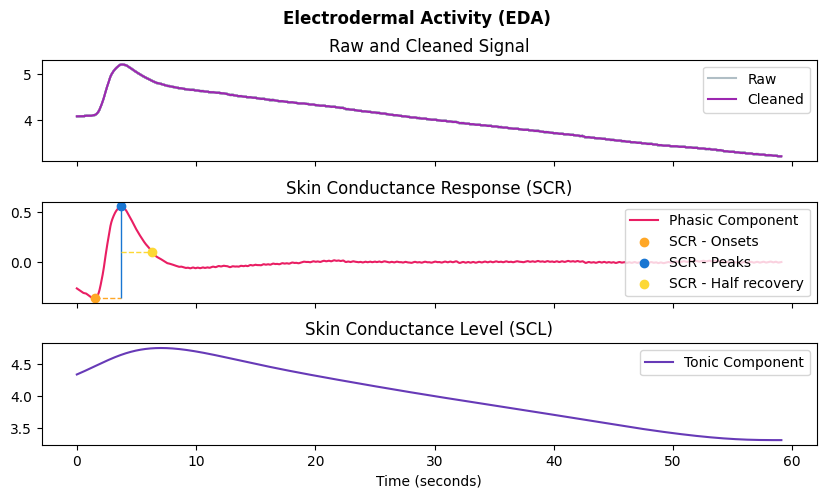

In [83]:
nk.eda_plot(signals)

### SKT

In [521]:
skt_signal = df_biopac_marker['SKT A'].to_numpy()
skt_signal

array([31.99755859, 32.        , 32.        , ..., 31.9987793 ,
       32.00061035, 31.9987793 ])

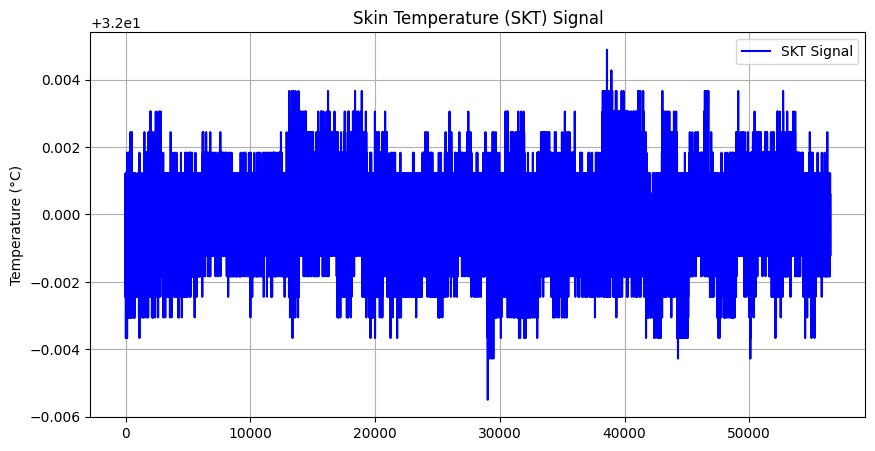

In [523]:
# 绘制SKT信号
plt.figure(figsize=(10, 5))  # 设置图像大小
plt.plot(skt_signal, color='b', label='SKT Signal')  # 绘制折线图
plt.title('Skin Temperature (SKT) Signal')  # 标题
# plt.xlabel('Time (s)')  # x轴标签
plt.ylabel('Temperature (°C)')  # y轴标签
plt.legend()  # 添加图例
plt.grid(True)  # 添加网格
plt.show()  # 显示图像

### 计算间隔相关特征

In [83]:
signals, info = get_signals('ECG', 1000, show=False)

ecg_fea = nk.ecg_intervalrelated(signals, sampling_rate=1000) # 基于已经处理过的 ECG 数据提取与心跳间隔（如 R-R 间隔）相关的特征
ecg_fea

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(


,ECG_Rate_Mean,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,93.037254,[[645.0714285714286]],[[48.76246475537237]],[[nan]],[[nan]],[[nan]],[[nan]],[[nan]],[[nan]],[[25.068100018833036]],...,[[1.1814999484738775]],[[5.960595250082444]],[[0.9269712252183195]],[[0.9164980103350313]],[[0.8023115424951468]],[[1.1052880889189662]],[[1.808114636876508]],[[1.5341690867208786]],[[2.357702430167518]],[[0.6848911524405815]]


In [84]:
signals, info = get_signals('RSP', 1000, show=False)

rsp_fea = nk.rsp_intervalrelated(signals, sampling_rate=1000)
rsp_fea

,RSP_Rate_Mean,RRV_RMSSD,RRV_MeanBB,RRV_SDBB,RRV_SDSD,RRV_CVBB,RRV_CVSD,RRV_MedianBB,RRV_MadBB,RRV_MCVBB,...,RAV_Mean,RAV_SD,RAV_RMSSD,RAV_CVSD,RSP_RVT,RSP_Symmetry_PeakTrough,RSP_Symmetry_RiseDecay,RSP_Phase_Duration_Inspiration,RSP_Phase_Duration_Expiration,RSP_Phase_Duration_Ratio
0,11.586098,4264.522614,5290.888889,3166.03184,4558.358788,0.598393,0.806013,5119.0,2462.5986,0.48107,...,10.521943,3.400294,4.72346,0.448915,1.976263,0.642794,0.506681,2.7185,2.456556,1.106631


In [85]:
signals, info = get_signals('PPG', 1000, show=False)

ppg_fea = nk.ppg_intervalrelated(signals, sampling_rate=1000)
ppg_fea

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(


,PPG_Rate_Mean,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,85.222271,712.171053,201.315367,NaN,NaN,NaN,NaN,NaN,NaN,267.38706,...,0.643754,6.027468,0.612172,0.856889,0.784025,0.787896,1.274669,1.845753,2.425536,0.904305


In [86]:
signals, info = get_signals('EDA', 1000, show=False)

eda_fea = nk.eda_intervalrelated(signals, sampling_rate=1000)
eda_fea

,SCR_Peaks_N,SCR_Peaks_Amplitude_Mean,EDA_Tonic_SD,EDA_Sympathetic,EDA_SympatheticN,EDA_Autocorrelation
0,9.0,0.289592,0.219561,NaN,NaN,0.313851


### 分割数据

In [142]:
signals, info = get_signals('ECG', 1000, show=False)
epochs = nk.epochs_create(signals, 
                          events=[0, 20000], # (0, 20000) (20000, 40000)
                          sampling_rate=1000, 
                          epochs_start=0, 
                          epochs_end=20) # 每个Segment时长20s
epochs

{'1':          ECG_Raw  ECG_Clean   ECG_Rate  ECG_Quality  ECG_R_Peaks  ECG_P_Peaks  \
 0.000  -0.272675  -0.103915  93.012955     0.498797            0            0   
 0.001  -0.270844  -0.102596  93.012955     0.498797            0            0   
 0.002  -0.267944  -0.101281  93.012955     0.498797            0            0   
 0.003  -0.266571  -0.099977  93.012955     0.498797            0            0   
 0.004  -0.264282  -0.098685  93.012955     0.498797            0            0   
 ...          ...        ...        ...          ...          ...          ...   
 19.996  0.077972   0.077771  86.199928     0.855290            0            0   
 19.997  0.072174   0.076147  86.192976     0.855558            0            0   
 19.998  0.067139   0.074494  86.186035     0.855826            0            0   
 19.999  0.062103   0.072838  86.179106     0.856093            0            0   
 20.000  0.057983   0.071201  86.172188     0.856359            0            0   
 
         

In [143]:
nk.ecg_intervalrelated(epochs)

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(


,Label,ECG_Rate_Mean,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
1,1,94.259061,[[636.2]],[[44.89789181749153]],[[nan]],[[nan]],[[nan]],[[nan]],[[nan]],[[nan]],...,[[1.3862943611198906]],[[4.640223928941852]],[[1.0225752580674923]],[[0.0]],[[0.0]],[[0.0]],[[1.9567248654051967]],[[1.6951225320338907]],[[2.278644499523949]],[[1.144941138975321]]
2,2,91.588867,[[653.8]],[[53.82436315429582]],[[nan]],[[nan]],[[nan]],[[nan]],[[nan]],[[nan]],...,[[1.9459101490553135]],[[4.906890595608518]],[[0.8797807581008252]],[[0.0]],[[0.0]],[[0.0]],[[2.1775355966470755]],[[1.3311898346586613]],[[1.7166513588362375]],[[0.8178150992680865]]


## 事件相关特征（Event-related Analysis）

In [7]:
events = {'onset':[ 1024,  4957,  9224, 12984],
         'duration': [300, 300, 300, 300],
         'label': ['1', '2', '3', '4'],
         'condition': ['Negative', 'Neutral', 'Neutral', 'Negative']}

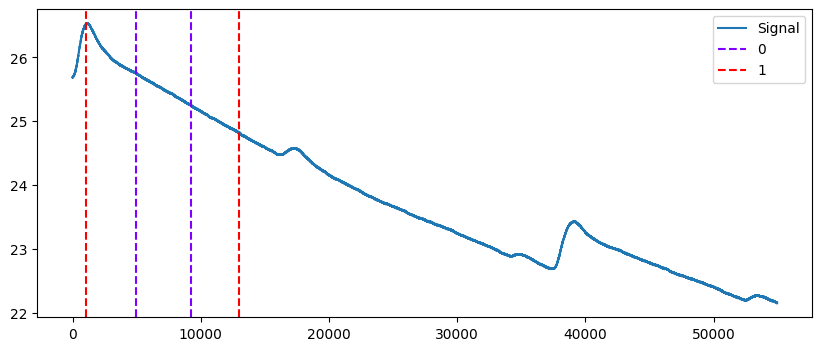

In [8]:
# Plot the location of event with the signals
plot = nk.events_plot(events, df_biopac_marker['EDA'].to_numpy())

array([<Axes: >, <Axes: >, <Axes: >], dtype=object)

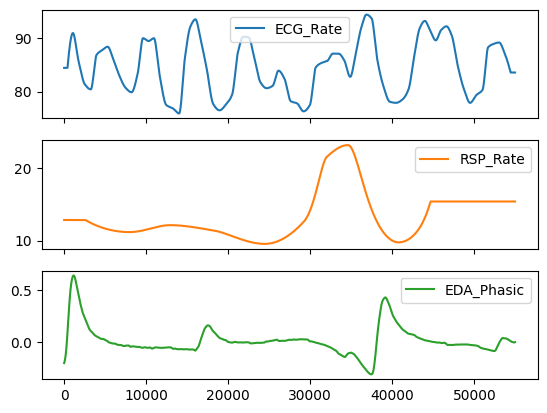

In [9]:
# Process the signal
data_clean, info = nk.bio_process(ecg=df_biopac_marker['ECG'].to_numpy(), 
                                  rsp=df_biopac_marker['RSP'].to_numpy(), 
                                  eda=df_biopac_marker['EDA'].to_numpy(), 
                                  sampling_rate=1000)

# Visualize some of the channels
data_clean[["ECG_Rate", "RSP_Rate", "EDA_Phasic"]].plot(subplots=True)

Create Epochs   
- Our epochs will then cover the region from -1 s to +6 s

In [10]:
# Build and plot epochs
epochs = nk.epochs_create(data_clean, events, sampling_rate=100, epochs_start=-1, epochs_end=6)

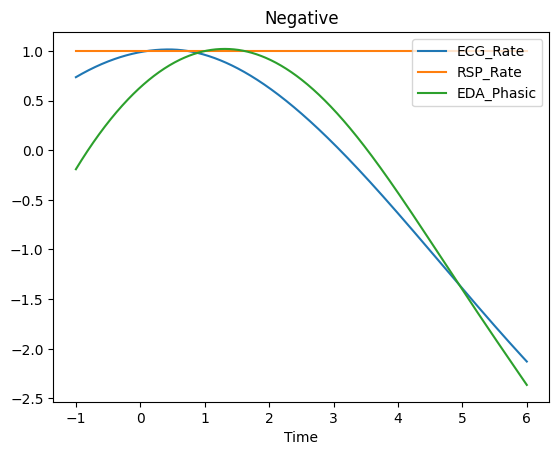

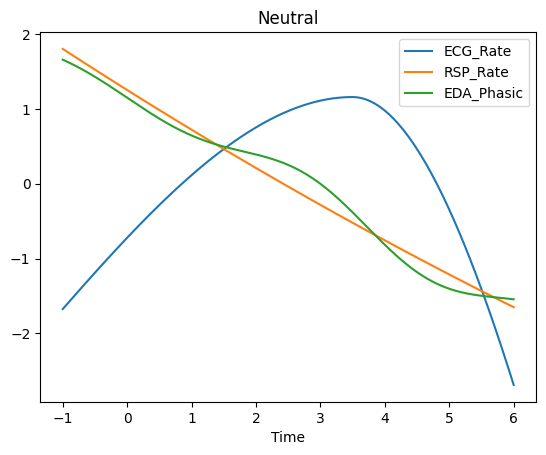

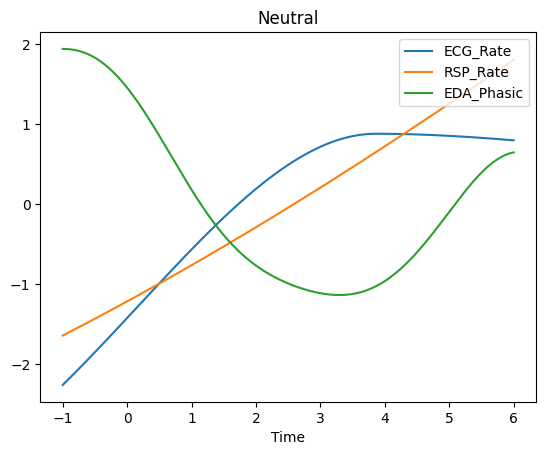

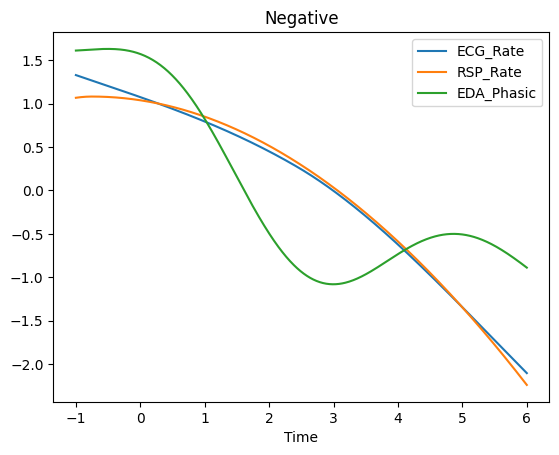

In [11]:
# Iterate through epoch data
for epoch in epochs.values():
    # Plot scaled signals
    nk.signal_plot(epoch[['ECG_Rate', 'RSP_Rate','EDA_Phasic']], 
                   title=epoch['Condition'].values[0],  # Extract condition name
                   standardize=True)  

### 手动提取事件相关特征

In [128]:
df = {}  # Initialize an empty dict to store the results
condition_list = ["Negative", "Neutral", "Neutral", "Negative"]   

# Iterate through epochs index and data
for epoch_index, epoch in epochs.items():
    df[epoch_index] = {}  # Initialize an empty dict inside of it
                            

    # Note: We will use the 100th value (corresponding to the event onset, 0s) as the baseline

    # ECG ====
    ecg_baseline = epoch["ECG_Rate"].values[100]  # Baseline
    ecg_mean = epoch["ECG_Rate"][0:4].mean()  # Mean heart rate in the 0-4 seconds
    # Store ECG in df
    df[epoch_index]["ECG_Rate_Mean"] = ecg_mean - ecg_baseline  # Correct for baseline

    # RSP ====
    rsp_baseline = epoch["RSP_Rate"].values[100]  # Baseline
    rsp_rate = epoch["RSP_Rate"][0:6].mean()  # Longer window for RSP that has a slower dynamic
    # Store RSP in df
    df[epoch_index]["RSP_Rate_Mean"] = rsp_rate - rsp_baseline  # Correct for baseline

    
    # EDA/SCR ====
    scr_max = epoch["SCR_Amplitude"][0:6].max()  # Maximum SCR peak
    # If no SCR, consider the magnitude, i.e. that the value is 0
    if np.isnan(scr_max):
        scr_max = 0  
    # Store SCR in df
    df[epoch_index]["SCR_Magnitude"] = scr_max

df = pd.DataFrame.from_dict(df, orient="index")  # Convert to a dataframe
df["Condition"] = condition_list  # Add the conditions
df  # Print DataFrame

,ECG_Rate_Mean,RSP_Rate_Mean,SCR_Magnitude,Condition
1,-0.110380,0.000000,0.0,Negative
2,1.063778,0.009027,0.0,Neutral
3,0.231924,-0.115637,0.0,Neutral
4,-1.122961,-0.059966,0.0,Negative


### 自动特征提取

In [129]:
df = nk.bio_analyze(epochs, sampling_rate=1000)
df

,Label,Condition,Event_Onset,ECG_Rate_Baseline,ECG_Rate_Max,ECG_Rate_Min,ECG_Rate_Mean,ECG_Rate_SD,ECG_Rate_Max_Time,ECG_Rate_Min_Time,...,RSP_RVT_Baseline,RSP_RVT_Mean,EDA_Peak_Amplitude,EDA_SCR,SCR_Peak_Amplitude,SCR_Peak_Amplitude_Time,SCR_RiseTime,SCR_RecoveryTime,RSA_P2T,RSA_Gates
1,1,Negative,1024,96.740967,0.189567,-2.113796,-0.588752,0.753368,1.253219,6.000000,...,1.112333,-0.201455,-0.053871,0,NaN,NaN,NaN,NaN,0.000000,1.776357e-15
2,2,Neutral,4957,103.860945,1.997502,0.005220,1.346687,0.608248,6.000000,0.011445,...,4.070213,0.475570,0.205784,0,NaN,NaN,NaN,NaN,0.000000,1.776357e-15
3,3,Neutral,9224,85.126662,1.038539,0.000500,0.422651,0.312204,6.000000,0.011445,...,1.113524,0.427888,-0.114198,0,NaN,NaN,NaN,NaN,-0.938158,1.776357e-15
4,4,Negative,12984,94.159300,-0.006419,-3.192570,-1.639502,0.898687,0.011445,6.000000,...,2.298626,-0.627304,0.025153,0,NaN,NaN,NaN,NaN,5.286765,1.776357e-15


### Plot事件相关特征

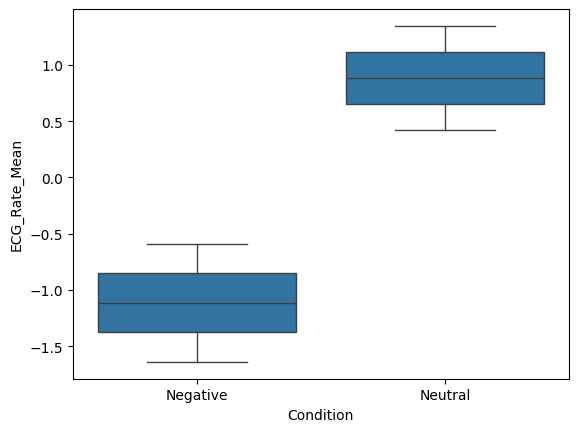

In [134]:
sns.boxplot(x="Condition", y="ECG_Rate_Mean", data=df);

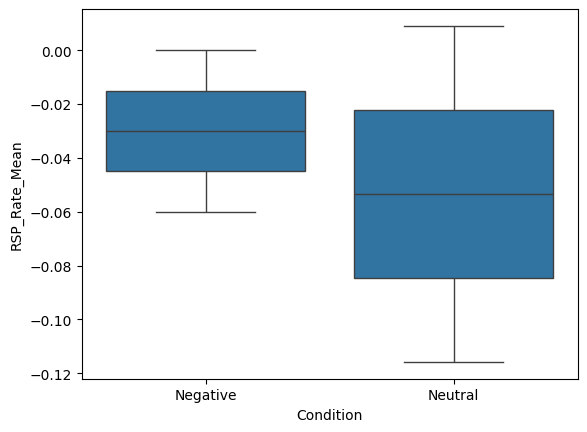

In [135]:
sns.boxplot(x="Condition", y="RSP_Rate_Mean", data=df);

## PSD (Signal Power Spectrum Density)

In [117]:
def get_psd(signals):
    welch = nk.signal_psd(signals, method="welch", min_frequency=1, max_frequency=20, show=True)
    multitaper = nk.signal_psd(signals, method="multitapers", max_frequency=20, show=True)
    lomb = nk.signal_psd(signals, method="lomb", min_frequency=1, max_frequency=20, show=True)
    burg = nk.signal_psd(signals, method="burg", min_frequency=1, max_frequency=20, order=10, show=True)

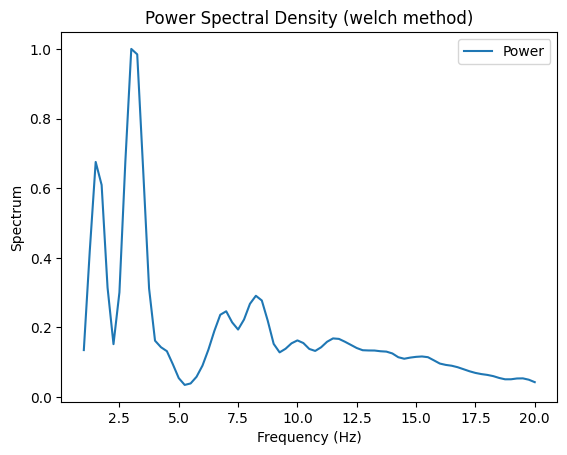

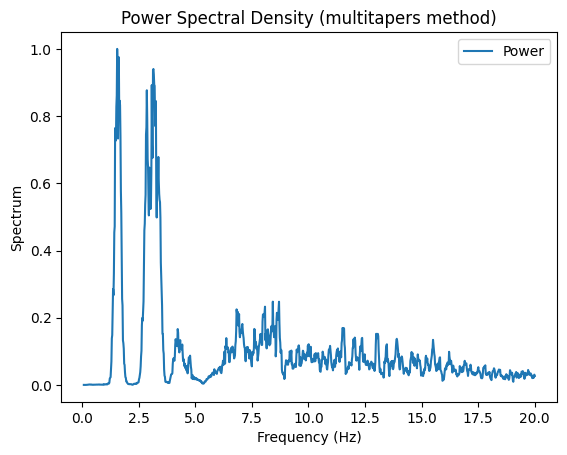

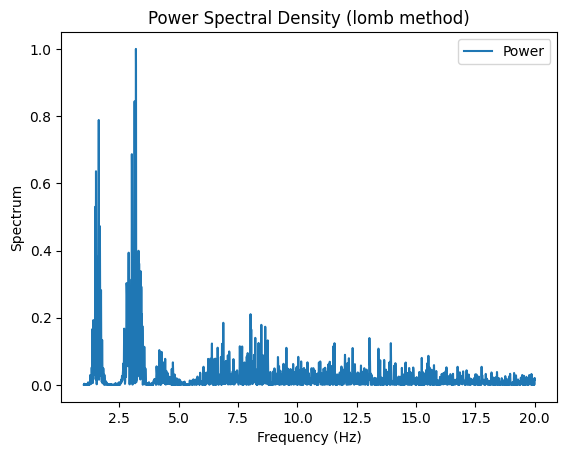

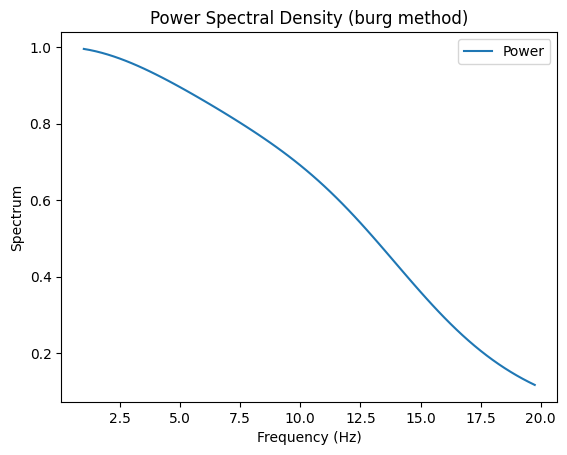

In [118]:
ecg = df_biopac_marker['ECG'].to_numpy()
get_psd(ecg)

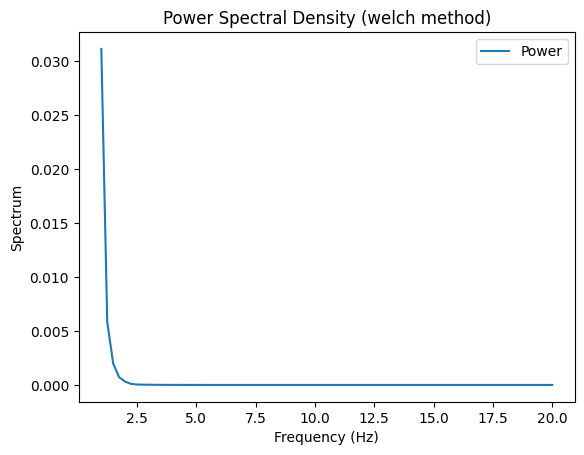

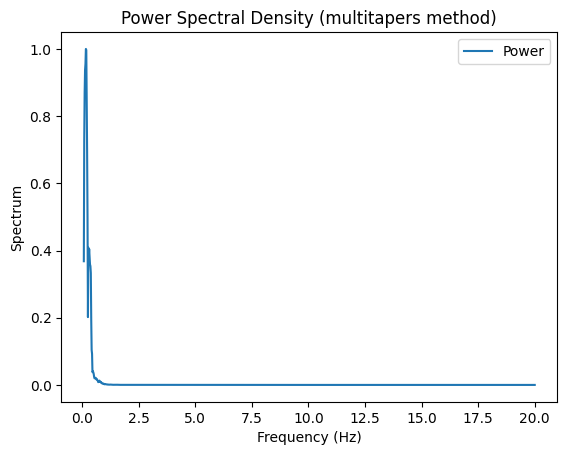

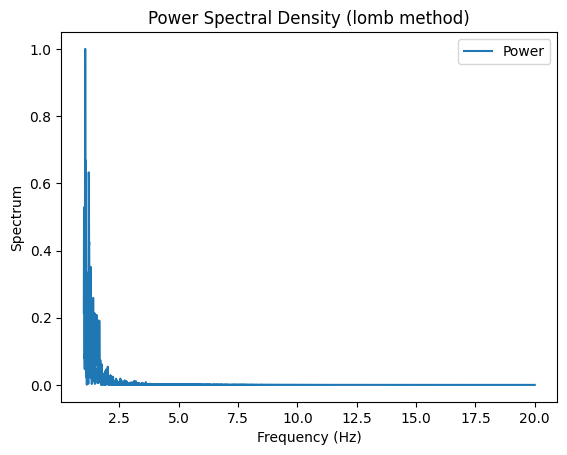

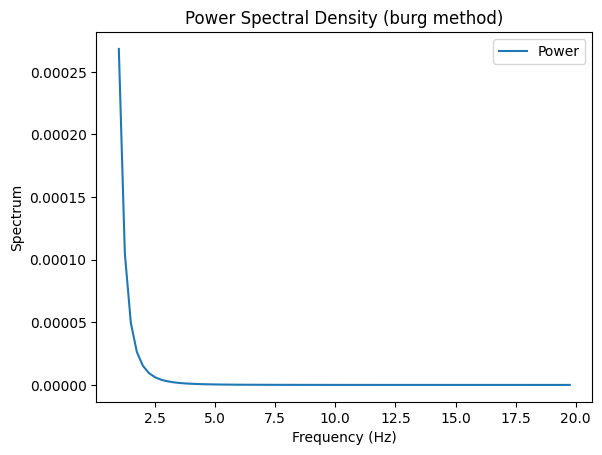

In [120]:
rsp = df_biopac_marker['RSP'].to_numpy()
get_psd(rsp)

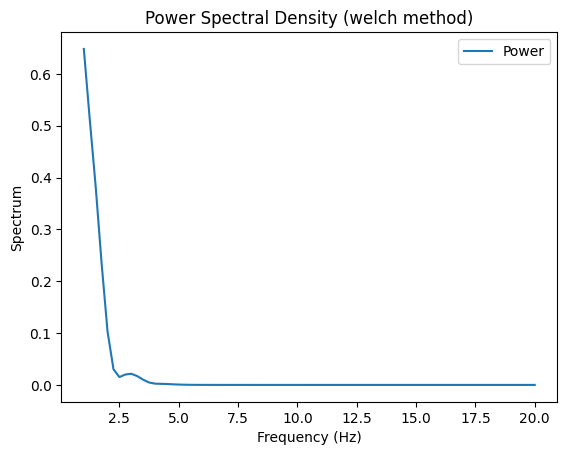

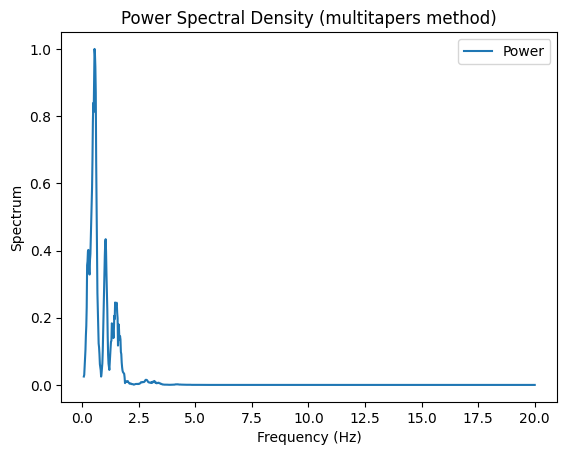

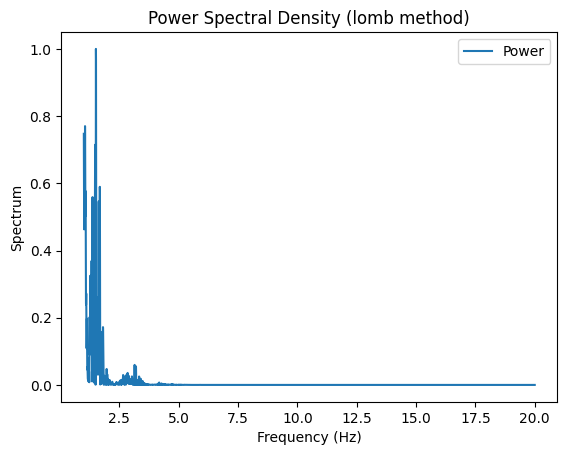

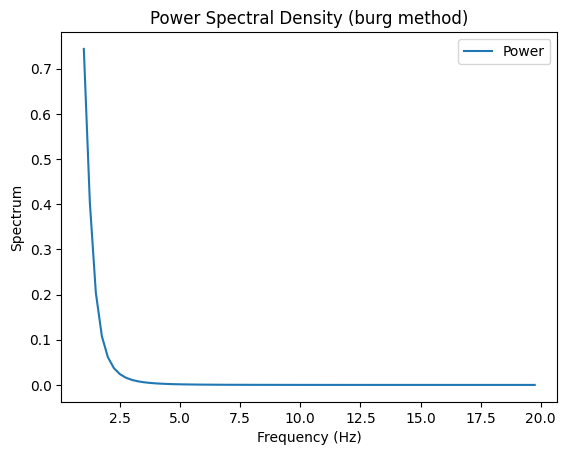

In [121]:
ppg = df_biopac_marker['PPG'].to_numpy()
get_psd(ppg)

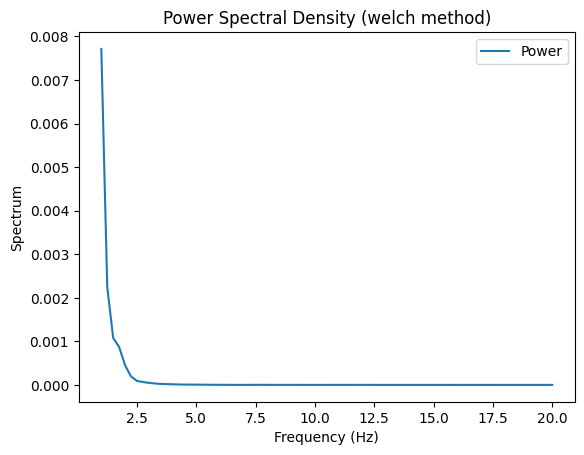

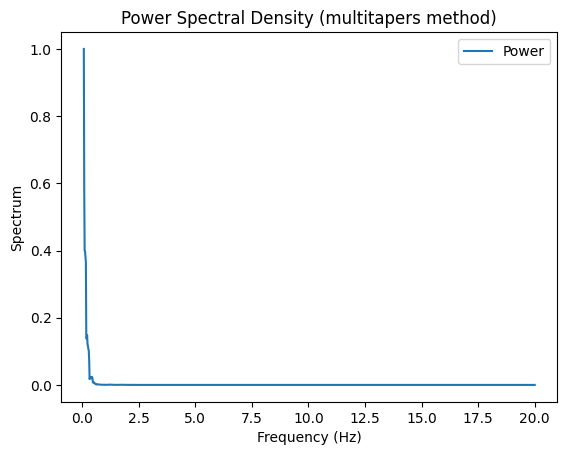

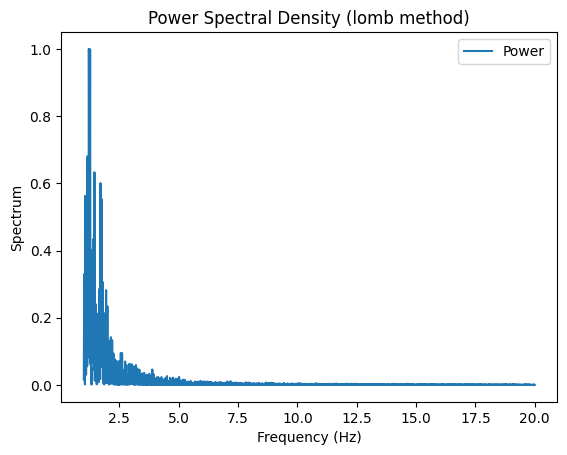

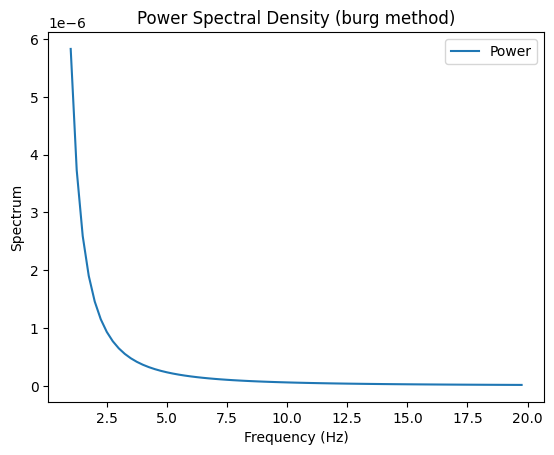

In [122]:
eda = df_biopac_marker['EDA'].to_numpy()
get_psd(eda)

## 函数自定义

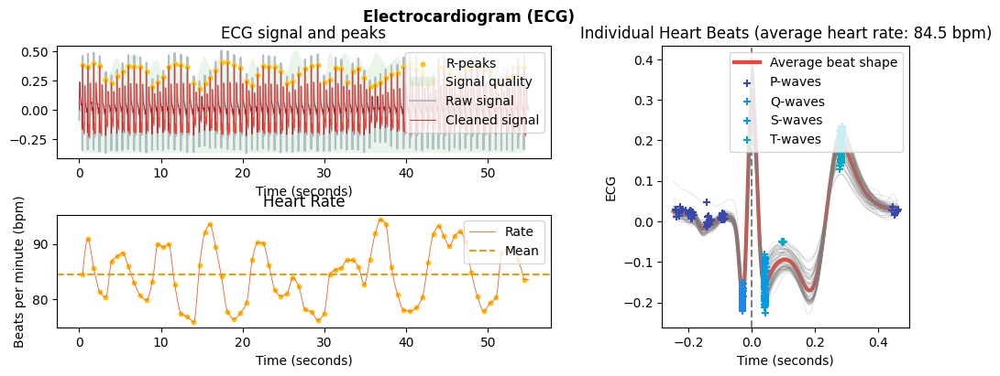

In [12]:
ecg = df_biopac_marker['ECG'].to_numpy()
signals, info = nk.ecg_process(ecg, sampling_rate=1000)

# Visualize
nk.ecg_plot(signals, info)

In [13]:
# Define a new function
def my_processing(ecg_signal):
    # Do processing
    ecg_cleaned = nk.ecg_clean(ecg, sampling_rate=1000)
    instant_peaks, rpeaks, = nk.ecg_peaks(ecg_cleaned, sampling_rate=1000)
    rate = nk.ecg_rate(rpeaks, sampling_rate=1000, desired_length=len(ecg_cleaned))
    quality = nk.ecg_quality(ecg_cleaned, sampling_rate=1000)


    # Prepare output
    signals = pd.DataFrame({"ECG_Raw": ecg_signal,
                            "ECG_Clean": ecg_cleaned,
                            "ECG_Rate": rate,
                            "ECG_Quality": quality})
    signals = pd.concat([signals, instant_peaks], axis=1)

    # Create info dict
    info = rpeaks
    info["sampling_rate"] = 1000
    
    return signals, info

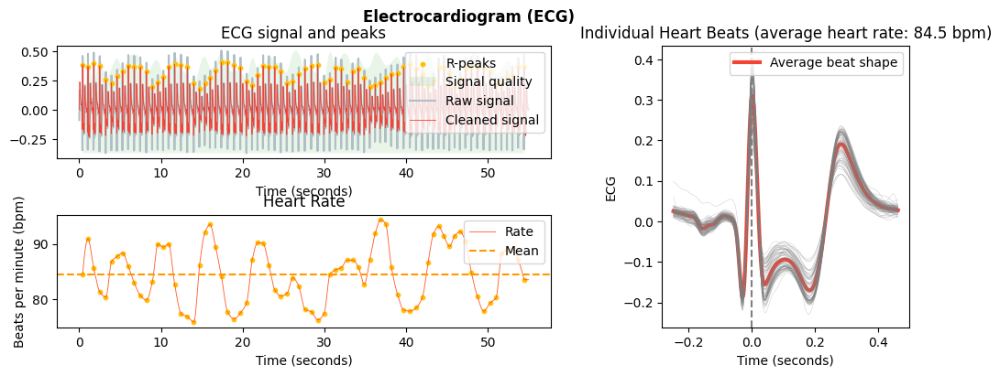

In [14]:
# Process the signal using previously defined function
signals, info = my_processing(ecg)

# Visualize
nk.ecg_plot(signals, info)

- Changing the processing parameters

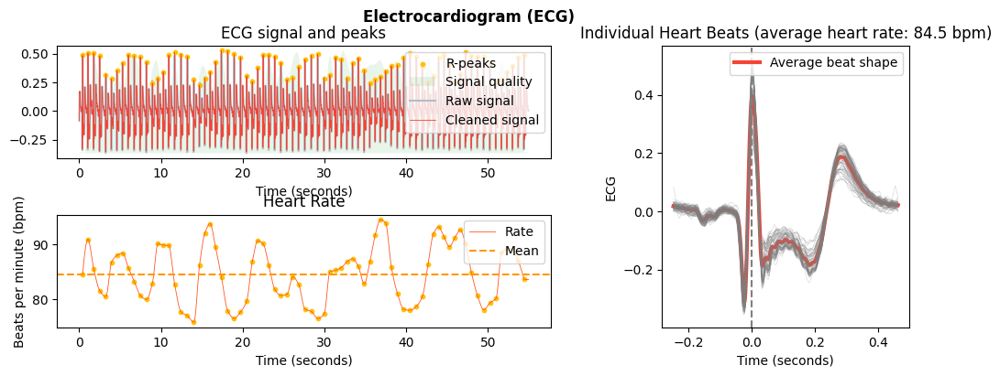

In [15]:
# Define a new function
def my_processing(ecg_signal):
    # Do processing
    ecg_cleaned = nk.ecg_clean(ecg_signal, sampling_rate=1000, method="engzeemod2012")
    instant_peaks, rpeaks, = nk.ecg_peaks(ecg_cleaned, sampling_rate=1000)
    rate = nk.ecg_rate(rpeaks, sampling_rate=1000, desired_length=len(ecg_cleaned))
    quality = nk.ecg_quality(ecg_cleaned, sampling_rate=1000)

    # Prepare output
    signals = pd.DataFrame({"ECG_Raw": ecg_signal,
                            "ECG_Clean": ecg_cleaned,
                            "ECG_Rate": rate,
                            "ECG_Quality": quality})
    signals = pd.concat([signals, instant_peaks], axis=1)

    # Create info dict
    info = rpeaks
    info["sampling_rate"] = 1000
    
    return signals, info

# Process the signal using previously defined function
signals, info = my_processing(ecg)

# Visualize
nk.ecg_plot(signals, info)

- Customize even more!

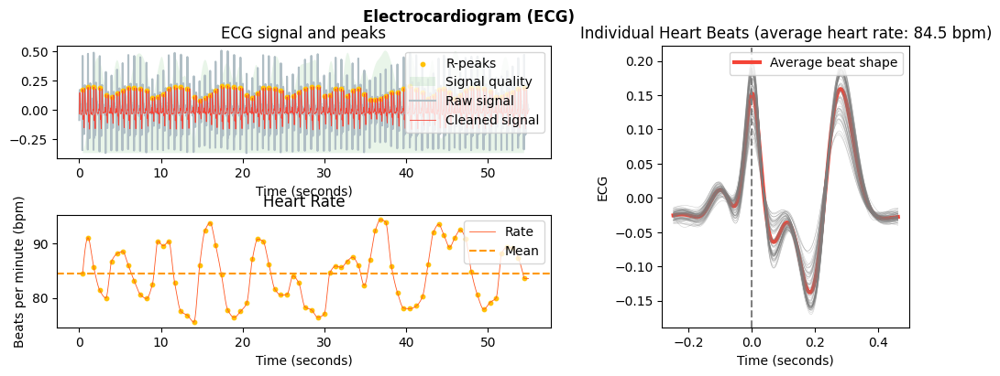

In [16]:
def my_cleaning(ecg_signal, sampling_rate):
    detrended = nk.signal_detrend(ecg_signal, order=1)
    cleaned = nk.signal_filter(detrended, 
                               sampling_rate=sampling_rate, 
                               lowcut=2, 
                               highcut=9, 
                               method='butterworth')
    return cleaned

# Define a new function
def my_processing(ecg_signal):
    # Do processing
    ecg_cleaned = my_cleaning(ecg_signal, sampling_rate=1000)
    instant_peaks, rpeaks, = nk.ecg_peaks(ecg_cleaned, sampling_rate=1000)
    rate = nk.ecg_rate(rpeaks, sampling_rate=1000, desired_length=len(ecg_cleaned))
    quality = nk.ecg_quality(ecg_cleaned, sampling_rate=1000)

    # Prepare output
    signals = pd.DataFrame({"ECG_Raw": ecg_signal,
                            "ECG_Clean": ecg_cleaned,
                            "ECG_Rate": rate,
                            "ECG_Quality": quality})

    signals = pd.concat([signals, instant_peaks], axis=1)

    # Create info dict
    info = rpeaks
    info["sampling_rate"] = 1000
    
    return signals, info

signals, info = my_processing(ecg)
nk.ecg_plot(signals, info)

## 保存预处理报告

The raw signal, sampled at 1000 Hz, was preprocessed using a bandpass filter ([0.5 - 8 Hz], Butterworth 3rd order; following Elgendi et al., 2013).

The peak detection was carried out using the method described in Elgendi et al. (2013).

The quality assessment was carried out using template-matching, approximately as described in Orphanidou et al. (2015).

|   PPG_Rate_Mean |   PPG_Rate_SD |
|----------------:|--------------:|
|         84.7178 |       5.60225 |

References
- Elgendi M, Norton I, Brearley M, Abbott D, Schuurmans D (2013)
            Systolic Peak Detection in Acceleration Photoplethysmograms
            Measured from Emergency Responders in Tropical Conditions
            PLoS ONE 8(10): e76585. doi:10.1371/journal.pone.0076585.
- Makowski, D., Pham, T., Lau, Z. J., Brammer, J. C., Lespinasse, F., Pham, H.,
    Schölzel, C., & Chen, S. A. (2021). NeuroKit2: A Python toolbox for neurophysiological signal processing.
    Behavior Research Methods, 53(4), 1689–1696. https

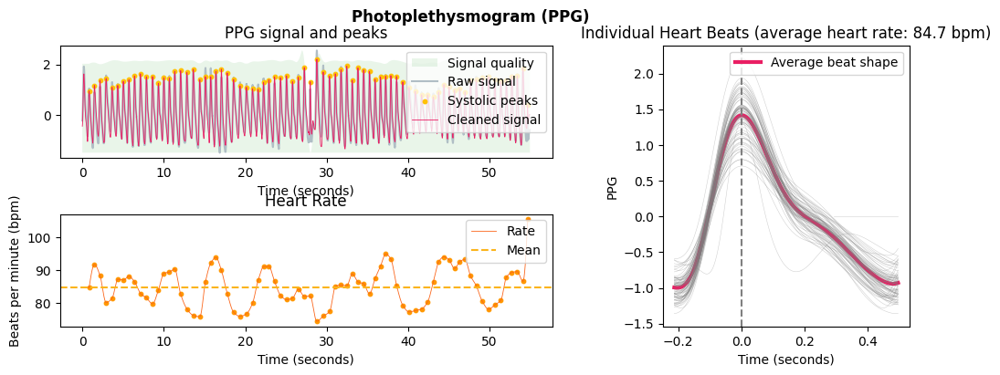

In [5]:
ppg = df_biopac_marker['PPG'].to_numpy()

# Process signal and save report
df, info = nk.ppg_process(ppg_signal = ppg, report = "ppg_report.html")

# 微表情与生理数据

## 读取excel标注文件，得到微表情字典

In [5]:
# Load the xlsx file
file_path = 'coding_file_mc_20241204.xlsx'
df = pd.read_excel(file_path)
df.head(3)

,Subject,Filename,Marker,OnsetTime,ApexTime,OffsetTime,OnsetFrame,ApexFrame,OffsetFrame,Action Units,Estimated Emotion,Macro/Micro,Date,Dif,Notes
0,fengdengfang,angry_1_146_fengdengfang_20230802.avi,146,24.33,24.59,25.33,16-00-31-433-685,16-00-31-686-723,16-00-32-428-831,AU1,angry,Macro,2024年06月30日-14时31分,39,NaN
1,wangxiaomin,angry_1_146_wangxiaomin_20230718.avi,146,12.09,12.68,12.68,11-05-27-805-813,11-05-28-399-902,11-05-28-399-902,AU4,angry,Macro,2024年05月15日-19时52分,90,NaN
2,wangxiaomin,angry_1_146_wangxiaomin_20230718.avi,146,36.31,36.86,37.75,11-05-52-025-446,11-05-52-578-529,11-05-53-465-662,"AU4, AU7",angry,Macro,2024年05月15日-19时54分,84,NaN


In [7]:
# 初始化字典，文件名为键，微表情关键帧的时刻构成的列表为值，(起始帧，峰值帧，结束帧)
micro_dict = {}
macro_dict = {}
i, j = 0, 0
# 遍历每一行
for index, row in df.iterrows():
    if row['Macro/Micro'] == 'Micro':
        i += 1
        filename = row['Filename']
        onset_time = round(row['OnsetTime'], 3)
        onset_time = f"{onset_time:.3f}"  # 保留小数点后三位，补零

        apex_time = round(row['ApexTime'], 3)
        apex_time = f"{apex_time:.3f}"

        offset_time = round(row['OffsetTime'], 3)
        offset_time = f"{offset_time:.3f}"

        if filename in micro_dict:
            micro_dict[filename].append((onset_time, apex_time, offset_time))
        else:
            micro_dict[filename] = [(onset_time, apex_time, offset_time)]
            
    if row['Macro/Micro'] == 'Macro':
        j += 1
        filename = row['Filename']
        onset_time = round(row['OnsetTime'], 3)
        onset_time = f"{onset_time:.3f}"  # 保留小数点后三位，补零

        apex_time = round(row['ApexTime'], 3)
        apex_time = f"{apex_time:.3f}"

        offset_time = round(row['OffsetTime'], 3)
        offset_time = f"{offset_time:.3f}"

        if filename in macro_dict:
            macro_dict[filename].append((onset_time, apex_time, offset_time))
        else:
            macro_dict[filename] = [(onset_time, apex_time, offset_time)]

print(f'共{i}个微表情样本')
print(f'共{j}个宏表情样本')
# 查看字典的长度
length = len(micro_dict)
total_micro = sum(len(value) for value in micro_dict.values())
total_macro = sum(len(value) for value in macro_dict.values())
print(f"字典的长度是: {length}")
print(f"字典中共有微表情: {total_micro}")
print(f"字典中共有宏表情: {total_macro}")

# 打印生成的字典
print('micro_dict:', micro_dict)

共280个微表情样本
共576个宏表情样本
字典的长度是: 171
字典中共有微表情: 280
字典中共有宏表情: 576
micro_dict: {'angry_1_146_yangmi_20230728.avi': [('40.960', '41.100', '41.370')], 'angry_2_107_wangshuai_20230802.avi': [('28.250', '28.500', '28.700'), ('29.440', '29.840', '29.840')], 'angry_2_107_wangzishan_20230717.avi': [('26.100', '26.260', '26.260')], 'angry_2_107_zhaoshaohua_20230801.avi': [('16.860', '17.190', '17.330')], 'angry_3_116_liyan_20230802.avi': [('1.700', '1.970', '2.200'), ('10.060', '10.250', '10.500'), ('41.290', '41.570', '41.760')], 'angry_3_116_yangmi_20230728.avi': [('4.940', '5.220', '5.400'), ('51.500', '51.690', '51.970'), ('8.420', '8.610', '8.890')], 'angry_3_116_zhaoshaohua_20230801.avi': [('25.450', '25.640', '25.910')], 'angry_4_125_wangziheng_20230727.avi': [('53.780', '53.960', '54.230')], 'angry_4_125_zhengwansheng_20230718.avi': [('6.270', '6.540', '6.720')], 'angry_5_133_wangxiaomin_20230718.avi': [('2.190', '2.470', '2.660'), ('6.560', '6.750', '7.010')], 'angry_6_142_wangxiaomin_2023

### 根据h5文件名称，找到micro_dict中对应的.avi的名称

In [8]:
# 'yangmi_20230728.h5' ——> 'angry_1_146_yangmi_20230728.avi', 'angry_3_116_yangmi_20230728.avi', ...
def h5_to_avis(h5, micro_dict):
    # 分割字符串
    name, date = h5.split('.h5')[0].split('_')

    # 拼接结果
    avi_name = f"{name}_{date}.avi"
    
    # 找到所有以给定字符串为结尾的键
    matching_keys = [key for key in micro_dict.keys() if key.endswith(avi_name)]
    
    return matching_keys

print(h5_to_avis('liyan_20230802.h5', micro_dict))

['angry_3_116_liyan_20230802.avi', 'fear_2_104_liyan_20230802.avi', 'surprise_3_117_liyan_20230802.avi', 'surprise_4_126_liyan_20230802.avi', 'surprise_5_135_liyan_20230802.avi']


### 根据.avi的名称，找到微表情峰值帧对应行数的列表

In [9]:
# 'angry_1_146_yangmi_20230728.avi' ——> [41100]
def get_apexs(avi_name):
    time_points = [int(x[1].replace('.', '')) for x in micro_dict[avi_name]]
    return time_points

print(get_apexs('angry_3_116_liyan_20230802.avi'))

[1970, 10250, 41570]


### 根据.avi的名称，得到对应的h5文件名称

In [10]:
# 'angry_1_146_yangmi_20230728.avi' ——> 'yangmi_20230728.h5'
def avi_to_h5(avi_name):
    # 先用下划线分割字符串
    _, _, marker, name, date = avi_name.split('.avi')[0].split('_')
    # 组合名字和日期
    h5_name = f"{name}_{date}.h5"

    return h5_name

h5_name = avi_to_h5('angry_3_116_liyan_20230802.avi')
print('h5_name:', h5_name)

h5_name: liyan_20230802.h5


## 将微表情apex绘制在生理数据曲线中（以angry_3_116_liyan_20230802为例）

In [13]:
h5 = 'liyan_20230802.h5'
avi_names = h5_to_avis(h5, micro_dict)
print('avi_names:', avi_names)

biopac_file_path = 'biopac_data_HDF5/' + h5
# 读取 HDF5 文件中的 DataFrame
df_biopac_data = pd.read_hdf(biopac_file_path, key='df')

# 以第1个avi为例
avi = avi_names[0]
marker = avi.split('_')[2]
df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
df_biopac_marker = df_biopac_marker.reset_index(drop=True)
df_biopac_marker

avi_names: ['angry_3_116_liyan_20230802.avi', 'fear_2_104_liyan_20230802.avi', 'surprise_3_117_liyan_20230802.avi', 'surprise_4_126_liyan_20230802.avi', 'surprise_5_135_liyan_20230802.avi']


,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
0,-0.361023,1.271362,-0.004883,32.000000,20.468140,-0.086212,0.005798,32.000000,89.020772,116
1,-0.362549,1.271973,-0.005341,31.999390,20.469666,-0.085907,0.005646,32.000000,89.020772,116
2,-0.361938,1.272583,-0.005493,32.000000,20.469666,-0.085754,0.005798,31.998779,89.020772,116
3,-0.363159,1.276855,-0.005188,32.000000,20.466614,-0.085449,0.005493,31.999390,89.020772,116
4,-0.366516,1.276855,-0.004883,32.000000,20.466614,-0.083771,0.005798,32.000000,89.020772,116
...,...,...,...,...,...,...,...,...,...,...
58322,-0.004272,-0.053101,-0.004883,32.000000,14.677430,-0.017700,0.005493,32.000000,76.923077,116
58323,-0.005188,-0.055237,-0.004883,32.000000,14.680482,-0.017700,0.005493,32.000000,76.923077,116
58324,-0.006409,-0.055542,-0.005035,31.998779,14.680482,-0.019531,0.005646,31.998169,76.923077,116
58325,-0.010071,-0.054626,-0.005035,32.000000,14.677430,-0.019989,0.005951,32.000000,76.923077,116


### ECG

In [68]:
def ecg_plot_3pics(ecg_signals, info, avi_name, time_points, save_path, show):
    # 创建包含三个子图的图形
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 9), sharex=True)
#     fig.suptitle("ECG_" + avi_name.split('.')[0], fontweight="bold")
    # 增加子图之间的距离
    fig.subplots_adjust(hspace=0.3)
    plt.rcParams["font.family"] = "Times New Roman"
    
    ECG_Clean = ecg_signals["ECG_Clean"].values
    ECG_Raw = ecg_signals["ECG_Raw"].values
    ECG_Quality = ecg_signals["ECG_Quality"].values
    ECG_Rate = ecg_signals["ECG_Rate"].values
    peaks = info["ECG_R_Peaks"]

# ------------------------------------------ 子图 1: ECG ------------------------------------------------
    ECG_Quality = rescale(
            ECG_Quality,
            to=[
                np.min([np.min(ECG_Raw), np.min(ECG_Clean)]),
                np.max([np.max(ECG_Raw), np.max(ECG_Clean)]),
            ],
        )

    # 创建最小线
    minimum_line = np.full(len(ECG_Quality), ECG_Quality.min())

    ax1.plot(ECG_Clean, color='blue', alpha=0.5, label='ECG Clean')
    ax1.plot(ECG_Raw, color='green', alpha=0.5, label='ECG Raw')

    # 绘制信号质量区域
    ax1.fill_between(
        range(len(ECG_Quality)),  # x 轴为质量数据的索引
        minimum_line,        # 底部边界
        ECG_Quality,         # 顶部边界
        alpha=0.12,          # 透明度
        zorder=0,            # 层级
        interpolate=True,    # 插值
        facecolor="#4CAF50", # 填充颜色
        label="Signal quality" # 标签
    )

    # 设置第一个子图的标题和坐标轴标签
    ax1.set_title('ECG Signals', fontsize=20, pad=10, weight='bold')
    ax1.set_ylabel('Amplitude', fontsize=20)
    ax1.tick_params(axis='y', labelsize=20)  # 设置横轴坐标字体大小为 12
    # 添加图例
    ax1.legend(loc='upper right', fontsize=20)

#     # ------------------------------------------ 子图 2: ECG_Rate ------------------------------------------------
#     # 显示 ECG_Rate
    ax2.plot(ECG_Rate, color='purple', alpha=0.7, label='Heart Rate')

    # Plot points
    if peaks is not None:
        ax2.scatter(
            peaks,
            ECG_Rate[peaks],
            color="red",
            s=10
        )

    # Show average rate
    rate_mean = ECG_Rate.mean()
    ax2.axhline(y=rate_mean, label=f"Mean ({rate_mean: .2f})", linestyle="--", linewidth=1.5, color="orange")

    ax2.set_title('Heart Rate', fontsize=20, pad=10, weight='bold')
    ax2.set_ylabel('Rate', fontsize=20, labelpad=12)
    ax2.tick_params(axis='y', labelsize=20)
    # ax2.set_xlabel('Time (s)')  # 共享 x 轴标签
    # 添加图例
    ax2.legend(loc='upper right', fontsize=20)
    

    # ------------------------------------------ 子图 3: ECG_Rate 斜率 ------------------------------------------------
    time = np.arange(len(ECG_Rate))/1000  # 时间轴
#     print('len(ECG_Rate):', len(ECG_Rate)) # len(ECG_Rate): 59181

    # 计算心率的斜率信号
    ECG_Slope = np.abs(np.gradient(ECG_Rate, time))  # 使用 np.gradient 计算斜率

    ax3.plot(ECG_Slope, color='blue', alpha=0.7, label='Heart Rate Slope')
    
    # 计算斜率信号的均值
    mean_slope = np.mean(ECG_Slope)
    ax3.axhline(mean_slope, color='orange', linestyle='--', linewidth=1.5, label=f'Mean Slope ({mean_slope:.2f})')
    
    # 添加斜率为 0 的横线
#     ax3.axhline(0, color='orange', linestyle='--', linewidth=1.5, label='Slope = 0')

    ax3.set_title('Heart Rate Slope', fontsize=20, pad=10, weight='bold')
    ax3.set_ylabel('Slope', fontsize=20, labelpad=12)
    ax3.set_xlabel('Time (ms)', fontsize=20)
    ax3.tick_params(axis='x', labelsize=20)
    ax3.tick_params(axis='y', labelsize=20)
    # 添加图例
    ax3.legend(loc='upper right', fontsize=20)

    # ------------------------------------------ 添加竖线 ------------------------------------------------

    for tp in time_points:
        ax1.axvline(x=tp, color='red', linestyle='--', linewidth=2)  # 红色虚线
        ax2.axvline(x=tp, color='red', linestyle='--', linewidth=2)
        ax3.axvline(x=tp, color='red', linestyle='--', linewidth=2)
        
        # 在红色虚线的右下侧显示对应的数字
        ax1.text(tp + 180, ax1.get_ylim()[0] + 0.05 * (ax1.get_ylim()[1] - ax1.get_ylim()[0]), 
                 str(tp), color='red', fontsize=24, verticalalignment='bottom', horizontalalignment='left')
#         ax2.text(tp + 50, ax2.get_ylim()[0] + 0.05 * (ax2.get_ylim()[1] - ax2.get_ylim()[0]), 
#                  str(tp), color='red', fontsize=12, verticalalignment='bottom', horizontalalignment='left')
#         ax3.text(tp + 50, ax3.get_ylim()[0] + 0.05 * (ax3.get_ylim()[1] - ax3.get_ylim()[0]), 
#                  str(tp), color='red', fontsize=12, verticalalignment='bottom', horizontalalignment='left')
    
#     plt.tight_layout()  # 调整子图间距
    
    # 保存图像到本地
#     save_path = os.path.join(save_path, 'ecg_' + avi_name.split('.')[0] + '.png')
    save_path = os.path.join(r'E:\10.Doctoral materials\0.Micro-expression\3.papers\5.ME+EEG Spotting\pics', 'plot.png')
    plt.savefig(save_path, dpi=800, bbox_inches='tight', pad_inches=0.05)
    
    if show:
        plt.show()
    else:
        plt.close()  # 关闭当前图形，不会显示
        
        
def ecg_plot(ecg_signals, info, avi_name, time_points, save_path, show):
    # 创建包含两个子图的图形，设置大小
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 8), sharex=True)
    fig.suptitle("ECG_" + avi_name.split('.')[0], fontweight="bold")
    
    ECG_Clean = ecg_signals["ECG_Clean"].values
    ECG_Raw = ecg_signals["ECG_Raw"].values
    ECG_Quality = ecg_signals["ECG_Quality"].values
    ECG_Rate = ecg_signals["ECG_Rate"].values
    peaks = info["ECG_R_Peaks"]

    # ------------------------------------------ 子图 1: ECG_Rate ------------------------------------------------
    ax1.plot(ECG_Rate, color='purple', alpha=0.7, label='ECG Rate')

    # Plot points
    if peaks is not None:
        ax1.scatter(
            peaks,
            ecg_signals["ECG_Rate"].values[peaks],
            color="red",
            s=10
        )

    # Show average rate
    rate_mean = ecg_signals["ECG_Rate"].values.mean()
    ax1.axhline(y=rate_mean, label="Mean", linestyle="--", color="orange")

    ax1.set_title('ECG Rate')
    ax1.set_ylabel('Rate')
    ax1.set_xlabel('Time (s)')
    # 添加图例
    ax1.legend(loc='upper right')

    # ------------------------------------------ 子图 2: ECG_Rate 斜率 ------------------------------------------------
    time = np.arange(len(ECG_Rate))  # 时间轴

    # 计算心率的斜率信号
    ECG_Slope = np.abs(np.gradient(ECG_Rate, time))  # 使用 np.gradient 计算斜率

    ax2.plot(ECG_Slope, color='blue', alpha=0.7, label='ECG Rate')
    
    # 添加斜率为 0 的横线
    ax2.axhline(0, color='orange', linestyle='--', linewidth=1.5, label='Slope = 0')

    ax2.set_title('ECG Rate Slope')
    ax2.set_ylabel('Slope')
    ax2.set_xlabel('Time (s)')
    # 添加图例
    ax2.legend(loc='upper right')

    # ------------------------------------------ 添加竖线 ------------------------------------------------

    for tp in time_points:
        ax1.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
        ax2.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
        
        # 在红色虚线的右下侧显示对应的数字
        ax1.text(tp + 50, ax1.get_ylim()[0] + 0.05 * (ax1.get_ylim()[1] - ax1.get_ylim()[0]), 
                 str(tp), color='red', fontsize=8, verticalalignment='bottom', horizontalalignment='left')
        ax2.text(tp + 50, ax2.get_ylim()[0] + 0.05 * (ax2.get_ylim()[1] - ax2.get_ylim()[0]), 
                 str(tp), color='red', fontsize=8, verticalalignment='bottom', horizontalalignment='left')
    
    plt.tight_layout()  # 调整子图间距
    
    # 保存图像到本地
    save_path = os.path.join(save_path, 'ecg_' + avi_name.split('.')[0] + '.png')
    plt.savefig(save_path, dpi=300)
    
    if show:
        plt.show()
    else:
        plt.close()  # 关闭当前图形，不会显示
    
def rescale(data, to=[0, 1], scale=None):
    # Sanity checks
    if len(to) < 2:
        raise ValueError("'to' must have at least 2 values.")
    if len(to) > 2:  # We assume it is a signal
        to = [np.nanmin(to), np.nanmax(to)]

    # Return appropriate type
    if isinstance(data, list):
        data = list(_rescale(np.array(data), to=to, scale=scale))
    else:
        data = _rescale(data, to=to, scale=scale)

    return data

def _rescale(data, to=[0, 1], scale=None):
    if scale is None:
        scale = [np.nanmin(data), np.nanmax(data)]

    return (to[1] - to[0]) / (scale[1] - scale[0]) * (data - scale[0]) + to[0]

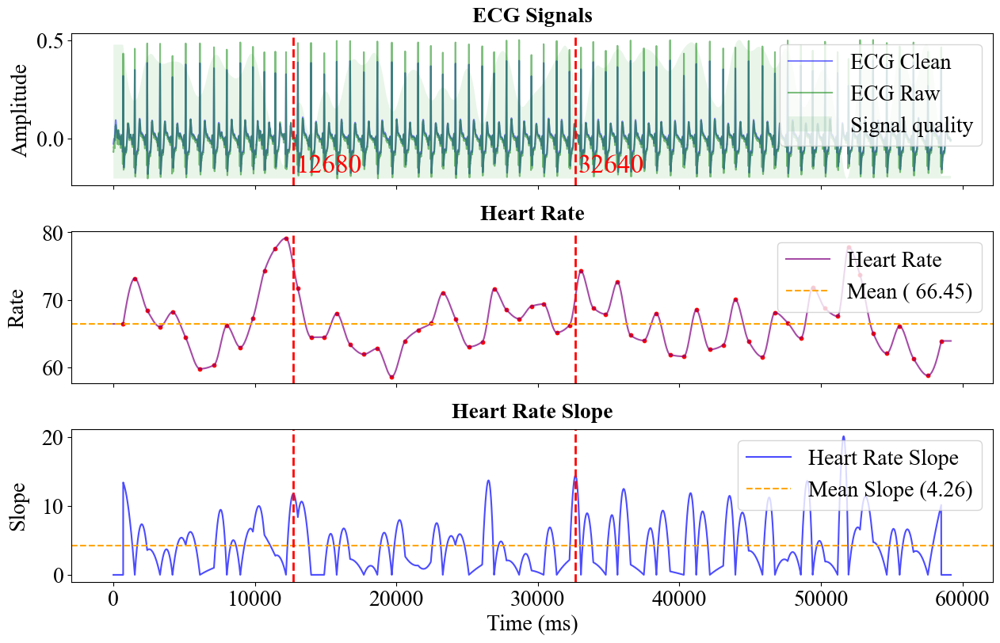

In [69]:
save_path = r'pics_ps_apex\Micro'
# time_points = get_apexs(avi)
time_points = [12680,32640]
ecg = df_biopac_marker['ECG'].to_numpy()
ecg_signals, info = nk.ecg_process(ecg, sampling_rate=1000)
ecg_plot_3pics(ecg_signals, info, avi, time_points, save_path, show=True)

### RSP

In [73]:
def rsp_plot(rsp_signals, info, avi_name, time_points, show, static=True):
    if info is None:
        warn(
            "'info' dict not provided. Some information might be missing."
            + " Sampling rate will be set to 1000 Hz.",
            category=NeuroKitWarning,
        )

        info = {
            "sampling_rate": 1000,
        }

    # Mark peaks, troughs and phases.
    peaks = np.where(rsp_signals["RSP_Peaks"] == 1)[0]
    troughs = np.where(rsp_signals["RSP_Troughs"] == 1)[0]
    inhale = np.where(rsp_signals["RSP_Phase"] == 1)[0]
    exhale = np.where(rsp_signals["RSP_Phase"] == 0)[0]

    nrow = 2

    # Determine mean rate.
    rate_mean = np.mean(rsp_signals["RSP_Rate"])

    if "RSP_Amplitude" in list(rsp_signals.columns):
        nrow += 1
        # Determine mean amplitude.
        amplitude_mean = np.mean(rsp_signals["RSP_Amplitude"])
    if "RSP_RVT" in list(rsp_signals.columns):
        nrow += 1
        # Determine mean RVT.
        rvt_mean = np.mean(rsp_signals["RSP_RVT"])
    if "RSP_Symmetry_PeakTrough" in list(rsp_signals.columns):
        nrow += 1

    # Get signals marking inspiration and expiration.
    exhale_signal, inhale_signal = _rsp_plot_phase(rsp_signals, troughs, peaks)

    # Determine unit of x-axis.
#     x_label = "Time (seconds)"
    x_axis = np.linspace(0, len(rsp_signals), len(rsp_signals))

    if static:
        fig, ax = plt.subplots(nrows=nrow, ncols=1, sharex=True, figsize=(15,8))
        fig.suptitle("RSP_" + avi_name.split('.')[0], fontweight="bold")

        # 设置子图之间的垂直和水平间距
        plt.subplots_adjust(hspace=0.4)  # hspace 控制垂直间距

        last_ax = fig.get_axes()[-1]
#         last_ax.set_xlabel(x_label)

        # Plot cleaned and raw respiration as well as peaks and troughs.
        ax[0].set_title("Raw and Cleaned Signal")

        ax[0].plot(
            x_axis, rsp_signals["RSP_Raw"], color="#B0BEC5", label="Raw", zorder=1
        )
        ax[0].plot(
            x_axis,
            rsp_signals["RSP_Clean"],
            color="#2196F3",
            label="Cleaned",
            zorder=2,
            linewidth=1.5,
        )

        ax[0].scatter(
            x_axis[peaks],
            rsp_signals["RSP_Clean"][peaks],
            color="red",
            label="Exhalation Onsets",
            zorder=3,
            s=30
        )
        ax[0].scatter(
            x_axis[troughs],
            rsp_signals["RSP_Clean"][troughs],
            color="orange",
            label="Inhalation Onsets",
            zorder=4,
            s=30
        )

        # Shade region to mark inspiration and expiration.
        ax[0].fill_between(
            x_axis[exhale],
            exhale_signal[exhale],
            rsp_signals["RSP_Clean"][exhale],
            where=rsp_signals["RSP_Clean"][exhale] > exhale_signal[exhale],
            color="#CFD8DC",
            linestyle="None",
            label="exhalation",
        )
        ax[0].fill_between(
            x_axis[inhale],
            inhale_signal[inhale],
            rsp_signals["RSP_Clean"][inhale],
            where=rsp_signals["RSP_Clean"][inhale] > inhale_signal[inhale],
            color="#ECEFF1",
            linestyle="None",
            label="inhalation",
        )

        ax[0].legend(loc="upper right", fontsize=6)

        # Plot rate and optionally amplitude.
        ax[1].set_title("Breathing Rate")
        ax[1].plot(
            x_axis,
            rsp_signals["RSP_Rate"],
            color="#4CAF50",
            label="Rate",
            linewidth=1.5,
        )
        ax[1].axhline(y=rate_mean, label="Mean", linestyle="--", color="#4CAF50")
        ax[1].legend(loc="upper right")

        if "RSP_Amplitude" in list(rsp_signals.columns):
            ax[2].set_title("Breathing Amplitude")

            ax[2].plot(
                x_axis,
                rsp_signals["RSP_Amplitude"],
                color="#009688",
                label="Amplitude",
                linewidth=1.5,
            )
            ax[2].axhline(
                y=amplitude_mean, label="Mean", linestyle="--", color="#009688"
            )
            ax[2].legend(loc="upper right")

        if "RSP_RVT" in list(rsp_signals.columns):
            ax[3].set_title("Respiratory Volume per Time")

            ax[3].plot(
                x_axis,
                rsp_signals["RSP_RVT"],
                color="#00BCD4",
                label="RVT",
                linewidth=1.5,
            )
            ax[3].axhline(y=rvt_mean, label="Mean", linestyle="--", color="#009688")
            ax[3].legend(loc="upper right")

        if "RSP_Symmetry_PeakTrough" in list(rsp_signals.columns):
            ax[4].set_title("Cycle Symmetry")

            ax[4].plot(
                x_axis,
                rsp_signals["RSP_Symmetry_PeakTrough"],
                color="green",
                label="Peak-Trough Symmetry",
                linewidth=1.5,
            )
            ax[4].plot(
                x_axis,
                rsp_signals["RSP_Symmetry_RiseDecay"],
                color="purple",
                label="Rise-Decay Symmetry",
                linewidth=1.5,
            )
            ax[4].legend(loc="upper right")
            
        # ------------------------------------------ 添加竖线 ------------------------------------------------

        for tp in time_points:
            ax[0].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax[1].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax[2].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax[3].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax[4].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            
            # 在红色虚线的右下侧显示对应的数字
            ax[0].text(tp + 50, ax[0].get_ylim()[0] + 0.05 * (ax[0].get_ylim()[1] - ax[0].get_ylim()[0]), 
                     str(tp), color='red', fontsize=8, verticalalignment='bottom', horizontalalignment='left')         
            
        # 保存图像到本地
        save_path = os.path.join('pics_ps_apex\Micro', 'rsp_' + avi_name.split('.')[0] + '.png')
        plt.savefig(save_path, dpi=300)
                
        if show:
            plt.show()
        else:
            plt.close()  # 关闭当前图形，不会显示
    
    else:
        # Generate interactive plot with plotly.
        try:
            import plotly.graph_objects as go
            from plotly.subplots import make_subplots

        except ImportError as e:
            raise ImportError(
                "NeuroKit error: rsp_plot(): the 'plotly'",
                " module is required when 'static' is False.",
                " Please install it first (`pip install plotly`).",
            ) from e

        subplot_titles = ["Raw and Cleaned Signal", "Breathing Rate"]
        if "RSP_Amplitude" in list(rsp_signals.columns):
            subplot_titles.append("Breathing Amplitude")
        if "RSP_RVT" in list(rsp_signals.columns):
            subplot_titles.append("Respiratory Volume per Time")
        if "RSP_Symmetry_PeakTrough" in list(rsp_signals.columns):
            subplot_titles.append("Cycle Symmetry")
        subplot_titles = tuple(subplot_titles)
        fig = make_subplots(
            rows=nrow,
            cols=1,
            shared_xaxes=True,
            subplot_titles=subplot_titles,
        )

        # Plot cleaned and raw RSP
        fig.add_trace(
            go.Scatter(
                x=x_axis, y=rsp_signals["RSP_Raw"], name="Raw", marker_color="#B0BEC5"
            ),
            row=1,
            col=1,
        )
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=rsp_signals["RSP_Clean"],
                name="Cleaned",
                marker_color="#2196F3",
            ),
            row=1,
            col=1,
        )

        # Plot peaks and troughs.
        fig.add_trace(
            go.Scatter(
                x=x_axis[peaks],
                y=rsp_signals["RSP_Clean"][peaks],
                name="Exhalation Onsets",
                marker_color="red",
                mode="markers",
            ),
            row=1,
            col=1,
        )
        fig.add_trace(
            go.Scatter(
                x=x_axis[troughs],
                y=rsp_signals["RSP_Clean"][troughs],
                name="Inhalation Onsets",
                marker_color="orange",
                mode="markers",
            ),
            row=1,
            col=1,
        )

        # TODO: Shade region to mark inspiration and expiration.

        # Plot rate and optionally amplitude.
        fig.add_trace(
            go.Scatter(
                x=x_axis, y=rsp_signals["RSP_Rate"], name="Rate", marker_color="#4CAF50"
            ),
            row=2,
            col=1,
        )
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=[rate_mean] * len(x_axis),
                name="Mean Rate",
                marker_color="#4CAF50",
                line=dict(dash="dash"),
            ),
            row=2,
            col=1,
        )

        if "RSP_Amplitude" in list(rsp_signals.columns):
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=rsp_signals["RSP_Amplitude"],
                    name="Amplitude",
                    marker_color="#009688",
                ),
                row=3,
                col=1,
            )
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=[amplitude_mean] * len(x_axis),
                    name="Mean Amplitude",
                    marker_color="#009688",
                    line=dict(dash="dash"),
                ),
                row=3,
                col=1,
            )

        if "RSP_RVT" in list(rsp_signals.columns):
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=rsp_signals["RSP_RVT"],
                    name="RVT",
                    marker_color="#00BCD4",
                ),
                row=4,
                col=1,
            )
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=[rvt_mean] * len(x_axis),
                    name="Mean RVT",
                    marker_color="#00BCD4",
                    line=dict(dash="dash"),
                ),
                row=4,
                col=1,
            )

        if "RSP_Symmetry_PeakTrough" in list(rsp_signals.columns):
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=rsp_signals["RSP_Symmetry_PeakTrough"],
                    name="Peak-Trough Symmetry",
                    marker_color="green",
                ),
                row=5,
                col=1,
            )
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=rsp_signals["RSP_Symmetry_RiseDecay"],
                    name="Rise-Decay Symmetry",
                    marker_color="purple",
                ),
                row=5,
                col=1,
            )

        fig.update_layout(title_text="Respiration (RSP)", height=1250, width=750)
        for i in range(1, nrow + 1):
            fig.update_xaxes(title_text=x_label, row=i, col=1)

        return fig
    
def _rsp_plot_phase(rsp_signals, troughs, peaks):
    exhale_signal = pd.Series(np.full(len(rsp_signals), np.nan))
    exhale_signal[troughs] = rsp_signals["RSP_Clean"][troughs].values
    exhale_signal[peaks] = rsp_signals["RSP_Clean"][peaks].values
    exhale_signal = exhale_signal.bfill()

    inhale_signal = pd.Series(np.full(len(rsp_signals), np.nan))
    inhale_signal[troughs] = rsp_signals["RSP_Clean"][troughs].values
    inhale_signal[peaks] = rsp_signals["RSP_Clean"][peaks].values
    inhale_signal = inhale_signal.ffill()

    return exhale_signal, inhale_signal

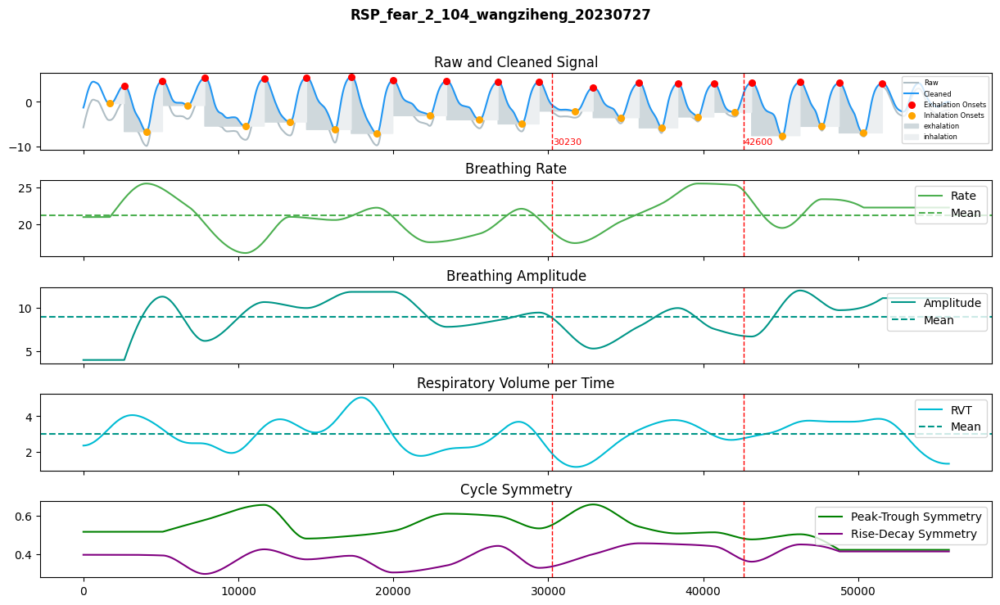

In [276]:
time_points = get_apexs(avi)
rsp = df_biopac_marker['RSP'].to_numpy()
rsp_signals, info = nk.rsp_process(rsp, sampling_rate=1000)
rsp_plot(rsp_signals, info, avi, time_points, show=True)

### EDA

In [74]:
def eda_plot(signals, info, avi_name, time_points, show, static=True):
    # Determine peaks, onsets, and half recovery.
    peaks = np.where(eda_signals["SCR_Peaks"] == 1)[0]
    onsets = np.where(eda_signals["SCR_Onsets"] == 1)[0]
    half_recovery = np.where(eda_signals["SCR_Recovery"] == 1)[0]

    # clean peaks that do not have onsets
    if len(peaks) > len(onsets):
        peaks = peaks[1:]

    # Determine unit of x-axis.
#     x_label = "Time (seconds)"
    x_axis = np.linspace(0, len(eda_signals), len(eda_signals))

    if static:
        fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(15,8))
        fig.suptitle("EDA_" + avi_name.split('.')[0], fontweight="bold")

        # 设置子图之间的垂直和水平间距
        plt.subplots_adjust(hspace=0.4)  # hspace 控制垂直间距

        last_ax = fig.get_axes()[-1]
#         last_ax.set_xlabel(x_label)

        # Plot cleaned and raw electrodermal activity.
        ax0.set_title("Raw and Cleaned Signal")
        ax0.plot(x_axis, eda_signals["EDA_Raw"], color="#B0BEC5", label="Raw", zorder=1)
        ax0.plot(
            x_axis,
            eda_signals["EDA_Clean"],
            color="#9C27B0",
            label="Cleaned",
            linewidth=1.5,
            zorder=1,
        )
        ax0.legend(loc="upper right")

        # Plot skin conductance response.
        ax1.set_title("Skin Conductance Response (SCR)")

        # Plot Phasic.
        ax1.plot(
            x_axis,
            eda_signals["EDA_Phasic"],
            color="#E91E63",
            label="Phasic Component",
            linewidth=1.5,
            zorder=1,
        )

        # Mark segments.
        risetime_coord, amplitude_coord, halfr_coord = _eda_plot_dashedsegments(
            eda_signals, ax1, x_axis, onsets, peaks, half_recovery
        )

        risetime = matplotlib.collections.LineCollection(
            risetime_coord, colors="#FFA726", linewidths=1, linestyle="dashed"
        )
        ax1.add_collection(risetime)

        amplitude = matplotlib.collections.LineCollection(
            amplitude_coord, colors="#1976D2", linewidths=1, linestyle="solid"
        )
        ax1.add_collection(amplitude)

        halfr = matplotlib.collections.LineCollection(
            halfr_coord, colors="#FDD835", linewidths=1, linestyle="dashed"
        )
        ax1.add_collection(halfr)
        ax1.legend(loc="upper right")

        # Plot Tonic.
        ax2.set_title("Skin Conductance Level (SCL)")
        ax2.plot(
            x_axis,
            eda_signals["EDA_Tonic"],
            color="#673AB7",
            label="Tonic Component",
            linewidth=1.5,
        )
        ax2.legend(loc="upper right")
        
        # ------------------------------------------ 添加竖线 ------------------------------------------------

        for tp in time_points:
            ax0.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax1.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax2.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            
            # 在红色虚线的右下侧显示对应的数字
            ax0.text(tp + 50, ax0.get_ylim()[0] + 0.05 * (ax0.get_ylim()[1] - ax0.get_ylim()[0]), 
                     str(tp), color='red', fontsize=8, verticalalignment='bottom', horizontalalignment='left')   
            
        # 保存图像到本地
        save_path = os.path.join('pics_ps_apex\Micro', 'eda_' + avi_name.split('.')[0] + '.png')
        plt.savefig(save_path, dpi=300)
        
        if show:
            plt.show()
        else:
            plt.close()  # 关闭当前图形，不会显示

    else:
        # Create interactive plot with plotly.
        try:
            import plotly.graph_objects as go
            from plotly.subplots import make_subplots

        except ImportError as e:
            raise ImportError(
                "NeuroKit error: ppg_plot(): the 'plotly'",
                " module is required when 'static' is False.",
                " Please install it first (`pip install plotly`).",
            ) from e

        fig = make_subplots(
            rows=3,
            cols=1,
            shared_xaxes=True,
            vertical_spacing=0.05,
            subplot_titles=(
                "Raw and Cleaned Signal",
                "Skin Conductance Response (SCR)",
                "Skin Conductance Level (SCL)",
            ),
        )

        # Plot cleaned and raw electrodermal activity.
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=eda_signals["EDA_Raw"],
                mode="lines",
                name="Raw",
                line=dict(color="#B0BEC5"),
                showlegend=True,
            ),
            row=1,
            col=1,
        )

        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=eda_signals["EDA_Clean"],
                mode="lines",
                name="Cleaned",
                line=dict(color="#9C27B0"),
                showlegend=True,
            ),
            row=1,
            col=1,
        )

        # Plot skin conductance response.
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=eda_signals["EDA_Phasic"],
                mode="lines",
                name="Phasic Component",
                line=dict(color="#E91E63"),
                showlegend=True,
            ),
            row=2,
            col=1,
        )

        # Mark segments.
        _, _, _ = _eda_plot_dashedsegments(
            eda_signals, fig, x_axis, onsets, peaks, half_recovery, static=static
        )

        # TODO add dashed segments to plotly version

        # Plot skin conductance level.
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=eda_signals["EDA_Tonic"],
                mode="lines",
                name="Tonic Component",
                line=dict(color="#673AB7"),
                showlegend=True,
            ),
            row=3,
            col=1,
        )

        # Add title to entire figure.
        fig.update_layout(title_text="Electrodermal Activity (EDA)", title_x=0.5)

        return fig

def _eda_plot_dashedsegments(eda_signals, ax, x_axis, onsets, peaks, half_recovery, static=True):
    # Mark onsets, peaks, and half-recovery.
    onset_x_values = x_axis[onsets]
    onset_y_values = eda_signals["EDA_Phasic"][onsets].values
    peak_x_values = x_axis[peaks]
    peak_y_values = eda_signals["EDA_Phasic"][peaks].values
    halfr_x_values = x_axis[half_recovery]
    halfr_y_values = eda_signals["EDA_Phasic"][half_recovery].values

    end_onset = pd.Series(
        eda_signals["EDA_Phasic"][onsets].values, eda_signals["EDA_Phasic"][peaks].index
    )

    risetime_coord = []
    amplitude_coord = []
    halfr_coord = []

    for i in range(len(onsets)):
        # Rise time.
        start = (onset_x_values[i], onset_y_values[i])
        end = (peak_x_values[i], onset_y_values[i])
        risetime_coord.append((start, end))

    for i in range(len(peaks)):
        # SCR Amplitude.
        start = (peak_x_values[i], onset_y_values[i])
        end = (peak_x_values[i], peak_y_values[i])
        amplitude_coord.append((start, end))

    for i in range(len(half_recovery)):
        # Half recovery.
        end = (halfr_x_values[i], halfr_y_values[i])
        peak_x_idx = np.where(peak_x_values < halfr_x_values[i])[0][-1]
        start = (peak_x_values[peak_x_idx], halfr_y_values[i])
        halfr_coord.append((start, end))

    if static:
        # Plot with matplotlib.
        # Mark onsets, peaks, and half-recovery.
        ax.scatter(
            x_axis[onsets],
            eda_signals["EDA_Phasic"][onsets],
            color="#FFA726",
            label="SCR - Onsets",
            zorder=2,
        )
        ax.scatter(
            x_axis[peaks],
            eda_signals["EDA_Phasic"][peaks],
            color="#1976D2",
            label="SCR - Peaks",
            zorder=2,
        )
        ax.scatter(
            x_axis[half_recovery],
            eda_signals["EDA_Phasic"][half_recovery],
            color="#FDD835",
            label="SCR - Half recovery",
            zorder=2,
        )

        ax.scatter(x_axis[end_onset.index], end_onset.values, alpha=0)
    else:
        # Create interactive plot with plotly.
        try:
            import plotly.graph_objects as go

        except ImportError as e:
            raise ImportError(
                "NeuroKit error: ppg_plot(): the 'plotly'",
                " module is required when 'static' is False.",
                " Please install it first (`pip install plotly`).",
            ) from e
        # Plot with plotly.
        # Mark onsets, peaks, and half-recovery.
        ax.add_trace(
            go.Scatter(
                x=x_axis[onsets],
                y=eda_signals["EDA_Phasic"][onsets],
                mode="markers",
                name="SCR - Onsets",
                marker=dict(color="#FFA726"),
                showlegend=True,
            ),
            row=2,
            col=1,
        )
        ax.add_trace(
            go.Scatter(
                x=x_axis[peaks],
                y=eda_signals["EDA_Phasic"][peaks],
                mode="markers",
                name="SCR - Peaks",
                marker=dict(color="#1976D2"),
                showlegend=True,
            ),
            row=2,
            col=1,
        )
        ax.add_trace(
            go.Scatter(
                x=x_axis[half_recovery],
                y=eda_signals["EDA_Phasic"][half_recovery],
                mode="markers",
                name="SCR - Half recovery",
                marker=dict(color="#FDD835"),
                showlegend=True,
            ),
            row=2,
            col=1,
        )
        ax.add_trace(
            go.Scatter(
                x=x_axis[end_onset.index],
                y=end_onset.values,
                mode="markers",
                marker=dict(color="#FDD835", opacity=0),
                showlegend=False,
            ),
            row=2,
            col=1,
        )

    return risetime_coord, amplitude_coord, halfr_coord

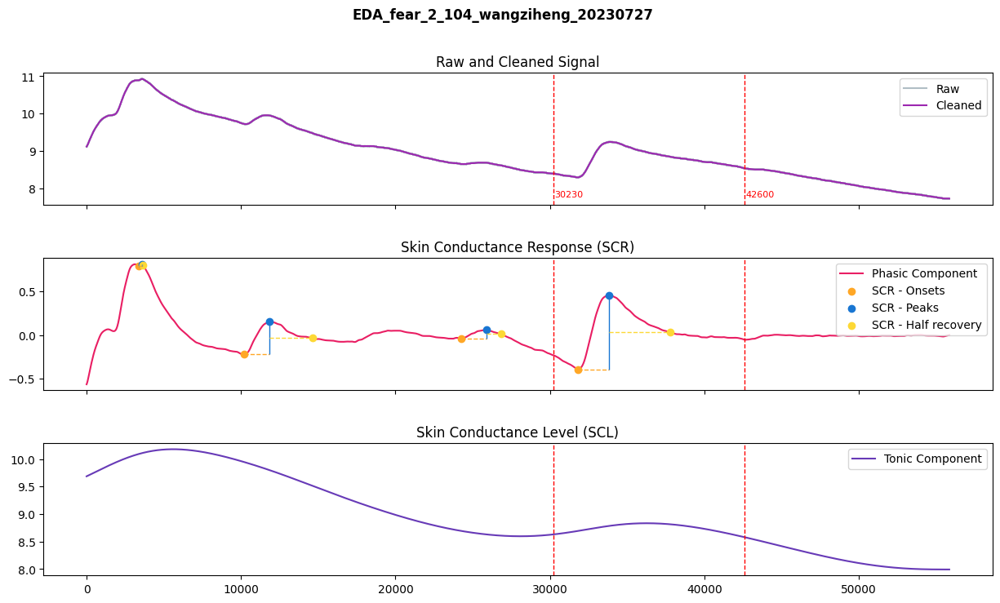

In [287]:
time_points = get_apexs(avi)
eda = df_biopac_marker['EDA'].to_numpy()
eda_signals, info = nk.eda_process(eda, sampling_rate=1000)
eda_plot(eda_signals, info, avi, time_points, show=True)

### PPG

In [75]:
def ppg_plot(ppg_signals, info, avi_name, time_points, show, static=True):
    # Sanity-check input.
    if not isinstance(ppg_signals, pd.DataFrame):
        raise ValueError(
            "NeuroKit error: The `ppg_signals` argument must"
            " be the DataFrame returned by `ppg_process()`."
        )

    # Extract Peaks.
    if info is None:
        warn(
            "'info' dict not provided. Some information might be missing."
            + " Sampling rate will be set to 1000 Hz.",
            category=NeuroKitWarning,
        )
        info = {"sampling_rate": 1000}

    # Extract Peaks (take those from df as it might have been cropped)
    if "PPG_Peaks" in ppg_signals.columns:
        info["PPG_Peaks"] = np.where(ppg_signals["PPG_Peaks"] == 1)[0]

    if static:    
        fig, (ax0, ax1) = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(15,8))
        fig.suptitle("PPG_" + avi_name.split('.')[0], fontweight="bold")

        # Plot cleaned and raw PPG
        ax0 = _ppg_peaks_plot(
            ppg_signals["PPG_Clean"].values,
            info=info,
            sampling_rate=info["sampling_rate"],
            raw=ppg_signals["PPG_Raw"].values,
            quality=ppg_signals["PPG_Quality"].values,
            ax=ax0,
        )

        # Plot Heart Rate
        ax1 = _signal_rate_plot(
            ppg_signals["PPG_Rate"].values,
            info["PPG_Peaks"],
            sampling_rate=info["sampling_rate"],
            title="Heart Rate",
            ytitle="Beats per minute (bpm)",
            color="#FB661C",
            color_mean="#FBB41C",
            color_points="#FF9800",
            ax=ax1,
        )
        
        # ------------------------------------------ 添加竖线 ------------------------------------------------

        for tp in time_points:
            ax0.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax1.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            # 在红色虚线的右下侧显示对应的数字
            ax0.text(tp + 50, ax0.get_ylim()[0] + 0.05 * (ax0.get_ylim()[1] - ax0.get_ylim()[0]), 
                     str(tp), color='red', fontsize=8, verticalalignment='bottom', horizontalalignment='left')   
            
        # 保存图像到本地
        save_path = os.path.join('pics_ps_apex\Micro', 'ppg_' + avi_name.split('.')[0] + '.png')
        plt.savefig(save_path, dpi=300)
        
        if show:
            plt.show()
        else:
            plt.close()  # 关闭当前图形，不会显示


    else:
        try:
            import plotly.graph_objects as go
            from plotly.subplots import make_subplots

        except ImportError as e:
            raise ImportError(
                "NeuroKit error: ppg_plot(): the 'plotly'",
                " module is required when 'static' is False.",
                " Please install it first (`pip install plotly`).",
            ) from e

        # X-axis
        x_axis = np.linspace(0, len(ppg_signals), len(ppg_signals))

        fig = make_subplots(
            rows=2,
            cols=1,
            shared_xaxes=True,
            subplot_titles=("Raw and Cleaned Signal", "Rate"),
        )

        # Plot cleaned and raw PPG
        fig.add_trace(
            go.Scatter(x=x_axis, y=ppg_signals["PPG_Raw"], name="Raw"), row=1, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=ppg_signals["PPG_Clean"],
                name="Cleaned",
                marker_color="#FB1CF0",
            ),
            row=1,
            col=1,
        )

        # Plot peaks
        fig.add_trace(
            go.Scatter(
                x=x_axis[info["PPG_Peaks"]],
                y=ppg_signals["PPG_Clean"][info["PPG_Peaks"]],
                name="Peaks",
                mode="markers",
                marker_color="#D60574",
            ),
            row=1,
            col=1,
        )

        # Rate
        ppg_rate_mean = ppg_signals["PPG_Rate"].mean()
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=ppg_signals["PPG_Rate"],
                name="Rate",
                mode="lines",
                marker_color="#FB661C",
            ),
            row=2,
            col=1,
        )
        fig.add_hline(
            y=ppg_rate_mean,
            line_dash="dash",
            line_color="#FBB41C",
            name="Mean",
            row=2,
            col=1,
        )
        fig.update_layout(title_text="Photoplethysmogram (PPG)", height=500, width=750)
        if info["sampling_rate"] is not None:
            fig.update_xaxes(title_text="Time (seconds)", row=1, col=1)
            fig.update_xaxes(title_text="Time (seconds)", row=2, col=1)
        elif info["sampling_rate"] is None:
            fig.update_xaxes(title_text="Samples", row=1, col=1)
            fig.update_xaxes(title_text="Samples", row=2, col=1)
        return fig
    
def _ppg_peaks_plot(
    ppg_cleaned,
    info=None,
    sampling_rate=1000,
    raw=None,
    quality=None,
    ax=None,):
    x_axis = np.linspace(0, len(ppg_cleaned), len(ppg_cleaned))

    # Prepare plot
    if ax is None:
        _, ax = plt.subplots()

#     ax.set_xlabel("Time (seconds)")
    ax.set_title("PPG signal and peaks")

    # Quality Area -------------------------------------------------------------
    if quality is not None:
        quality = rescale(
            quality,
            to=[
                np.min([np.min(raw), np.min(ppg_cleaned)]),
                np.max([np.max(raw), np.max(ppg_cleaned)]),
            ],
        )
        minimum_line = np.full(len(x_axis), quality.min())

        # Plot quality area first
        ax.fill_between(
            x_axis,
            minimum_line,
            quality,
            alpha=0.12,
            zorder=0,
            interpolate=True,
            facecolor="#4CAF50",
            label="Signal quality",
        )

    # Raw Signal ---------------------------------------------------------------
    if raw is not None:
        ax.plot(x_axis, raw, color="#B0BEC5", label="Raw signal", zorder=1)
        label_clean = "Cleaned signal"
    else:
        label_clean = "Signal"

    # Peaks -------------------------------------------------------------------
    ax.scatter(
        x_axis[info["PPG_Peaks"]],
        ppg_cleaned[info["PPG_Peaks"]],
        color="#FFC107",
        label="Systolic peaks",
        zorder=2,
        s=10
    )

    # Artifacts ---------------------------------------------------------------
    _ecg_peaks_plot_artefacts(
        x_axis,
        ppg_cleaned,
        info,
        info["PPG_Peaks"],
        ax,
    )

    # Clean Signal ------------------------------------------------------------
    ax.plot(
        x_axis,
        ppg_cleaned,
        color="#E91E63",
        label=label_clean,
        zorder=3,
        linewidth=0.6
    )

    # Optimize legend
    ax.legend(loc="upper right")

    return ax

def _ecg_peaks_plot_artefacts(
    x_axis,
    signal,
    info,
    peaks,
    ax,):
    raw = [s for s in info.keys() if str(s).endswith("Peaks_Uncorrected")]
    if len(raw) == 0:
        return "No correction"
    raw = info[raw[0]]
    if len(raw) == 0:
        return "No bad peaks"
    if any([i < len(signal) for i in raw]):
        return "Peak indices longer than signal. Signals might have been cropped. " + "Better skip plotting."

    extra = [i for i in raw if i not in peaks]
    if len(extra) > 0:
        ax.scatter(
            x_axis[extra],
            signal[extra],
            color="#4CAF50",
            label="Peaks removed after correction",
            marker="x",
            zorder=2,
        )

    added = [i for i in peaks if i not in raw]
    if len(added) > 0:
        ax.scatter(
            x_axis[added],
            signal[added],
            color="#FF9800",
            label="Peaks added after correction",
            marker="x",
            zorder=2,
        )
    return ax

def _signal_rate_plot(
    rate,
    peaks,
    sampling_rate=None,
    interpolation_method=None,
    title="Rate",
    ytitle="Cycle per minute",
    color="black",
    color_mean="orange",
    color_points="red",
    ax=None,):
    # Prepare plot
    
    if ax is None:
        fig, ax = plt.subplots()

    if sampling_rate is None:
        x_axis = np.arange(0, len(rate))
#         ax.set_xlabel("Time (samples)")
    else:
        x_axis = np.linspace(0, len(rate), len(rate))
#         ax.set_xlabel("Time (seconds)")

    if interpolation_method is not None:
        title += " (interpolation method: " + str(interpolation_method) + ")"
    ax.set_title(title)
    ax.set_ylabel(ytitle)

    # Plot continuous rate
    ax.plot(
        x_axis,
        rate,
        color=color,
        label="Rate",
        linewidth=0.6
    )

    # Plot points
    if peaks is not None:
        ax.scatter(
            x_axis[peaks],
            rate[peaks],
            color=color_points,
            s=10
        )

    # Show average rate
    rate_mean = rate.mean()
    ax.axhline(y=rate_mean, label="Mean", linestyle="--", color=color_mean)

    ax.legend(loc="upper right")

    return ax

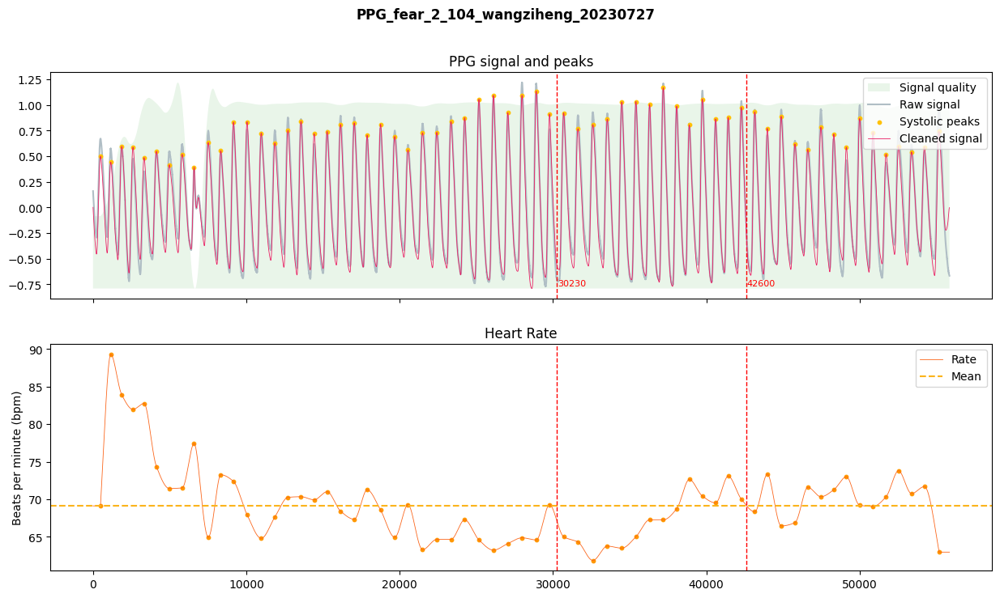

In [289]:
time_points = get_apexs(avi)
ppg = df_biopac_marker['PPG'].to_numpy()
ppg_signals, info = nk.ppg_process(ppg, sampling_rate=1000)
ppg_plot(ppg_signals, info, avi, time_points, show=True)

## 遍历所有.h5文件和marker

In [97]:
# 遍历目录下的文件
for filename in os.listdir('biopac_data_HDF5'):
    if filename.endswith('.h5'):
        print(filename)  # 输出 .h5 文件的完整路径
        # 加载该h5文件
        df_biopac_data = pd.read_hdf(os.path.join('biopac_data_HDF5', filename), key='df')
        # 根据h5找avi
        avi_names = h5_to_avis(filename, micro_dict)
        print('avi_names:', avi_names)
        if avi_names: # 如果列表不为空，遍历
            for avi in avi_names:
                marker = avi.split('_')[2]
                time_points = get_apexs(avi)
                print('time_points:', time_points)
                # 根据marker找到对应的数据
                df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
                df_biopac_marker = df_biopac_marker.reset_index(drop=True)
                
                # ECG
                ecg = df_biopac_marker['ECG'].to_numpy()
                ecg_signals, ecg_info = nk.ecg_process(ecg, sampling_rate=1000)
                ecg_plot(ecg_signals, ecg_info, avi, time_points, save_path, show=False)
#                 # RSP
#                 rsp = df_biopac_marker['RSP'].to_numpy()
#                 rsp_signals, rsp_info = nk.rsp_process(rsp, sampling_rate=1000)
#                 rsp_plot(rsp_signals, rsp_info, avi, time_points, show=False)
#                 # EDA
#                 eda = df_biopac_marker['EDA'].to_numpy()
#                 eda_signals, eda_info = nk.eda_process(eda, sampling_rate=1000)
#                 eda_plot(eda_signals, eda_info, avi, time_points, show=False) 
#                 # PPG
#                 ppg = df_biopac_marker['PPG'].to_numpy()
#                 ppg_signals, ppg_info = nk.ppg_process(ppg, sampling_rate=1000)
#                 ppg_plot(ppg_signals, ppg_info, avi, time_points, show=False)     

chenhao_20240111.h5
avi_names: ['disgust_1_104_chenhao_20240111.avi', 'disgust_2_135_chenhao_20240111.avi', 'disgust_3_111_chenhao_20240111.avi', 'fear_1_103_chenhao_20240111.avi', 'fear_2_108_chenhao_20240111.avi', 'fear_4_116_chenhao_20240111.avi', 'sad_3_140_chenhao_20240111.avi']
time_points: [20080]
time_points: [52510]
time_points: [20460]
time_points: [31660, 35520]
time_points: [19300]
time_points: [32120]
time_points: [24160, 33090, 56090]
fengdengfang_20230802.h5
avi_names: ['fear_2_104_fengdengfang_20230802.avi', 'fear_5_130_fengdengfang_20230802.avi', 'fear_6_139_fengdengfang_20230802.avi', 'happy_2_103_fengdengfang_20230802.avi', 'surprise_1_147_fengdengfang_20230802.avi']
time_points: [39150, 55060]
time_points: [56830]
time_points: [31540]
time_points: [18680, 41860]
time_points: [6800]
fuxiangyu_20240110.h5
avi_names: ['disgust_4_143_fuxiangyu_20240110.avi', 'fear_2_131_fuxiangyu_20240110.avi', 'fear_3_139_fuxiangyu_20240110.avi', 'fear_4_142_fuxiangyu_20240110.avi', 's

yansen_20230731.h5
avi_names: ['fear_4_121_yansen_20230731.avi', 'happy_1_123_yansen_20230731.avi']
time_points: [29900]
time_points: [5200]
yuelu_20230720.h5
avi_names: []
zhangbuyuan_20230801.h5
avi_names: ['disgust_2_102_zhangbuyuan_20230801.avi', 'disgust_4_119_zhangbuyuan_20230801.avi', 'happy_2_103_zhangbuyuan_20230801.avi']
time_points: [52100, 54750]
time_points: [6820]
time_points: [46140]
zhangdi_20230721.h5
avi_names: ['disgust_3_110_zhangdi_20230721.avi', 'disgust_5_128_zhangdi_20230721.avi', 'fear_6_139_zhangdi_20230721.avi', 'surprise_6_143_zhangdi_20230721.avi']
time_points: [29980, 32690]
time_points: [26650]
time_points: [53740]
time_points: [20760]
zhaolei_20230803.h5
avi_names: ['disgust_6_137_zhaolei_20230803.avi', 'fear_4_121_zhaolei_20230803.avi', 'fear_6_139_zhaolei_20230803.avi', 'happy_1_123_zhaolei_20230803.avi', 'sad_5_127_zhaolei_20230803.avi', 'surprise_1_147_zhaolei_20230803.avi']
time_points: [18980]
time_points: [4200]
time_points: [8240]
time_points: [1

## 将图片保存至PDF

### 不同的PS分别保存为单独的pdf

In [91]:
import os
from PIL import Image
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas

# 函数：将图片保存为高分辨率PDF
def images_to_pdf(image_paths, output_pdf, dpi=300):
    # 设置高 DPI 的页面宽度和高度
    c = canvas.Canvas(output_pdf, pagesize=letter)
    page_width, page_height = letter
    images_per_page = 3  # 每页三张图片

    # 按照DPI调整每英寸的像素数量
    scale_factor = dpi / 72  # ReportLab使用72DPI为基准

    for i in range(0, len(image_paths), images_per_page):
        images = image_paths[i:i + images_per_page]

        # 计算每张图片的宽高并按比例缩放
        heights = []
        for img_path in images:
            img = Image.open(img_path)
            width, height = img.size
            aspect_ratio = height / width
            img_resized_height = page_width * aspect_ratio  # 缩放后的高度
            heights.append(img_resized_height * scale_factor)  # 按DPI缩放

        total_height = sum(heights)

        # 如果拼接后的总高度超过页面高度，则等比例缩小所有图片
        if total_height > page_height * scale_factor:
            page_scale_factor = (page_height * scale_factor) / total_height * 0.9
            heights = [h * page_scale_factor for h in heights]

        # 在每页按顺序放置图片
        current_y = page_height
        for img_path, height in zip(images, heights):
            img = Image.open(img_path)
            img_width, img_height = img.size
            aspect_ratio = img_height / img_width
            new_height = page_width * aspect_ratio * scale_factor
            new_height = height  # 使用之前计算的DPI调整后的高度

            # 在页面中逐步向下放置图片
            current_y -= new_height / scale_factor  # 转换回像素

            # 将高分辨率图片绘制到PDF中
            c.drawImage(
                img_path,
                0,
                current_y,
                width=page_width,
                height=new_height / scale_factor,  # 按DPI还原比例
                preserveAspectRatio=True,
                mask='auto'
            )

        c.showPage()

    c.save()

# 函数：遍历目录下的所有以"ECG"开头的图片
def find_ecg_images(directory, start):
    ecg_images = []
    for filename in os.listdir(directory):
        if filename.startswith(start) and filename.endswith((".jpg", ".png", ".jpeg")):
            ecg_images.append(os.path.join(directory, filename))
    return sorted(ecg_images)  # 排序，确保顺序一致

In [98]:
PS = ['ecg', 'rsp', 'eda', 'ppg']
start = PS[0]

image_directory = "pics_ps_apex\Micro"
output_pdf = r"pics_ps_apex/Micro/" + start + "_images.pdf"

# 找到所有ECG开头的图片
ecg_images = find_ecg_images(image_directory, start)

# 将这些图片拼接为高分辨率PDF
if ecg_images:
    images_to_pdf(ecg_images, output_pdf, dpi=300)
    print(f"High-resolution PDF saved as {output_pdf}")
else:
    print("No images found.")

High-resolution PDF saved as pics_ps_apex/Micro/ecg_images.pdf


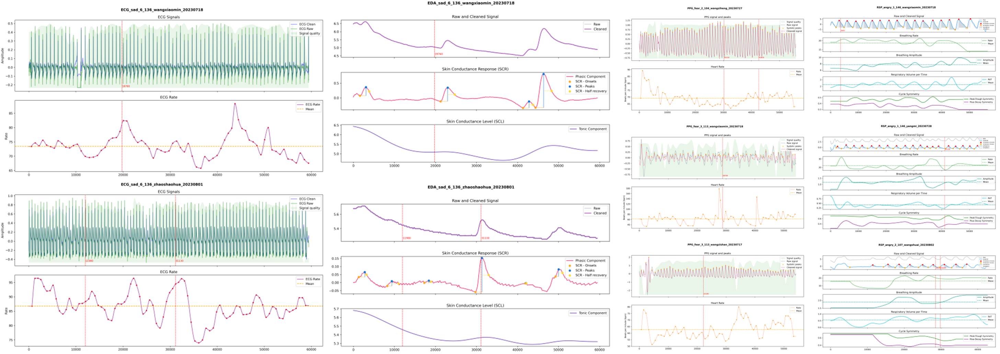

### 每个ME所有PS合并

In [331]:
import os
from PIL import Image
from reportlab.pdfgen import canvas
from reportlab.lib.pagesizes import letter
from reportlab.lib.utils import ImageReader  # 用于直接从 PIL.Image 读取图像
  
def images_to_pdf(image_groups, output_pdf, dpi=300):
    # 设置高 DPI 的页面宽度和高度
    c = canvas.Canvas(output_pdf, pagesize=letter)
    page_width, page_height = letter
    images_per_page = 4  # 每页放置的图片数量

    # 按照DPI调整每英寸的像素数量
    scale_factor = dpi / 72  # ReportLab使用72DPI为基准

    for images in image_groups:
        # 计算每张图片的宽高并按比例缩放
        heights = []
        for i, img_path in enumerate(images):
            img = Image.open(img_path)
            width, height = img.size
            aspect_ratio = height / width
            if i == 0:  # 如果是第一张图片，放大宽度
                img_resized_height = page_width * aspect_ratio * 0.825
            else:
                img_resized_height = page_width * aspect_ratio  # 缩放后的高度
            heights.append(img_resized_height * scale_factor)  # 按DPI缩放

        total_height = sum(heights)

        # 如果拼接后的总高度超过页面高度，则等比例缩小所有图片
        if total_height > page_height * scale_factor:
            page_scale_factor = (page_height * scale_factor) / total_height
            heights = [h * page_scale_factor for h in heights]

        # 在每页按顺序放置图片
        current_y = page_height
        for i, (img_path, height) in enumerate(zip(images, heights)):
            img = Image.open(img_path)
            img_width, img_height = img.size
            aspect_ratio = img_height / img_width
            new_height = page_width * aspect_ratio * scale_factor
            new_height = height  # 使用之前计算的DPI调整后的高度

            # 在页面中逐步向下放置图片
            current_y -= new_height / scale_factor  # 转换回像素

            # 将高分辨率图片绘制到PDF中
            if i == 0:  # 如果是第一张图片，向左移动一点
                x_offset = -2  # 向左移动的距离，可以根据需要调整
            else:
                x_offset = 0  # 其他图片不进行偏移

            c.drawImage(
                img_path,
                x_offset,  # 调整x_offset，第一张图片向左移动
                current_y,
                width=page_width,
                height=new_height / scale_factor,  # 按DPI还原比例
                preserveAspectRatio=True,
                mask='auto'
            )

        c.showPage()

    c.save()

# 查找所有符合条件的图片，并按相同信息部分分组
def find_images_by_group(directory):
    image_groups = {}
    prefixes = ['ecg', 'rsp', 'eda', 'ppg']

    for filename in os.listdir(directory):
        if filename.endswith('.png'):
            for prefix in prefixes:
                if filename.startswith(prefix):
                    # 提取去掉前缀后的信息部分作为分组依据
                    info = filename[len(prefix)+1:].split('.')[0]  # 提取除去前缀的部分
                    if info not in image_groups:
                        image_groups[info] = {}
                    image_groups[info][prefix] = os.path.join(directory, filename)

    # 按编号排序，并组装完整的图片路径列表
    sorted_groups = []
    for info in sorted(image_groups.keys()):
        group = image_groups[info]
        if all(prefix in group for prefix in prefixes):  # 确保每组都包含所有前缀的图片
            sorted_groups.append([group[prefix] for prefix in prefixes])

    return sorted_groups

image_directory = "pics_pre_aft\Micro"  # 确保路径正确
output_pdf = "pics_pre_aft\Micro\combined_images.pdf"
# 找到按信息部分分组的图片
image_groups = find_images_by_group(image_directory)

# print('image_groups:', image_groups)

# 如果找到符合条件的图片，生成PDF
if image_groups:
    images_to_pdf(image_groups, output_pdf, dpi=300)  # 调整DPI到300，提高分辨率
    print(f"PDF saved as {output_pdf}")
else:
    print("No matching image groups found.")


PDF saved as plot_key_timepoints/combined_images.pdf


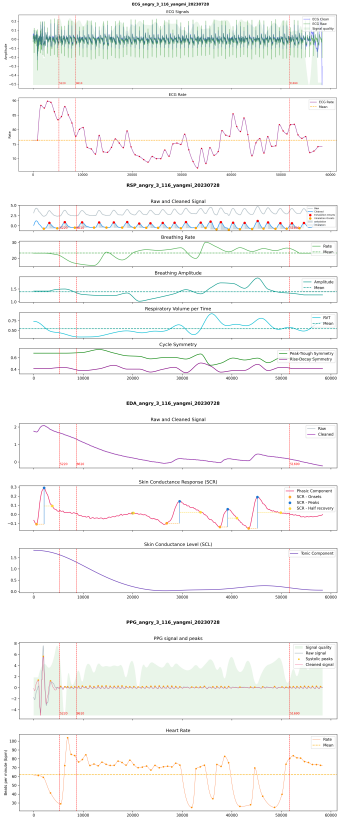

## 相关性检验

In [332]:
micro_dict

{'angry_1_146_wangxiaomin_20230718.avi': [('3.400', '3.600', '3.600')],
 'angry_1_146_yangmi_20230728.avi': [('40.960', '41.100', '41.370')],
 'angry_2_107_wangshuai_20230802.avi': [('28.250', '28.500', '28.700'),
  ('29.440', '29.840', '29.840')],
 'angry_2_107_wangzishan_20230717.avi': [('26.100', '26.260', '26.260')],
 'angry_2_107_zhaoshaohua_20230801.avi': [('16.860', '17.190', '17.330')],
 'angry_3_116_liyan_20230802.avi': [('1.700', '1.970', '2.200'),
  ('10.060', '10.250', '10.500'),
  ('41.290', '41.570', '41.760')],
 'angry_3_116_yangmi_20230728.avi': [('4.940', '5.220', '5.400'),
  ('51.500', '51.690', '51.970'),
  ('8.420', '8.610', '8.890')],
 'angry_3_116_zhaoshaohua_20230801.avi': [('25.450', '25.640', '25.910')],
 'angry_4_125_wangziheng_20230727.avi': [('53.780', '53.960', '54.230')],
 'angry_4_125_zhengwansheng_20230718.avi': [('6.270', '6.540', '6.720')],
 'angry_5_133_wangxiaomin_20230718.avi': [('2.190', '2.470', '2.660'),
  ('6.560', '6.750', '7.010')],
 'angry_6_

In [398]:
avi_test = 'angry_1_146_yangmi_20230728.avi'
apex_test = float(micro_dict[avi_test][0][1])
marker = avi_test.split('_')[2]
print('avi_test:', avi_test)
print('apex_test:', apex_test)
print('marker:', marker)

avi_test: angry_1_146_yangmi_20230728.avi
apex_test: 41.1
marker: 146


In [399]:
h5_name_test = avi_to_h5(avi_test)
print('h5_name_test:', h5_name_test)

h5_name_test: yangmi_7.28.h5


In [400]:
biopac_file_path = 'biopac_data_HDF5/' + h5_name_test
df_biopac_data = pd.read_hdf(biopac_file_path, key='df')
df_biopac_data

,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
0,-0.288696,2.055359,-0.004883,32.000610,2.120913,-0.103607,0.005646,32.000000,0.000000,100
1,-0.288086,2.054749,-0.004883,31.999390,2.119387,-0.111542,0.005798,32.000000,0.000000,100
2,-0.288086,2.054749,-0.004730,32.000000,2.117861,-0.120850,0.005798,31.999390,0.000000,100
3,-0.288696,2.054749,-0.004730,31.999390,2.119387,-0.132446,0.006256,31.998779,0.000000,100
4,-0.291443,2.055054,-0.005035,31.997559,2.119387,-0.143433,0.005951,31.997559,0.000000,100
...,...,...,...,...,...,...,...,...,...,...
4017648,0.973816,2.059937,-0.005035,32.000000,2.326906,-0.082703,0.005341,32.000000,75.471698,100
4017649,0.967712,2.062073,-0.004883,32.000000,2.329958,-0.083466,0.005798,32.000000,75.471698,100
4017650,0.959167,2.065430,-0.004883,32.000610,2.326906,-0.085907,0.005951,31.999390,75.471698,100
4017651,0.953369,2.066345,-0.004883,31.998169,2.326906,-0.086212,0.005646,31.999390,75.471698,100


In [401]:
df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
df_biopac_marker = df_biopac_marker.reset_index(drop=True)
df_biopac_marker

,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
0,-1.618347,2.853088,-0.004883,31.997559,2.011050,0.043793,0.005951,31.998169,43.572985,146
1,-1.621399,2.847595,-0.005035,32.000000,2.007998,0.055695,0.005646,32.000000,43.572985,146
2,-1.623840,2.840271,-0.005188,32.000000,2.006472,0.064545,0.005646,32.000000,43.572985,146
3,-1.627808,2.834473,-0.005035,32.000610,2.007998,0.070038,0.005798,32.001831,43.572985,146
4,-1.631165,2.829895,-0.004883,31.998779,2.007998,0.072632,0.005798,31.995728,43.572985,146
...,...,...,...,...,...,...,...,...,...,...
56480,-0.086975,3.166199,-0.005035,31.999390,-0.677549,-0.007019,0.005798,32.000000,68.493151,146
56481,-0.088501,3.166809,-0.005035,32.000000,-0.677549,-0.004883,0.005493,32.000000,68.493151,146
56482,-0.088196,3.162231,-0.004578,31.998779,-0.679075,-0.004272,0.005798,31.996338,68.493151,146
56483,-0.090332,3.161316,-0.004883,32.000610,-0.679075,-0.002594,0.006104,32.001221,68.493151,146


In [402]:
epoch = 5 # 取峰值帧左右各epoch秒

In [403]:
df_epoch_pre = df_biopac_marker.iloc[int((apex_test - epoch)*1000): int(apex_test*1000) + 1, :]
df_epoch_pre

,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
36100,-0.077820,3.144226,-0.004883,32.000000,0.056399,-0.029907,0.005798,32.000000,62.305296,146
36101,-0.078430,3.146667,-0.005035,31.999390,0.057925,-0.032196,0.005798,32.000000,62.305296,146
36102,-0.077820,3.147278,-0.004883,31.999390,0.059450,-0.032196,0.006104,32.000610,62.305296,146
36103,-0.078125,3.146667,-0.005188,31.998779,0.057925,-0.032349,0.005646,31.996338,62.305296,146
36104,-0.078735,3.146362,-0.005188,31.999390,0.057925,-0.032349,0.005493,31.995117,62.305296,146
...,...,...,...,...,...,...,...,...,...,...
41096,-0.097656,2.999573,-0.004730,32.001831,-0.125181,-0.060425,0.005951,32.002441,59.288538,146
41097,-0.097351,2.999268,-0.004883,32.000610,-0.123655,-0.061340,0.005798,32.000000,59.288538,146
41098,-0.097656,3.000488,-0.004883,31.998169,-0.129759,-0.063171,0.005646,31.998779,59.288538,146
41099,-0.097656,2.999573,-0.004883,31.998779,-0.128233,-0.064240,0.005951,32.000000,59.288538,146


In [404]:
df_epoch_aft = df_biopac_marker.iloc[int(apex_test*1000): int((apex_test + epoch)*1000) + 1, :]
df_epoch_aft

,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
41100,-0.096741,3.000183,-0.004883,32.000610,-0.125181,-0.064850,0.006104,31.998169,59.288538,146
41101,-0.098877,2.999573,-0.005035,32.002441,-0.125181,-0.066376,0.005646,32.002441,59.288538,146
41102,-0.097046,2.999878,-0.004730,31.999390,-0.129759,-0.067749,0.005951,31.999390,59.288538,146
41103,-0.097961,2.999878,-0.005188,31.998169,-0.128233,-0.068970,0.005951,31.998169,59.288538,146
41104,-0.097351,2.999268,-0.004883,31.998779,-0.126707,-0.068817,0.005493,32.000000,59.288538,146
...,...,...,...,...,...,...,...,...,...,...
46096,0.263062,3.034058,-0.004730,32.000000,-0.326597,0.004578,0.005951,32.000000,63.025210,146
46097,0.262756,3.033447,-0.004578,32.000000,-0.323545,0.004883,0.005646,32.000610,63.025210,146
46098,0.262756,3.033752,-0.005188,32.000610,-0.325071,0.004425,0.005798,32.000000,63.025210,146
46099,0.263062,3.032532,-0.004730,32.001221,-0.322019,0.004730,0.005798,32.000000,63.025210,146


### ECG

对于许多心率变异指数来说，3 秒钟（甚至 60 秒钟）肯定太短了。如果想计算一些东西，只能计算基本的时域指标，比如 RMSSD。只使用 hrv_time()。   
如果只有几秒钟，建议使用 ecg_eventrelated()，而不是 ecg_intervalrelated()

In [443]:
def convert_2_df(info):
    # 统一长度：根据ECG_R_Peaks的长度为基准
    length = len(info['ECG_R_Peaks'])

    # 将标量或较短的列表扩展成与主要数据长度一致的形式
    def expand_data(key, value):
        if isinstance(value, list) or isinstance(value, np.ndarray):
            if len(value) < length:
                return list(value) + [None] * (length - len(value))  # 补齐长度
            else:
                return value
        else:
            return [value] * length  # 将标量扩展成重复值

    # 构建包含所有键值的DataFrame
    df = pd.DataFrame({key: expand_data(key, value) for key, value in info.items()})

    # 输出结果
    return df

In [446]:
ecg_epoch_pre, info_pre = nk.ecg_process(df_epoch_pre['ECG'].to_numpy(), sampling_rate=1000)

# 显示结果
print(info_pre)  # 提取的全局特征，例如HR、HRV、RR间期等

{'method_peaks': 'neurokit', 'method_fixpeaks': 'None', 'ECG_R_Peaks': array([ 823, 1810, 2750, 3773, 4784]), 'ECG_R_Peaks_Uncorrected': array([ 823, 1810, 2750, 3773, 4784]), 'ECG_fixpeaks_ectopic': [], 'ECG_fixpeaks_missed': [], 'ECG_fixpeaks_extra': [], 'ECG_fixpeaks_longshort': [], 'ECG_fixpeaks_method': 'kubios', 'ECG_fixpeaks_rr': array([0.99025, 0.987  , 0.94   , 1.023  , 1.011  ]), 'ECG_fixpeaks_drrs': array([ 0.0477176 , -0.02989537, -0.43233299,  0.76348166, -0.11038289]), 'ECG_fixpeaks_mrrs': array([ 0.        , -0.0952381 , -1.47252747,  0.47985348,  0.3040293 ]), 'ECG_fixpeaks_s12': array([-0.02989537, -0.43233299, -0.02989537, -0.11038289,  0.76348166]), 'ECG_fixpeaks_s22': array([-0.43233299,  0.76348166,  0.76348166, -0.11038289,  0.76348166]), 'ECG_fixpeaks_c1': 0.13, 'ECG_fixpeaks_c2': 0.17, 'sampling_rate': 1000, 'ECG_P_Peaks': [605, 1597, 2552, 3574, 4587], 'ECG_P_Onsets': [578, 1572, 2530, 3565, 4541], 'ECG_P_Offsets': [664, 1650, 2590, 3614, 4628], 'ECG_Q_Peaks': 

In [447]:
df_features_pre = convert_2_df(info_pre)
df_features_pre

,method_peaks,method_fixpeaks,ECG_R_Peaks,ECG_R_Peaks_Uncorrected,ECG_fixpeaks_ectopic,ECG_fixpeaks_missed,ECG_fixpeaks_extra,ECG_fixpeaks_longshort,ECG_fixpeaks_method,ECG_fixpeaks_rr,...,ECG_P_Peaks,ECG_P_Onsets,ECG_P_Offsets,ECG_Q_Peaks,ECG_R_Onsets,ECG_R_Offsets,ECG_S_Peaks,ECG_T_Peaks,ECG_T_Onsets,ECG_T_Offsets
0,neurokit,None,823,823,None,None,None,None,kubios,0.99025,...,605,578,664,796.0,774.0,895,854.0,917,859,972.0
1,neurokit,None,1810,1810,None,None,None,None,kubios,0.98700,...,1597,1572,1650,1782.0,1760.0,1882,1856.0,1929,1895,1955.0
2,neurokit,None,2750,2750,None,None,None,None,kubios,0.94000,...,2552,2530,2590,2723.0,2701.0,2810,2779.0,2842,2783,2974.0
3,neurokit,None,3773,3773,None,None,None,None,kubios,1.02300,...,3574,3565,3614,3744.0,3722.0,3842,3816.0,3899,3820,3941.0
4,neurokit,None,4784,4784,None,None,None,None,kubios,1.01100,...,4587,4541,4628,NaN,NaN,4873,NaN,4948,4894,NaN


In [448]:
ecg_epoch_aft, info_aft = nk.ecg_process(df_epoch_aft['ECG'].to_numpy(), sampling_rate=1000)
df_features_aft = convert_2_df(info_aft)
df_features_aft

,method_peaks,method_fixpeaks,ECG_R_Peaks,ECG_R_Peaks_Uncorrected,ECG_fixpeaks_ectopic,ECG_fixpeaks_missed,ECG_fixpeaks_extra,ECG_fixpeaks_longshort,ECG_fixpeaks_method,ECG_fixpeaks_rr,...,ECG_P_Peaks,ECG_P_Onsets,ECG_P_Offsets,ECG_Q_Peaks,ECG_R_Onsets,ECG_R_Offsets,ECG_S_Peaks,ECG_T_Peaks,ECG_T_Onsets,ECG_T_Offsets
0,neurokit,None,765,765,None,None,None,None,kubios,0.9385,...,534,499,610,739.0,715.0,854,799.0,866,808,904
1,neurokit,None,1672,1672,None,None,None,None,kubios,0.9070,...,1473,1437,1518,1647.0,1624.0,1727,1702.0,1741,1706,1754
2,neurokit,None,2618,2618,None,None,None,None,kubios,0.9460,...,2430,2408,2461,2591.0,2569.0,2687,2662.0,2707,2666,2721
3,neurokit,None,3567,3567,None,None,None,None,kubios,0.9490,...,3350,3320,3414,3542.0,3520.0,3661,3601.0,3670,3617,3704
4,neurokit,None,4519,4519,None,None,None,None,kubios,0.9520,...,4312,4285,4358,NaN,NaN,4604,NaN,4618,4570,4644


In [536]:
# 提取ECG统计特征
ecg_mean = round(np.mean(df_epoch_aft['ECG'].to_numpy()), 5)  # 平均值
ecg_std = round(np.std(df_epoch_aft['ECG'].to_numpy()), 5)  # 标准差
ecg_max = round(np.max(df_epoch_aft['ECG'].to_numpy()), 5)  # 最大值
ecg_min = round(np.min(df_epoch_aft['ECG'].to_numpy()), 5)  # 最小值
ecg_range = round(ecg_max - ecg_min, 5)  # 幅度范围

# 提取心率和RR间隔信息
heart_rate = ecg_epoch_aft['ECG_Rate']  # 获取心率（bpm）
rr_intervals = np.diff(ecg_epoch_aft['ECG_R_Peaks']) / 1000  # 计算RR间隔（秒）

# 计算RR间隔的统计特征
rr_mean = round(np.mean(rr_intervals), 5)  # RR间隔均值
rr_std = round(np.std(rr_intervals), 5)  # RR间隔标准差
heart_rate_mean = round(np.mean(heart_rate), 5)  # 心率平均值

# 输出统计特征
print(f"ECG Mean (平均值): {ecg_mean}")
print(f"ECG Standard Deviation (标准差): {ecg_std}")
print(f"ECG Max (最大值): {ecg_max}")
print(f"ECG Min (最小值): {ecg_min}")
print(f"ECG Range (幅度范围): {ecg_range}")
print(f"Mean RR Interval (RR间隔均值): {rr_mean} s")
print(f"RR Interval Standard Deviation (RR间隔标准差): {rr_std} s")
print(f"Mean Heart Rate (心率均值): {heart_rate_mean} bpm")

ECG Mean (平均值): -0.00701
ECG Standard Deviation (标准差): 0.03795
ECG Max (最大值): 0.2005
ECG Min (最小值): -0.2005
ECG Range (幅度范围): 0.401
Mean RR Interval (RR间隔均值): 0.0 s
RR Interval Standard Deviation (RR间隔标准差): 4e-05 s
Mean Heart Rate (心率均值): 64.00726 bpm


### HRV

In [578]:
# 对ECG数据进行预处理，并计算出各种特征，如心跳间隔、心率等
# ecg_signals_pre, info = nk.ecg_process(df_epoch_pre['ECG'].to_numpy(), sampling_rate=1000)
ecg_peaks_pre, info = nk.ecg_peaks(df_epoch_pre['ECG'].to_numpy(), sampling_rate=1000)
df_hrv_pre = nk.hrv_time(ecg_peaks_pre, sampling_rate=1000, show=False)
df_hrv_pre.columns.tolist()

['HRV_MeanNN',
 'HRV_SDNN',
 'HRV_SDANN1',
 'HRV_SDNNI1',
 'HRV_SDANN2',
 'HRV_SDNNI2',
 'HRV_SDANN5',
 'HRV_SDNNI5',
 'HRV_RMSSD',
 'HRV_SDSD',
 'HRV_CVNN',
 'HRV_CVSD',
 'HRV_MedianNN',
 'HRV_MadNN',
 'HRV_MCVNN',
 'HRV_IQRNN',
 'HRV_SDRMSSD',
 'HRV_Prc20NN',
 'HRV_Prc80NN',
 'HRV_pNN50',
 'HRV_pNN20',
 'HRV_MinNN',
 'HRV_MaxNN',
 'HRV_HTI',
 'HRV_TINN']

In [529]:
ecg_peaks_aft, info = nk.ecg_peaks(df_epoch_aft['ECG'].to_numpy(), sampling_rate=1000)
df_hrv_aft = nk.hrv_time(ecg_peaks_aft, sampling_rate=1000, show=False)
df_hrv_aft

,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,HRV_SDSD,...,HRV_IQRNN,HRV_SDRMSSD,HRV_Prc20NN,HRV_Prc80NN,HRV_pNN50,HRV_pNN20,HRV_MinNN,HRV_MaxNN,HRV_HTI,HRV_TINN
0,938.5,20.485767,NaN,NaN,NaN,NaN,NaN,NaN,22.090722,20.231988,...,12.5,0.927347,930.8,949.6,0.0,25.0,908.0,952.0,1.333333,0.0


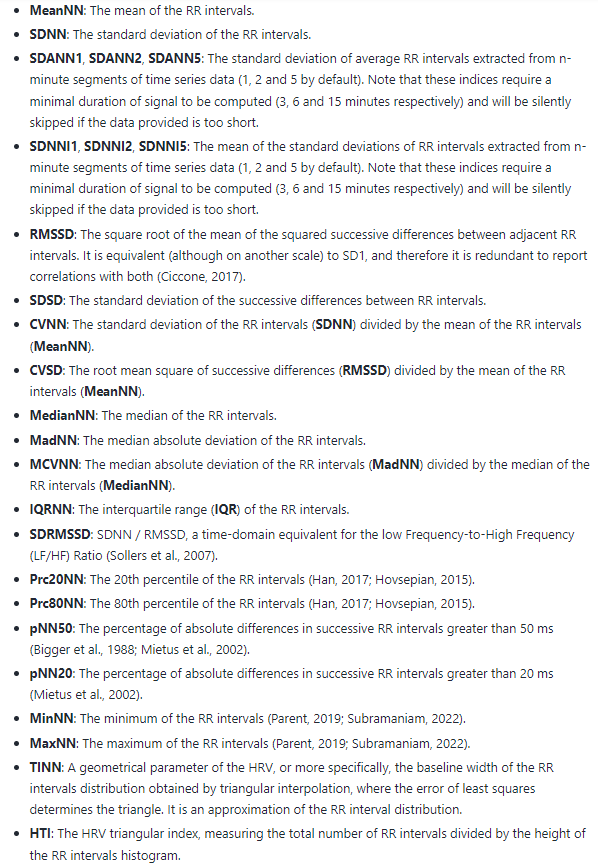

In [531]:
df_hrv_aft['HRV_RMSSD']

0    22.090722
Name: HRV_RMSSD, dtype: float64

In [533]:
# 提取 PS 特征，输入df_biopac_marker, PS, apex, epoch，
def get_features(df_biopac_marker, PS, apex, epoch):
    df_epoch_pre = df_biopac_marker.iloc[int((apex - epoch)*1000): int(apex*1000) + 1, :]
    df_epoch_aft = df_biopac_marker.iloc[int(apex*1000): int((apex + epoch)*1000) + 1, :]
    if PS == 'ECG':
        ecg_peaks_pre, info = nk.ecg_peaks(df_epoch_pre[PS].to_numpy(), sampling_rate=1000)
        df_hrv_pre = nk.hrv_time(ecg_peaks_pre, sampling_rate=1000, show=False)
        ecg_peaks_aft, info = nk.ecg_peaks(df_epoch_aft['ECG'].to_numpy(), sampling_rate=1000)
        df_hrv_aft = nk.hrv_time(ecg_peaks_aft, sampling_rate=1000, show=False)
        return df_hrv_pre, df_hrv_aft

In [535]:
biopac_file_path = 'biopac_data_HDF5/yangmi_7.28.h5'
apex = 41.1
marker = 146
PS = 'ECG'
apex = 5

df_biopac_data = pd.read_hdf(biopac_file_path, key='df')
df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]

df_hrv_pre, df_hrv_aft = get_features(df_biopac_marker, PS, apex, apex)
    
RMSSD_pre = df_hrv_pre['HRV_RMSSD']
RMSSD_aft = df_hrv_aft['HRV_RMSSD']

print('RMSSD_pre:', RMSSD_pre)
print('RMSSD_aft:', RMSSD_aft)

RMSSD_pre: 0    44.67102
Name: HRV_RMSSD, dtype: float64
RMSSD_aft: 0    22.992752
Name: HRV_RMSSD, dtype: float64


### PPG

In [645]:
avi_test = 'angry_3_116_yangmi_20230728.avi'
h5_name_test = avi_to_h5(avi_test)
apex_test = 5.22
epoch = 5
marker = avi_test.split('_')[2]

biopac_file_path = 'biopac_data_HDF5/' + h5_name_test
df_biopac_data = pd.read_hdf(biopac_file_path, key='df')
df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
df_biopac_marker = df_biopac_marker.reset_index(drop=True)

df_epoch_pre = df_biopac_marker.iloc[int((apex_test - epoch)*1000): int(apex_test*1000) + 1, :]
df_epoch_aft = df_biopac_marker.iloc[int(apex_test*1000): int((apex_test + epoch)*1000) + 1, :]

array = df_epoch_pre['PPG'].to_numpy()
has_nan = np.isnan(array)
any_nan = np.any(has_nan)
print("Array contains NaN:", any_nan)
print(df_epoch_pre['PPG'].isna().sum())  # 输出 NaN 的数量


Array contains NaN: False
0


In [640]:
ppg_epoch_pre, info_pre = nk.ppg_process(df_epoch_pre['PPG'].to_numpy(), sampling_rate=1000)
# 计算PPG_Rate的均值
# ppg_rate_mean_pre = ppg_epoch_pre['PPG_Rate'].mean()
# ppg_rate_mean_pre

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(


ValueError: cannot convert float NaN to integer

In [476]:
ppg_epoch_aft, info_aft = nk.ppg_process(df_epoch_aft['PPG'].to_numpy(), sampling_rate=1000)
# 计算PPG_Rate的均值
ppg_rate_mean_aft = ppg_epoch_aft['PPG_Rate'].mean()
ppg_rate_mean_aft

64.55048292509466

- 若时长增加，可以计算PPG和HRV特征

In [472]:
# Example 1: Simulate data for event-related analysis
ppg = nk.ppg_simulate(duration=15, sampling_rate=1000)

# Process data
ppg_signals, info = nk.ppg_process(ppg, sampling_rate=1000)

nk.ppg_intervalrelated(ppg_signals, sampling_rate=1000)

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\complexity\entropy_multiscale.py:349: RuntimeWarning: invalid value encountered in scalar divide
  mse = np.trapz(mse) / len(mse)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\complexity\optim_complexity_k.py:134: RuntimeWarning: divide by zero encountered in divide
  normalization = (n - 1) / (np.floor((n - k_subrange) / k).astype(int) * k)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\complexity\optim_complexity_k.py:135: RuntimeWarning: invalid value encountered in multiply
  sets = (np.nansum(np.abs(np.diff(sig_values)), axis=

,PPG_Rate_Mean,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,68.367376,881.133333,75.347639,NaN,NaN,NaN,NaN,NaN,NaN,77.954657,...,inf,3.906891,1.490595,NaN,NaN,NaN,0.791851,NaN,3.495631,1.562756


### RSP

In [550]:
rsp = df_epoch_pre['RSP'].to_numpy()
mean = round(np.mean(rsp), 5)
std_dev = round(np.std(rsp), 5)
median = round(np.median(rsp), 5)
max_value = round(np.max(rsp), 5)
min_value = round(np.min(rsp), 5)
skewness = round(stats.skew(rsp), 5)
kurtosis = round(stats.kurtosis(rsp), 5)

print("Mean:", mean)
print("Standard Deviation:", std_dev)
print("Median:", median)
print("Max:", max_value)
print("Min:", min_value)
print("Skewness:", skewness)
print("Kurtosis:", kurtosis)

Mean: 3.33243
Standard Deviation: 0.29721
Median: 3.23944
Max: 3.94012
Min: 2.9892
Skewness: 0.5566
Kurtosis: -1.03371


In [497]:
rsp_epoch_pre, info_pre = nk.rsp_process(df_epoch_pre['RSP'].to_numpy(), sampling_rate=1000)
# 提取呼吸特征
rsp_rate_mean_pre = rsp_epoch_pre['RSP_Rate'].mean()  # 平均呼吸速率
rsp_amplitude_mean_pre = rsp_epoch_pre['RSP_Amplitude'].mean()  # 平均呼吸振幅

IndexError: index -1 is out of bounds for axis 0 with size 0

- 若时长增加，可以计算RSP_Rate特征

In [489]:
# Simulate data
rsp = nk.rsp_simulate(duration=9, respiratory_rate=15, sampling_rate=100)
# Process signal
rsp_signals, info = nk.rsp_process(rsp, sampling_rate=100)
rsp_rate_mean_pre = rsp_signals['RSP_Rate'].mean()  # 平均呼吸速率
rsp_amplitude_mean_pre = rsp_signals['RSP_Amplitude'].mean()  # 平均呼吸振幅

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\rsp\rsp_symmetry.py:90: NeuroKitWarning: Not enough peaks and troughs (signal too short?) to compute symmetry, returning nan for symmetry.
  warn(


### EDA

In [502]:
def convert_2_df(info):
    # 统一长度：根据ECG_R_Peaks的长度为基准
    length = len(info['SCR_Onsets'])

    # 将标量或较短的列表扩展成与主要数据长度一致的形式
    def expand_data(key, value):
        if isinstance(value, list) or isinstance(value, np.ndarray):
            if len(value) < length:
                return list(value) + [None] * (length - len(value))  # 补齐长度
            else:
                return value
        else:
            return [value] * length  # 将标量扩展成重复值

    # 构建包含所有键值的DataFrame
    df = pd.DataFrame({key: expand_data(key, value) for key, value in info.items()})

    # 输出结果
    return df

In [515]:
eda_epoch_pre, info_pre = nk.eda_process(df_epoch_pre['EDA'].to_numpy(), sampling_rate=1000)
eda_epoch_aft, info_aft = nk.eda_process(df_epoch_aft['EDA'].to_numpy(), sampling_rate=1000)
info_pre

{'SCR_Onsets': array([ 298,  687, 1076, 1454, 1875, 2244, 2603, 2953, 3271, 3656, 3965,
        4300], dtype=int64),
 'SCR_Peaks': array([ 460,  860, 1238, 1662, 2042, 2413, 2767, 3081, 3474, 3796, 4131,
        4469], dtype=int64),
 'SCR_Height': array([ 0.02137769,  0.01694626,  0.01307023,  0.01158152,  0.00819305,
         0.00553605,  0.00367154,  0.00033055,  0.00119718, -0.00125092,
        -0.0014357 , -0.00170036]),
 'SCR_Amplitude': array([0.00349545, 0.00413765, 0.00368534, 0.00620742, 0.00411983,
        0.00426204, 0.00396031, 0.00197684, 0.00643424, 0.00235041,
        0.00369852, 0.00371567]),
 'SCR_RiseTime': array([0.162, 0.173, 0.162, 0.208, 0.167, 0.169, 0.164, 0.128, 0.203,
        0.14 , 0.166, 0.169]),
 'SCR_Recovery': array([ 530.,  937., 1310., 1758., 2118., 2492., 2844., 3136., 3584.,
        3860., 4212., 4562.]),
 'SCR_RecoveryTime': array([0.07 , 0.077, 0.072, 0.096, 0.076, 0.079, 0.077, 0.055, 0.11 ,
        0.064, 0.081, 0.093]),
 'sampling_rate': 1000}

In [504]:
df_features_pre = convert_2_df(info_pre)
df_features_pre

,SCR_Onsets,SCR_Peaks,SCR_Height,SCR_Amplitude,SCR_RiseTime,SCR_Recovery,SCR_RecoveryTime,sampling_rate
0,298,460,0.021378,0.003495,0.162,530.0,0.070,1000
1,687,860,0.016946,0.004138,0.173,937.0,0.077,1000
2,1076,1238,0.013070,0.003685,0.162,1310.0,0.072,1000
3,1454,1662,0.011582,0.006207,0.208,1758.0,0.096,1000
4,1875,2042,0.008193,0.004120,0.167,2118.0,0.076,1000
5,2244,2413,0.005536,0.004262,0.169,2492.0,0.079,1000
6,2603,2767,0.003672,0.003960,0.164,2844.0,0.077,1000
7,2953,3081,0.000331,0.001977,0.128,3136.0,0.055,1000
8,3271,3474,0.001197,0.006434,0.203,3584.0,0.110,1000
9,3656,3796,-0.001251,0.002350,0.140,3860.0,0.064,1000


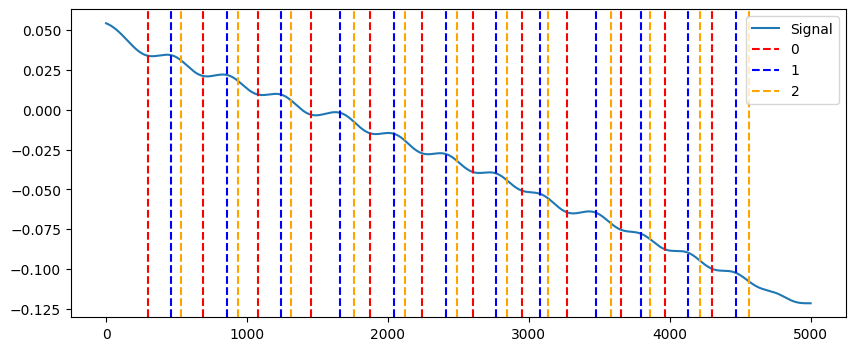

In [505]:
signals, info = nk.eda_process(df_epoch_pre['EDA'].to_numpy(), sampling_rate=1000)

# 提取干净的 EDA 和皮肤传导反应 (SCR) 特征
cleaned = signals["EDA_Clean"]
features = [info["SCR_Onsets"], info["SCR_Peaks"], info["SCR_Recovery"]]

# Visualize SCR features in cleaned EDA signal
plot = nk.events_plot(features, cleaned, color=['red', 'blue', 'orange'])

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_plot.py:50: NeuroKitWarning: 'info' dict not provided. Some information might be missing. Sampling rate will be set to 1000 Hz.
  warn(


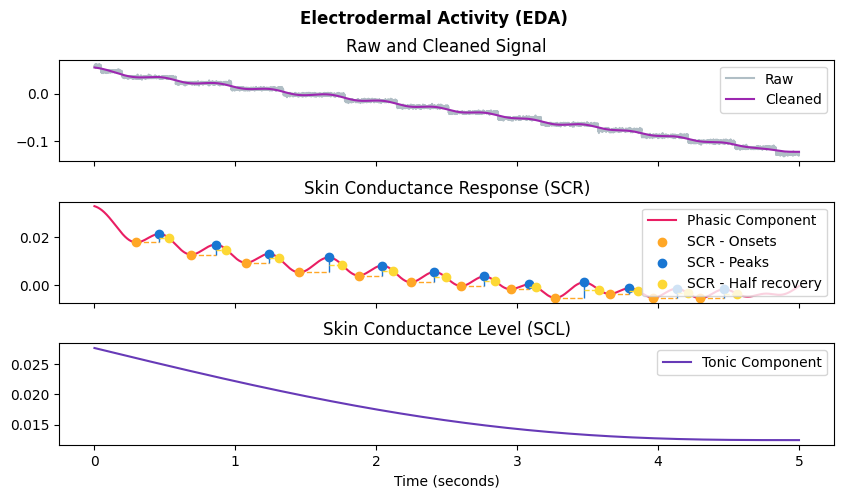

In [507]:
eda_epoch_pre, info_pre = nk.eda_process(df_epoch_pre['EDA'].to_numpy(), sampling_rate=1000)
# 绘制EDA信号及其成分
nk.eda_plot(eda_epoch_pre)
plt.show()

In [519]:
eda_epoch_pre, info_pre = nk.eda_process(df_epoch_pre['EDA'].to_numpy(), sampling_rate=1000)
eda_epoch_aft, info_aft = nk.eda_process(df_epoch_aft['EDA'].to_numpy(), sampling_rate=1000)

# 提取SCL和SCR特征
scl_pre = eda_epoch_pre["EDA_Tonic"]  # 皮肤电水平
scr_pre = eda_epoch_pre["EDA_Phasic"]  # 皮肤电反应
scl_aft = eda_epoch_aft["EDA_Tonic"]  # 皮肤电水平
scr_aft = eda_epoch_aft["EDA_Phasic"]  # 皮肤电反应

# 计算统计特征
eda_mean_pre = np.mean(scl_pre)  # 平均值
eda_std_pre = np.std(scl_pre)  # 标准差
eda_max_pre = np.max(scl_pre)  # 最大值
eda_min_pre = np.min(scl_pre)  # 最小值
eda_range_pre = eda_max_pre - eda_min_pre  # 幅度范围

eda_mean_aft = np.mean(scl_aft)  # 平均值
eda_std_aft = np.std(scl_aft)  # 标准差
eda_max_aft = np.max(scl_aft)  # 最大值
eda_min_aft = np.min(scl_aft)  # 最小值
eda_range_aft = eda_max_aft - eda_min_aft  # 幅度范围

# 检测皮肤电反应的峰值
peaks_info_pre = nk.eda_findpeaks(scr_pre)
peaks_pre = peaks_info_pre["SCR_Peaks"]  # 获取峰值的索引
num_peaks_pre = len(peaks_pre)  # 皮肤电反应次数
peak_amplitudes_pre = scr_pre[peaks_pre]  # 反应峰值的振幅
mean_amplitude_pre = np.mean(peak_amplitudes_pre) if num_peaks_pre > 0 else 0  # 平均振幅

peaks_info_aft = nk.eda_findpeaks(scr_aft)
peaks_aft = peaks_info_aft["SCR_Peaks"]  # 获取峰值的索引
num_peaks_aft = len(peaks_aft)  # 皮肤电反应次数
peak_amplitudes_aft = scr_aft[peaks_aft]  # 反应峰值的振幅
mean_amplitude_aft = np.mean(peak_amplitudes_aft) if num_peaks_aft > 0 else 0  # 平均振幅

# 输出统计特征，保留5位小数
print(f"Mean_pre: {eda_mean_pre:.5f}")
print(f"Standard Deviation_pre: {eda_std_pre:.5f}")
print(f"Max_pre: {eda_max_pre:.5f}")
print(f"Min_pre: {eda_min_pre:.5f}")
print(f"Range_pre: {eda_range_pre:.5f}")
print(f"Number of Peaks_pre: {num_peaks_pre}")
print(f"Mean Amplitude of Peaks_pre: {mean_amplitude_pre:.5f}")
print('___________________________')
print(f"Mean_aft: {eda_mean_aft:.5f}")
print(f"Standard Deviation_aft: {eda_std_aft:.5f}")
print(f"Max_aft: {eda_max_aft:.5f}")
print(f"Min_aft: {eda_min_aft:.5f}")
print(f"Range_aft: {eda_range_aft:.5f}")
print(f"Number of Peaks_aft: {num_peaks_aft}")
print(f"Mean Amplitude of Peaks_aft: {mean_amplitude_aft:.5f}")

Mean_pre: 0.01725
Standard Deviation_pre: 0.00467
Max_pre: 0.02763
Min_pre: 0.01246
Range_pre: 0.01517
Number of Peaks_pre: 12
Mean Amplitude of Peaks_pre: 0.00646
___________________________
Mean_aft: -0.16456
Standard Deviation_aft: 0.00523
Max_aft: -0.15303
Min_aft: -0.16997
Range_aft: 0.01694
Number of Peaks_aft: 11
Mean Amplitude of Peaks_aft: 0.00824


Mean (平均值)   
Standard Deviation (标准差)   
Max (最大值)   
Min (最小值)   
Range (幅度范围)   
Number of Peaks (反应次数)   
Mean Amplitude of Peaks (平均反应振幅)

### SKT

In [525]:
skt_signal_pre = df_epoch_pre['SKT A'].to_numpy()
skt_signal_aft = df_epoch_aft['SKT A'].to_numpy()

In [528]:
# 计算统计特征
skt_mean_pre = round(np.mean(skt_signal_pre), 5)  # 平均值
skt_std_pre = round(np.std(skt_signal_pre), 5)  # 标准差
skt_max_pre = round(np.max(skt_signal_pre), 5)  # 最大值
skt_min_pre = round(np.min(skt_signal_pre), 5)  # 最小值
skt_range_pre = round(skt_max_pre - skt_min_pre, 5)  # 幅度范围

skt_mean_aft = round(np.mean(skt_signal_aft), 5)  # 平均值
skt_std_aft = round(np.std(skt_signal_aft), 5)  # 标准差
skt_max_aft = round(np.max(skt_signal_aft), 5)  # 最大值
skt_min_aft = round(np.min(skt_signal_aft), 5)  # 最小值
skt_range_aft = round(skt_max_aft - skt_min_aft, 5)  # 幅度范围

# 计算信号的斜率
time_pre = np.arange(len(skt_signal_pre))  # 时间轴（以秒为单位）
slope_pre = round(np.polyfit(time_pre, skt_signal_pre, 1)[0], 5)  # 线性拟合，计算斜率

time_aft = np.arange(len(skt_signal_aft))  # 时间轴（以秒为单位）
slope_aft = round(np.polyfit(time_aft, skt_signal_aft, 1)[0], 5)  # 线性拟合，计算斜率

# 输出统计特征
print(f"Mean_pre: {skt_mean_pre}")
print(f"Standard Deviation_pre: {skt_std_pre}")
print(f"Max_pre: {skt_max_pre}")
print(f"Min_pre: {skt_min_pre}")
print(f"Range_pre: {skt_range_pre}")
print(f"Slope_pre: {slope_pre}")
print('-----------------------------')
print(f"Mean_aft: {skt_mean_aft}")
print(f"Standard Deviation_aft: {skt_std_aft}")
print(f"Max_aft: {skt_max_aft}")
print(f"Min_aft: {skt_min_aft}")
print(f"Range_aft: {skt_range_aft}")
print(f"Slope_aft: {slope_aft}")

Mean_pre: 31.99997
Standard Deviation_pre: 0.00107
Max_pre: 32.00488
Min_pre: 31.99695
Range_pre: 0.00793
Slope_pre: 0.0
-----------------------------
Mean_aft: 31.9997
Standard Deviation_aft: 0.00115
Max_aft: 32.00366
Min_aft: 31.99573
Range_aft: 0.00793
Slope_aft: 0.0


## 遍历所有微表情

In [711]:
def get_ecg_features(df_epoch, pre_or_aft):
    # 提取ECG统计特征
    ecg = df_epoch['ECG'].to_numpy()
    ecg_mean = round(np.mean(ecg), 5)  # 平均值
    ecg_std = round(np.std(ecg), 5)  # 标准差
    ecg_max = round(np.max(ecg), 5)  # 最大值
    ecg_min = round(np.min(ecg), 5)  # 最小值
    ecg_range = round(ecg_max - ecg_min, 5)  # 幅度范围
    
    try:
        # 提取心率和RR间隔信息
        ecg_epoch, info = nk.ecg_process(ecg, sampling_rate=1000)
        heart_rate = ecg_epoch['ECG_Rate']  # 获取心率（bpm）
        rr_intervals = np.diff(ecg_epoch['ECG_R_Peaks']) / 1000  # 计算RR间隔（秒）

        # 计算RR间隔的统计特征
        rr_mean = round(np.mean(rr_intervals), 5)  # RR间隔均值
        rr_std = round(np.std(rr_intervals), 5)  # RR间隔标准差
        heart_rate_mean = round(np.mean(heart_rate), 5)  # 心率平均值
    except:
        rr_mean, rr_std, heart_rate_mean = None, None, None
    
    ecg_features = (ecg_mean, ecg_std, ecg_max, ecg_min, ecg_range, rr_mean, rr_std, heart_rate_mean)
    
    ecg_features_names = ['ecg_mean', 'ecg_std', 'ecg_max', 'ecg_min', 'ecg_range', 'rr_mean', 'rr_std', 'heart_rate_mean']
    
    if pre_or_aft =='pre':
        ecg_features_names = [item + '_pre' for item in ecg_features_names]
    if pre_or_aft =='aft':
        ecg_features_names = [item + '_aft' for item in ecg_features_names]
#     print('ecg_features:', ecg_features)
    # 返回统计特征
    return ecg_features, ecg_features_names

In [712]:
def get_hrv_features(df_epoch, pre_or_aft):
    ecg = df_epoch['ECG'].to_numpy()
    try:
        ecg_peaks, info = nk.ecg_peaks(ecg, sampling_rate=1000)
        hrv_features = nk.hrv_time(ecg_peaks, sampling_rate=1000, show=False)
        hrv_features_names = hrv_features.columns.tolist()
        hrv_features = tuple(hrv_features.iloc[0].apply(lambda x: np.nan if x is None else x))
        
    except:
        hrv_features = [None for _ in range(25)]
        hrv_features_names = ['HRV_MeanNN', 'HRV_SDNN', 'HRV_SDANN1', 'HRV_SDNNI1', 'HRV_SDANN2', 'HRV_SDNNI2', 'HRV_SDANN5', 
                              'HRV_SDNNI5',  'HRV_RMSSD', 'HRV_SDSD', 'HRV_CVNN', 'HRV_CVSD', 'HRV_MedianNN', 'HRV_MadNN', 
                              'HRV_MCVNN', 'HRV_IQRNN', 'HRV_SDRMSSD', 'HRV_Prc20NN', 'HRV_Prc80NN', 'HRV_pNN50', 'HRV_pNN20', 
                              'HRV_MinNN', 'HRV_MaxNN', 'HRV_HTI', 'HRV_TINN']
    
    if pre_or_aft =='pre':
        hrv_features_names = [item + '_pre' for item in hrv_features_names]
    if pre_or_aft =='aft':
        hrv_features_names = [item + '_aft' for item in hrv_features_names]
#     print('hrv_features_names:', hrv_features_names)
    return hrv_features, hrv_features_names

In [733]:
def get_ppg_features(df_epoch, pre_or_aft):
    ppg = df_epoch['PPG'].to_numpy()
    try:
        ppg_epoch, info = nk.ppg_process(ppg, sampling_rate=1000)
        # 计算PPG_Rate的均值
        ppg_rate_mean = ppg_epoch['PPG_Rate'].mean()
    except:
        ppg_rate_mean = None
        
    ppg_features = (ppg_rate_mean,)
    ppg_features_names = ['ppg_rate_mean']
    
    if pre_or_aft =='pre':
        ppg_features_names = [item + '_pre' for item in ppg_features_names]
    if pre_or_aft =='aft':
        ppg_features_names = [item + '_aft' for item in ppg_features_names]
        
    return ppg_features, ppg_features_names

In [714]:
def get_rsp_features(df_epoch, pre_or_aft):
    rsp = df_epoch['RSP'].to_numpy()
    rsp_mean = round(np.mean(rsp), 5)
    rsp_std_dev = round(np.std(rsp), 5)
    rsp_median = round(np.median(rsp), 5)
    rsp_max_value = round(np.max(rsp), 5)
    rsp_min_value = round(np.min(rsp), 5)
    rsp_skewness = round(stats.skew(rsp), 5)
    rsp_kurtosis = round(stats.kurtosis(rsp), 5)
    
    rsp_features = (rsp_mean, rsp_std_dev, rsp_median, rsp_max_value, rsp_min_value, rsp_skewness, rsp_kurtosis)
    rsp_features_names = ['rsp_mean', 'rsp_std_dev', 'rsp_median', 'rsp_max_value', 'rsp_min_value', 'rsp_skewness', 'rsp_kurtosis']
    
    if pre_or_aft =='pre':
        rsp_features_names = [item + '_pre' for item in rsp_features_names]
    if pre_or_aft =='aft':
        rsp_features_names = [item + '_aft' for item in rsp_features_names] 
    
    return rsp_features, rsp_features_names    

In [715]:
def get_eda_features(df_epoch, pre_or_aft):
    eda = df_epoch['EDA'].to_numpy()
    try:
        eda_epoch, info = nk.eda_process(eda, sampling_rate=1000)

        # 提取SCL和SCR特征
        scl = eda_epoch["EDA_Tonic"]  # 皮肤电水平
        scr = eda_epoch["EDA_Phasic"]  # 皮肤电反应

        # 计算统计特征
        eda_mean = round(np.mean(scl), 5)  # 平均值
        eda_std = round(np.std(scl), 5)  # 标准差
        eda_max = round(np.max(scl), 5)  # 最大值
        eda_min = round(np.min(scl), 5)  # 最小值
        eda_range = round(eda_max - eda_min, 5)  # 幅度范围
    except:
        eda_mean, eda_std, eda_max, eda_min, eda_range = None, None, None, None, None
        
    try:
        # 检测皮肤电反应的峰值
        peaks_info = nk.eda_findpeaks(scr)
        peaks = peaks_info["SCR_Peaks"]  # 获取峰值的索引
        eda_num_peaks = len(peaks)  # 皮肤电反应次数
        peak_amplitudes = scr[peaks]  # 反应峰值的振幅
        eda_mean_amplitude = round(np.mean(peak_amplitudes), 5) if num_peaks > 0 else 0  # 平均振幅
    except:
        eda_num_peaks, eda_mean_amplitude = None, None
        
    eda_features = (eda_mean, eda_std, eda_max, eda_min, eda_range, eda_num_peaks, eda_mean_amplitude)
    eda_features_names = ['eda_mean', 'eda_std', 'eda_max', 'eda_min', 'eda_range', 'eda_num_peaks', 'eda_mean_amplitude']
    
    if pre_or_aft =='pre':
        eda_features_names = [item + '_pre' for item in eda_features_names]
    if pre_or_aft =='aft':
        eda_features_names = [item + '_aft' for item in eda_features_names] 
    
    return eda_features, eda_features_names 

In [716]:
def get_skt_features(df_epoch, pre_or_aft):
    skt_signal = df_epoch['SKT A'].to_numpy()
    # 计算统计特征
    skt_mean = round(np.mean(skt_signal), 5)  # 平均值
    skt_std = round(np.std(skt_signal), 5)  # 标准差
    skt_max = round(np.max(skt_signal), 5)  # 最大值
    skt_min = round(np.min(skt_signal), 5)  # 最小值
    skt_range = round(skt_max - skt_min, 5)  # 幅度范围

    # 计算信号的斜率
    time = np.arange(len(skt_signal))  # 时间轴（以秒为单位）
    skt_slope = round(np.polyfit(time, skt_signal, 1)[0], 5)  # 线性拟合，计算斜率
    
    skt_features = (skt_mean, skt_std, skt_max, skt_min, skt_range, skt_slope)
    skt_features_names = ['skt_mean', 'skt_std', 'skt_max', 'skt_min', 'skt_range', 'skt_slope']
    
    if pre_or_aft =='pre':
        skt_features_names = [item + '_pre' for item in skt_features_names]
    if pre_or_aft =='aft':
        skt_features_names = [item + '_aft' for item in skt_features_names] 
    
    return skt_features, skt_features_names

In [736]:
def get_features(epoch):
    df_features = pd.DataFrame() # 初始化一个空 DataFrame 用于存储结果
    # 遍历目录下的h5文件
    for filename in os.listdir('biopac_data_HDF5'):
        if filename.endswith('.h5'):
            # 加载该h5文件（1h），包含marker信息
            df_biopac_data = pd.read_hdf(os.path.join('biopac_data_HDF5', filename), key='df')
            # 获取h5对应的视频（1min）
            avi_names = h5_to_avis(filename, micro_dict)
            if avi_names: # 如果列表不为空
                # 获取.avi中的微表情
                for avi in avi_names:
                    marker = avi.split('_')[2]
                    me_apexs = get_apexs(avi)
                    # 根据marker找到对应的数据
                    df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
                    df_biopac_marker = df_biopac_marker.reset_index(drop=True)
                    # 获取行数
                    row_count = len(df_biopac_marker)

                    # 遍历每个微表情
                    for apex in me_apexs:
                        me = avi.split('.avi')[0] + '_' + str(apex/1000)

                        if float(apex/1000) > epoch and int((float(apex/1000) + epoch)*1000) <= row_count:
                            df_epoch_pre = df_biopac_marker.iloc[int((float(apex/1000) - epoch)*1000): apex + 1, :]
                            df_epoch_aft = df_biopac_marker.iloc[apex: int((float(apex/1000) + epoch)*1000) + 1, :]

                            # ECG
                            ecg_features_pre, ecg_features_names_pre = get_ecg_features(df_epoch_pre, 'pre')
                            ecg_features_aft, ecg_features_names_aft = get_ecg_features(df_epoch_aft, 'aft')
                            # HRV
                            hrv_features_pre, hrv_features_names_pre = get_hrv_features(df_epoch_pre, 'pre')
                            hrv_features_aft, hrv_features_names_aft = get_hrv_features(df_epoch_aft, 'aft')
                            # PPG
                            ppg_features_pre, ppg_features_names_pre = get_ppg_features(df_epoch_pre, 'pre')
                            ppg_features_aft, ppg_features_names_aft = get_ppg_features(df_epoch_aft, 'aft')
                            # RSP
                            rsp_features_pre, rsp_features_names_pre = get_rsp_features(df_epoch_pre, 'pre')
                            rsp_features_aft, rsp_features_names_aft = get_rsp_features(df_epoch_aft, 'aft')                    
                            # EDA
                            eda_features_pre, eda_features_names_pre = get_eda_features(df_epoch_pre, 'pre')
                            eda_features_aft, eda_features_names_aft = get_eda_features(df_epoch_aft, 'aft')                         
                            # SKT
                            skt_features_pre, skt_features_names_pre = get_skt_features(df_epoch_pre, 'pre')
                            skt_features_aft, skt_features_names_aft = get_skt_features(df_epoch_aft, 'aft')                       

                            features = (
                                (me,) + 
                                ecg_features_pre + ecg_features_aft + hrv_features_pre + hrv_features_aft +
                                ppg_features_pre + ppg_features_aft + rsp_features_pre + rsp_features_aft +
                                eda_features_pre + eda_features_aft + skt_features_pre + skt_features_aft
                            )

                            features_names = (
                                ['ME'] + 
                                ecg_features_names_pre + ecg_features_names_aft + hrv_features_names_pre + hrv_features_names_aft +
                                ppg_features_names_pre + ppg_features_names_aft + rsp_features_names_pre + rsp_features_names_aft +
                                eda_features_names_pre + eda_features_names_aft + skt_features_names_pre + skt_features_names_aft
                            )

                            # 将ecg_features转换为一个DataFrame，然后使用pd.concat添加到df_features中
                            new_row = pd.DataFrame([features], columns=features_names)
                            df_features = pd.concat([df_features, new_row], ignore_index=True)
                            
    xlsx_name = 'features_' + str(epoch) + '.xlsx'
    df_features.to_excel(xlsx_name, index=False)  # index=False 可以省略行索引 
    print("DataFrame 已成功写入Excel文件")
    
    return df_features

In [755]:
epoch = 15
df_features = get_features(epoch)
print('df_features.shape:', df_features.shape) # 109列， 108/2=54种特征
display(df_features)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets

DataFrame 已成功写入Excel文件
df_features.shape: (67, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,fear_2_104_fengdengfang_20230802_39.15,-0.00801,0.13546,0.55847,-0.44281,1.00128,0.0,0.00005,83.92177,-0.00770,...,32.00427,31.99756,0.00671,-0.0,32.00029,0.00117,32.00488,31.99573,0.00915,0.0
1,fear_6_139_fengdengfang_20230802_31.54,-0.00801,0.12504,0.44495,-0.40115,0.84610,0.0,0.00005,73.46527,-0.00954,...,32.00366,31.99634,0.00732,-0.0,32.00005,0.00075,32.00305,31.99695,0.00610,-0.0
2,happy_2_103_fengdengfang_20230802_18.68,-0.00937,0.13452,0.51331,-0.41748,0.93079,0.0,0.00005,83.36253,-0.00729,...,32.00366,31.99695,0.00671,-0.0,32.00035,0.00117,32.00488,31.99512,0.00976,0.0
3,angry_3_116_liyan_20230802_41.57,-0.00863,0.12837,0.31998,-0.50888,0.82886,0.0,0.00005,71.47193,-0.00734,...,32.00427,31.99634,0.00793,0.0,31.99984,0.00095,32.00305,31.99512,0.00793,0.0
4,fear_2_104_liyan_20230802_40.06,-0.00796,0.12991,0.33066,-0.49408,0.82474,0.0,0.00005,75.81283,-0.00806,...,32.00305,31.99512,0.00793,-0.0,31.99984,0.00086,32.00366,31.99573,0.00793,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,sad_4_118_zhaoshaohua_20230801_24.13,-0.00921,0.23930,0.95657,-0.39917,1.35574,0.0,0.00005,86.24016,-0.00890,...,32.00244,31.99634,0.00610,-0.0,32.00000,0.00099,32.00366,31.99634,0.00732,0.0
63,sad_6_136_zhaoshaohua_20230801_31.13,-0.00893,0.22914,0.90057,-0.47272,1.37329,0.0,0.00005,87.67598,-0.00797,...,32.00427,31.99634,0.00793,0.0,32.00009,0.00096,32.00427,31.99634,0.00793,-0.0
64,fear_1_134_zhengwansheng_20230718_20.72,-0.00722,0.22064,0.89783,-0.98083,1.87866,0.0,0.00004,64.56833,-0.00776,...,30.15918,30.12500,0.03418,0.0,30.16182,0.00913,30.17871,30.14453,0.03418,0.0
65,fear_1_134_zhengwansheng_20230718_26.51,-0.00747,0.22574,0.90195,-0.98083,1.88278,0.0,0.00005,65.63113,-0.01090,...,30.15979,30.15369,0.00610,-0.0,30.15799,0.01208,30.17871,30.14392,0.03479,-0.0


## 配对t检验

In [790]:
def get_t_test(xlsx_file):
    # 读取 Excel 文件
    df_features = pd.read_excel(xlsx_file)

    # 获取表头（列名）
    header_list = df_features.columns.tolist()
    header_list.remove('ME')

    # 初始化特征对的空列表
    feature_pairs = []

    # 遍历所有的 _pre 特征
    for feature in header_list:
        if feature.endswith('_pre'):
            aft_feature = feature.replace('_pre', '_aft')  # 找到相应的 _aft 特征
            feature_pairs.append((feature, aft_feature))  # 添加配对特征

    # 创建一个空的 DataFrame 来存储结果
    results_df = pd.DataFrame(columns=['feature_name', 'pre', 'aft', 't_stat', 'p_value'])

    # 遍历配对特征并进行 t 检验
    for pair in feature_pairs:
        # 提取特征名
        feature_name = pair[0].split('_pre')[0]
        # 计算 pre 和 aft 的均值和标准差
        mean_std_pre = f"{df_features[pair[0]].mean():.4f} ({df_features[pair[0]].std():.4f})"
        mean_std_aft = f"{df_features[pair[1]].mean():.4f} ({df_features[pair[1]].std():.4f})"

        # 执行配对样本 t 检验
        t_stat, p_value = stats.ttest_rel(df_features[pair[0]], df_features[pair[1]])

        # 将结果作为 DataFrame 插入
        result = pd.DataFrame({
            'feature_name': [feature_name],
            'pre': [mean_std_pre],
            'aft': [mean_std_aft],
            't_stat': [t_stat],
            'p_value': [p_value]
        })
        results_df = pd.concat([results_df, result], ignore_index=True)

    # 定义一个用于标记 p 值的函数，如果 p < 0.05 则返回带颜色的值
    def highlight_p_value(val):
        color = 'red' if val < 0.05 else 'black'
        return f'color: {color}'

    # 使用 style.applymap 对 'p_value' 列进行条件格式化
    styled_results_df = results_df.style.applymap(highlight_p_value, subset=['p_value'])

    return styled_results_df

In [794]:
epoch = 15
xlsx_file = 'features_' + str(epoch) + '.xlsx'
results_df = get_t_test(xlsx_file)
display(results_df)
results_df.to_excel('paired-t-test-' + str(epoch) + '.xlsx', index=False)

,feature_name,pre,aft,t_stat,p_value
0,ecg_mean,-0.0076 (0.0032),-0.0076 (0.0024),-0.043832,0.965170
1,ecg_std,0.1581 (0.0793),0.1577 (0.0794),0.447255,0.656155
2,ecg_max,0.6805 (0.3031),0.6801 (0.3025),0.200721,0.841534
3,ecg_min,-0.4249 (0.2103),-0.4008 (0.1876),-2.151543,0.035097
4,ecg_range,1.1054 (0.4560),1.0809 (0.4319),2.196804,0.031551
5,rr_mean,0.0000 (0.0000),0.0000 (0.0000),nan,nan
6,rr_std,0.0001 (0.0000),0.0001 (0.0000),1.349847,0.181677
7,heart_rate_mean,76.5496 (9.3847),76.1004 (8.7377),1.117647,0.267770
8,HRV_MeanNN,794.5637 (95.0617),798.7071 (89.8803),-0.945633,0.347785
9,HRV_SDNN,44.0979 (24.3732),35.8677 (16.1870),2.626445,0.010715


t-statistic: -0.04383242467210611
p-value: 0.9651703259478595


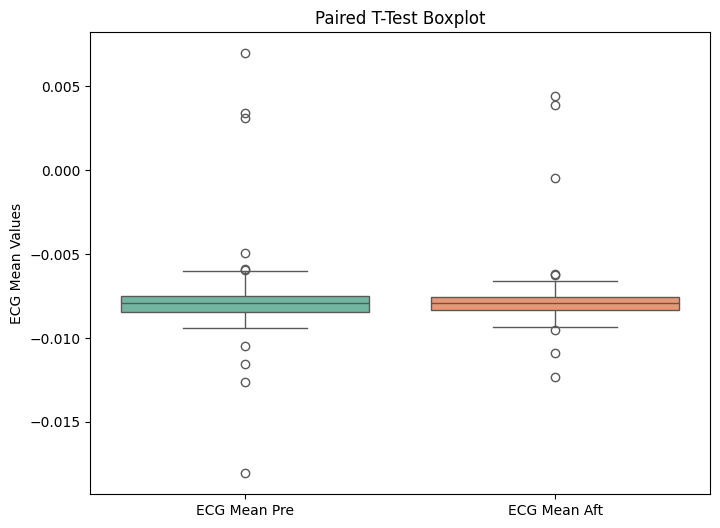

In [754]:




# 提取两列数据
ecg_mean_pre = df['ecg_mean_pre']
ecg_mean_aft = df['ecg_mean_aft']

# 执行配对样本 t 检验
t_stat, p_value = stats.ttest_rel(ecg_mean_pre, ecg_mean_aft)

# 输出结果
print(f"t-statistic: {t_stat}")
print(f"p-value: {p_value}")

# 绘制箱线图
plt.figure(figsize=(8, 6))
sns.boxplot(data=[ecg_mean_pre, ecg_mean_aft], palette="Set2")

# 添加 x 轴和 y 轴标签
plt.xticks([0, 1], ['ECG Mean Pre', 'ECG Mean Aft'])
plt.ylabel('ECG Mean Values')
plt.title('Paired T-Test Boxplot')

# 显示图形
plt.show()

填充空值

In [45]:
 # 找到 NaN 值的位置
ecg_fea=ecg_fea.astype(float)
nan_indices = np.where(ecg_fea.isna()| np.isinf(ecg_fea))
# 生成随机值
random_values = np.random.rand(len(nan_indices[0]))
# 将随机值赋给 NaN 值的位置
ecg_fea.values[nan_indices] = random_values
X_ECG = np.array(ecg_fea)

print('X_ECG:', X_ECG)

X_ECG: [[ 9.30372541e+01  6.45071429e+02  4.87624648e+01  6.14955386e-01
   3.44600389e-01  9.89499487e-01  2.45210417e-01  9.39147239e-01
   6.14978699e-01  2.50681000e+01  2.52158300e+01  7.55923493e-02
   3.88609678e-02  6.37000000e+02  4.81845000e+01  7.56428571e-02
   7.27500000e+01  1.94519986e+00  6.02000000e+02  6.97000000e+02
   5.95238095e+00  4.52380952e+01  5.66000000e+02  7.49000000e+02
   1.05000000e+01  7.81250000e+01  7.73961675e-01  1.05898166e-01
   5.19675604e-02  1.49554762e-02  2.45190771e-04  6.71682273e-02
   3.47481817e+00  7.73692599e-01  2.22657003e-01 -4.20267775e+00
   1.78302844e+01  6.69690072e+01  2.66246808e-01  3.75130179e+03
   3.75591357e+00  4.28115211e+00  1.00611921e+03  2.97619048e-01
   2.96296296e-01  3.75000000e-01  0.00000000e+00  5.12077295e+01
   5.12225026e+01  5.11888544e+01  5.55555556e+01  5.79815177e-01
   4.20184823e-01  1.35794860e+01  1.15600236e+01  4.43437912e-01
   5.56562088e-01  4.45954213e+01  4.99609480e+01  4.52468518e-01
   

In [19]:
df_biopac_oneset_offset

,PPG,RSP,EMG A,SKT A,EDA,ECG,EMG B,SKT B,ECG rate,Marker
466542,0.034180,-10.000000,-0.004883,32.000610,18.467713,-0.089417,0.005798,32.000000,80.321285,102
466543,0.030518,-10.000000,-0.005341,32.001221,18.467713,-0.106201,0.005646,31.999390,80.321285,102
466544,0.029297,-10.000000,-0.005188,32.000000,18.467713,-0.124664,0.005798,31.999390,80.321285,102
466545,0.025330,-10.000000,-0.004883,32.000610,18.467713,-0.144348,0.005493,31.998779,80.321285,102
466546,0.022583,-10.000000,-0.004883,31.999390,18.467713,-0.165253,0.005646,31.996948,80.321285,102
...,...,...,...,...,...,...,...,...,...,...
467248,-0.669556,-9.882812,-0.004883,32.000000,18.457032,0.007019,0.005951,31.999390,85.106383,102
467249,-0.661316,-9.881592,-0.004578,32.000610,18.452454,0.005493,0.006104,32.003052,85.106383,102
467250,-0.654907,-9.882202,-0.004883,32.000000,18.455506,0.004578,0.005646,32.000000,85.106383,102
467251,-0.649109,-9.882507,-0.004578,32.000000,18.457032,0.004272,0.005493,31.999390,85.106383,102


# 宏表情与生理数据

## 读取excel标注文件，得到微表情字典

In [12]:
# Load the xlsx file
file_path = 'coding_file_mc.xlsx'  # Replace with your actual file path
df = pd.read_excel(file_path)
df.head(3)

,Subject,Filename,Marker,OnsetTime,ApexTime,OffsetTime,OnsetFrame,ApexFrame,OffsetFrame,Action Units,Estimated Emotion,Macro/Micro,Date,dif
0,fengdengfang,angry_1_146_fengdengfang_20230802.avi,146,24.33,24.59,25.33,16-00-31-433-685,16-00-31-686-723,16-00-32-428-831,AU1,angry,Macro,2024年06月30日-14时31分,39
1,wangxiaomin,angry_1_146_wangxiaomin_20230718.avi,146,12.09,12.68,12.68,11-05-27-805-813,11-05-28-399-902,11-05-28-399-902,AU4,angry,Macro,2024年05月15日-19时52分,90
2,wangxiaomin,angry_1_146_wangxiaomin_20230718.avi,146,3.32,3.60,3.60,11-05-19-038-498,11-05-19-318-540,11-05-19-318-540,AU4,angry,Macro,2024年05月15日-20时55分,43


In [13]:
# 初始化字典，文件名为键，微表情关键帧的时刻构成的列表为值，(起始帧，峰值帧，结束帧)
macro_dict = {}

# 遍历每一行
for index, row in df.iterrows():
    if row['Macro/Micro'] == 'Macro':
        filename = row['Filename']
        onset_time = round(row['OnsetTime'], 3)
        onset_time = f"{onset_time:.3f}"  # 保留小数点后三位，补零

        apex_time = round(row['ApexTime'], 3)
        apex_time = f"{apex_time:.3f}"

        offset_time = round(row['OffsetTime'], 3)
        offset_time = f"{offset_time:.3f}"

        if filename in macro_dict:
            macro_dict[filename].append((onset_time, apex_time, offset_time))
        else:
            macro_dict[filename] = [(onset_time, apex_time, offset_time)]

# 查看字典的长度
length = len(macro_dict)
print(f"字典的长度是: {length}")

# 打印生成的字典
print('macro_dict:', macro_dict)

字典的长度是: 127
macro_dict: {'angry_1_146_fengdengfang_20230802.avi': [('24.330', '24.590', '25.330')], 'angry_1_146_wangxiaomin_20230718.avi': [('12.090', '12.680', '12.680'), ('3.320', '3.600', '3.600'), ('36.310', '36.860', '37.750'), ('37.700', '38.230', '38.230'), ('39.660', '39.840', '40.290')], 'angry_1_146_xietao_20230803.avi': [('34.870', '35.460', '35.460')], 'angry_1_146_yangmi_20230728.avi': [('27.540', '27.890', '28.160'), ('3.210', '3.660', '3.660')], 'angry_1_146_zhengwansheng_20230718.avi': [('14.920', '15.270', '15.270'), ('46.310', '46.850', '46.850')], 'angry_2_107_fengdengfang_20230802.avi': [('19.060', '19.440', '19.700')], 'angry_2_107_wangshuai_20230802.avi': [('40.370', '40.670', '41.660')], 'angry_2_107_wangxiaomin_20230718.avi': [('17.560', '18.440', '18.440'), ('4.550', '5.650', '5.650')], 'angry_2_107_wangzishan_20230717.avi': [('17.720', '18.130', '18.600')], 'angry_2_107_yangmi_20230728.avi': [('24.140', '24.880', '24.880')], 'angry_2_107_zhengwansheng_2023071

### 根据h5文件名称，找到macro_dict中对应的.avi的名称

In [14]:
# wangxiaomin_7.18.h5 ——> 'angry_1_146_wangxiaomin_20230718.avi'
def h5_to_avis(h5, macro_dict):
    # 分割字符串
    name, date_part = h5.split('.h5')[0].split('_')

    # 处理日期部分
    month, day = date_part.split('.')
    year = '2023'
    formatted_date = f"{year}{month.zfill(2)}{day.zfill(2)}"  # 格式化为 '20230718'

    # 拼接结果
    avi_name = f"{name}_{formatted_date}.avi"
    
    # 找到所有以给定字符串为结尾的键
    matching_keys = [key for key in macro_dict.keys() if key.endswith(avi_name)]
    
    return matching_keys

### 根据.avi的名称，找到宏表情峰值帧的列表

In [15]:
def get_apexs(avi_name):
    time_points = [int(x[1].replace('.', '')) for x in macro_dict[avi_name]]
    return time_points

### 根据.avi的名称，得到对应的h5文件名称

In [16]:
def avi_to_h5(avi_name):
    # 先用下划线分割字符串
    parts = avi_name.split('_')

    marker = parts[2] # 获取'133'
    name = parts[3]  # 获取 'wangxiaomin'
    date = parts[4]  # 获取 '20230101.avi'

    # 格式化日期并去掉前导零
    month = str(int(date[4:6]))  # 将 '01' 转为整数后再转回字符串，去掉前导零
    day = str(int(date[6:8]))    # 同样处理日 '01'

    # 组合名字和日期
    h5_name = f"{name}_{month}.{day}.h5"

    return h5_name

h5_name = avi_to_h5('happy_6_138_wangziheng_20230727.avi')
print('h5_name:', h5_name)

h5_name: wangziheng_7.27.h5


## 将宏表情apex绘制在生理数据曲线中（以wangziheng_7.27为例）

In [121]:
h5 = 'wangziheng_7.27.h5'
avi_names = h5_to_avis(h5, macro_dict)
print('avi_names:', avi_names)

for avi in avi_names:
    time_points = get_apexs(avi)
    print('time_points:', time_points)

biopac_file_path = 'biopac_data_HDF5/' + h5
# 读取 HDF5 文件中的 DataFrame
df_biopac_data = pd.read_hdf(biopac_file_path, key='df')

# 以第二个avi为例
avi = avi_names[1]
marker = avi.split('_')[2] # 104
df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
df_biopac_marker = df_biopac_marker.reset_index(drop=True)
df_biopac_marker

avi_names: []


FileNotFoundError: File biopac_data_HDF5/wangziheng_7.27.h5 does not exist

### ECG

In [119]:
def ecg_plot(signals, info, avi_name, time_points, show):
    # 创建包含两个子图的图形，设置大小
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 4), sharex=True)
    fig.suptitle("ECG_" + avi_name.split('.')[0], fontweight="bold")

    # ------------------------------------------ 子图 1: ECG ------------------------------------------------
    # 显示 ECG_Clean，ECG_Raw 和 ECG_Quality
    ECG_Clean = ecg_signals["ECG_Clean"].values
    ECG_Raw = ecg_signals["ECG_Raw"].values
    ECG_Quality = ecg_signals["ECG_Quality"].values
    peaks = info["ECG_R_Peaks"]

    ECG_Quality = rescale(
            ECG_Quality,
            to=[
                np.min([np.min(ecg_signals["ECG_Raw"].values), np.min(ecg_signals["ECG_Clean"].values)]),
                np.max([np.max(ecg_signals["ECG_Raw"].values), np.max(ecg_signals["ECG_Clean"].values)]),
            ],
        )

    # 创建最小线
    minimum_line = np.full(len(ECG_Quality), ECG_Quality.min())

    ax1.plot(ECG_Clean, color='blue', alpha=0.5, label='ECG Clean')
    ax1.plot(ECG_Raw, color='green', alpha=0.5, label='ECG Raw')

    # 绘制信号质量区域
    ax1.fill_between(
        range(len(ECG_Quality)),  # x 轴为质量数据的索引
        minimum_line,         # 底部边界
        ECG_Quality,              # 顶部边界
        alpha=0.12,          # 透明度
        zorder=0,            # 层级
        interpolate=True,     # 插值
        facecolor="#4CAF50", # 填充颜色
        label="Signal quality" # 标签
    )

    # 设置第一个子图的标题和坐标轴标签
    ax1.set_title('ECG Signals')
    ax1.set_ylabel('Amplitude')
    # 添加图例
    ax1.legend(loc='upper right')

    # ------------------------------------------ 子图 2: ECG_Rate ------------------------------------------------
    # 显示 ECG_Rate
    ax2.plot(ecg_signals["ECG_Rate"].values, color='purple', alpha=0.7, label='ECG Rate')

    # Plot points
    if peaks is not None:
        ax2.scatter(
            peaks,
            ecg_signals["ECG_Rate"].values[peaks],
            color="red",
            s=10
        )

    # Show average rate
    rate_mean = ecg_signals["ECG_Rate"].values.mean()
    ax2.axhline(y=rate_mean, label="Mean", linestyle="--", color="orange")


    ax2.set_title('ECG Rate')
    ax2.set_ylabel('Rate')
    # ax2.set_xlabel('Time (s)')  # 共享 x 轴标签
    # 添加图例
    ax2.legend(loc='upper right')

    # ------------------------------------------ 添加竖线 ------------------------------------------------

    for tp in time_points:
        ax1.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
        ax2.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
        
        # 在红色虚线的右下侧显示对应的数字
        ax1.text(tp + 50, ax1.get_ylim()[0] + 0.05 * (ax1.get_ylim()[1] - ax1.get_ylim()[0]), 
                 str(tp), color='red', fontsize=18, verticalalignment='bottom', horizontalalignment='left')
    
    plt.tight_layout()  # 调整子图间距
    
    # 保存图像到本地
    save_path = os.path.join('pics_ps_apex\Macro', 'ecg_' + avi_name.split('.')[0] + '.png')
    plt.savefig(save_path, dpi=300)
    
    if show:
        plt.show()
    else:
        plt.close()  # 关闭当前图形，不会显示
    
def rescale(data, to=[0, 1], scale=None):
    # Sanity checks
    if len(to) < 2:
        raise ValueError("'to' must have at least 2 values.")
    if len(to) > 2:  # We assume it is a signal
        to = [np.nanmin(to), np.nanmax(to)]

    # Return appropriate type
    if isinstance(data, list):
        data = list(_rescale(np.array(data), to=to, scale=scale))
    else:
        data = _rescale(data, to=to, scale=scale)

    return data

def _rescale(data, to=[0, 1], scale=None):
    if scale is None:
        scale = [np.nanmin(data), np.nanmax(data)]

    return (to[1] - to[0]) / (scale[1] - scale[0]) * (data - scale[0]) + to[0]

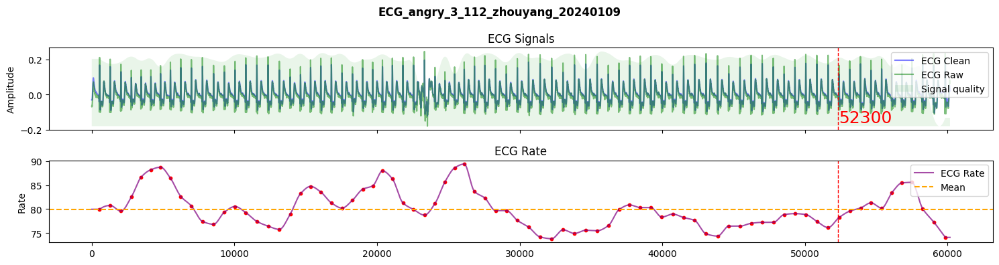

In [120]:
time_points = get_apexs(avi)
ecg = df_biopac_marker['ECG'].to_numpy()
ecg_signals, info = nk.ecg_process(ecg, sampling_rate=1000)
ecg_plot(ecg_signals, info, avi, time_points, show=True)

### RSP

In [24]:
def rsp_plot(rsp_signals, info, avi_name, time_points, show, static=True):
    if info is None:
        warn(
            "'info' dict not provided. Some information might be missing."
            + " Sampling rate will be set to 1000 Hz.",
            category=NeuroKitWarning,
        )

        info = {
            "sampling_rate": 1000,
        }

    # Mark peaks, troughs and phases.
    peaks = np.where(rsp_signals["RSP_Peaks"] == 1)[0]
    troughs = np.where(rsp_signals["RSP_Troughs"] == 1)[0]
    inhale = np.where(rsp_signals["RSP_Phase"] == 1)[0]
    exhale = np.where(rsp_signals["RSP_Phase"] == 0)[0]

    nrow = 2

    # Determine mean rate.
    rate_mean = np.mean(rsp_signals["RSP_Rate"])

    if "RSP_Amplitude" in list(rsp_signals.columns):
        nrow += 1
        # Determine mean amplitude.
        amplitude_mean = np.mean(rsp_signals["RSP_Amplitude"])
    if "RSP_RVT" in list(rsp_signals.columns):
        nrow += 1
        # Determine mean RVT.
        rvt_mean = np.mean(rsp_signals["RSP_RVT"])
    if "RSP_Symmetry_PeakTrough" in list(rsp_signals.columns):
        nrow += 1

    # Get signals marking inspiration and expiration.
    exhale_signal, inhale_signal = _rsp_plot_phase(rsp_signals, troughs, peaks)

    # Determine unit of x-axis.
#     x_label = "Time (seconds)"
    x_axis = np.linspace(0, len(rsp_signals), len(rsp_signals))

    if static:
        fig, ax = plt.subplots(nrows=nrow, ncols=1, sharex=True, figsize=(15,8))
        fig.suptitle("RSP_" + avi_name.split('.')[0], fontweight="bold")

        # 设置子图之间的垂直和水平间距
        plt.subplots_adjust(hspace=0.4)  # hspace 控制垂直间距

        last_ax = fig.get_axes()[-1]
#         last_ax.set_xlabel(x_label)

        # Plot cleaned and raw respiration as well as peaks and troughs.
        ax[0].set_title("Raw and Cleaned Signal")

        ax[0].plot(
            x_axis, rsp_signals["RSP_Raw"], color="#B0BEC5", label="Raw", zorder=1
        )
        ax[0].plot(
            x_axis,
            rsp_signals["RSP_Clean"],
            color="#2196F3",
            label="Cleaned",
            zorder=2,
            linewidth=1.5,
        )

        ax[0].scatter(
            x_axis[peaks],
            rsp_signals["RSP_Clean"][peaks],
            color="red",
            label="Exhalation Onsets",
            zorder=3,
            s=30
        )
        ax[0].scatter(
            x_axis[troughs],
            rsp_signals["RSP_Clean"][troughs],
            color="orange",
            label="Inhalation Onsets",
            zorder=4,
            s=30
        )

        # Shade region to mark inspiration and expiration.
        ax[0].fill_between(
            x_axis[exhale],
            exhale_signal[exhale],
            rsp_signals["RSP_Clean"][exhale],
            where=rsp_signals["RSP_Clean"][exhale] > exhale_signal[exhale],
            color="#CFD8DC",
            linestyle="None",
            label="exhalation",
        )
        ax[0].fill_between(
            x_axis[inhale],
            inhale_signal[inhale],
            rsp_signals["RSP_Clean"][inhale],
            where=rsp_signals["RSP_Clean"][inhale] > inhale_signal[inhale],
            color="#ECEFF1",
            linestyle="None",
            label="inhalation",
        )

        ax[0].legend(loc="upper right", fontsize=6)

        # Plot rate and optionally amplitude.
        ax[1].set_title("Breathing Rate")
        ax[1].plot(
            x_axis,
            rsp_signals["RSP_Rate"],
            color="#4CAF50",
            label="Rate",
            linewidth=1.5,
        )
        ax[1].axhline(y=rate_mean, label="Mean", linestyle="--", color="#4CAF50")
        ax[1].legend(loc="upper right")

        if "RSP_Amplitude" in list(rsp_signals.columns):
            ax[2].set_title("Breathing Amplitude")

            ax[2].plot(
                x_axis,
                rsp_signals["RSP_Amplitude"],
                color="#009688",
                label="Amplitude",
                linewidth=1.5,
            )
            ax[2].axhline(
                y=amplitude_mean, label="Mean", linestyle="--", color="#009688"
            )
            ax[2].legend(loc="upper right")

        if "RSP_RVT" in list(rsp_signals.columns):
            ax[3].set_title("Respiratory Volume per Time")

            ax[3].plot(
                x_axis,
                rsp_signals["RSP_RVT"],
                color="#00BCD4",
                label="RVT",
                linewidth=1.5,
            )
            ax[3].axhline(y=rvt_mean, label="Mean", linestyle="--", color="#009688")
            ax[3].legend(loc="upper right")

        if "RSP_Symmetry_PeakTrough" in list(rsp_signals.columns):
            ax[4].set_title("Cycle Symmetry")

            ax[4].plot(
                x_axis,
                rsp_signals["RSP_Symmetry_PeakTrough"],
                color="green",
                label="Peak-Trough Symmetry",
                linewidth=1.5,
            )
            ax[4].plot(
                x_axis,
                rsp_signals["RSP_Symmetry_RiseDecay"],
                color="purple",
                label="Rise-Decay Symmetry",
                linewidth=1.5,
            )
            ax[4].legend(loc="upper right")
            
        # ------------------------------------------ 添加竖线 ------------------------------------------------

        for tp in time_points:
            ax[0].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax[1].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax[2].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax[3].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax[4].axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            
            # 在红色虚线的右下侧显示对应的数字
            ax[0].text(tp + 50, ax[0].get_ylim()[0] + 0.05 * (ax[0].get_ylim()[1] - ax[0].get_ylim()[0]), 
                     str(tp), color='red', fontsize=8, verticalalignment='bottom', horizontalalignment='left')         
            
        # 保存图像到本地
        save_path = os.path.join('pics_pre_aft\Macro', 'rsp_' + avi_name.split('.')[0] + '.png')
        plt.savefig(save_path, dpi=300)
                
        if show:
            plt.show()
        else:
            plt.close()  # 关闭当前图形，不会显示
    
    else:
        # Generate interactive plot with plotly.
        try:
            import plotly.graph_objects as go
            from plotly.subplots import make_subplots

        except ImportError as e:
            raise ImportError(
                "NeuroKit error: rsp_plot(): the 'plotly'",
                " module is required when 'static' is False.",
                " Please install it first (`pip install plotly`).",
            ) from e

        subplot_titles = ["Raw and Cleaned Signal", "Breathing Rate"]
        if "RSP_Amplitude" in list(rsp_signals.columns):
            subplot_titles.append("Breathing Amplitude")
        if "RSP_RVT" in list(rsp_signals.columns):
            subplot_titles.append("Respiratory Volume per Time")
        if "RSP_Symmetry_PeakTrough" in list(rsp_signals.columns):
            subplot_titles.append("Cycle Symmetry")
        subplot_titles = tuple(subplot_titles)
        fig = make_subplots(
            rows=nrow,
            cols=1,
            shared_xaxes=True,
            subplot_titles=subplot_titles,
        )

        # Plot cleaned and raw RSP
        fig.add_trace(
            go.Scatter(
                x=x_axis, y=rsp_signals["RSP_Raw"], name="Raw", marker_color="#B0BEC5"
            ),
            row=1,
            col=1,
        )
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=rsp_signals["RSP_Clean"],
                name="Cleaned",
                marker_color="#2196F3",
            ),
            row=1,
            col=1,
        )

        # Plot peaks and troughs.
        fig.add_trace(
            go.Scatter(
                x=x_axis[peaks],
                y=rsp_signals["RSP_Clean"][peaks],
                name="Exhalation Onsets",
                marker_color="red",
                mode="markers",
            ),
            row=1,
            col=1,
        )
        fig.add_trace(
            go.Scatter(
                x=x_axis[troughs],
                y=rsp_signals["RSP_Clean"][troughs],
                name="Inhalation Onsets",
                marker_color="orange",
                mode="markers",
            ),
            row=1,
            col=1,
        )

        # TODO: Shade region to mark inspiration and expiration.

        # Plot rate and optionally amplitude.
        fig.add_trace(
            go.Scatter(
                x=x_axis, y=rsp_signals["RSP_Rate"], name="Rate", marker_color="#4CAF50"
            ),
            row=2,
            col=1,
        )
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=[rate_mean] * len(x_axis),
                name="Mean Rate",
                marker_color="#4CAF50",
                line=dict(dash="dash"),
            ),
            row=2,
            col=1,
        )

        if "RSP_Amplitude" in list(rsp_signals.columns):
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=rsp_signals["RSP_Amplitude"],
                    name="Amplitude",
                    marker_color="#009688",
                ),
                row=3,
                col=1,
            )
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=[amplitude_mean] * len(x_axis),
                    name="Mean Amplitude",
                    marker_color="#009688",
                    line=dict(dash="dash"),
                ),
                row=3,
                col=1,
            )

        if "RSP_RVT" in list(rsp_signals.columns):
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=rsp_signals["RSP_RVT"],
                    name="RVT",
                    marker_color="#00BCD4",
                ),
                row=4,
                col=1,
            )
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=[rvt_mean] * len(x_axis),
                    name="Mean RVT",
                    marker_color="#00BCD4",
                    line=dict(dash="dash"),
                ),
                row=4,
                col=1,
            )

        if "RSP_Symmetry_PeakTrough" in list(rsp_signals.columns):
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=rsp_signals["RSP_Symmetry_PeakTrough"],
                    name="Peak-Trough Symmetry",
                    marker_color="green",
                ),
                row=5,
                col=1,
            )
            fig.add_trace(
                go.Scatter(
                    x=x_axis,
                    y=rsp_signals["RSP_Symmetry_RiseDecay"],
                    name="Rise-Decay Symmetry",
                    marker_color="purple",
                ),
                row=5,
                col=1,
            )

        fig.update_layout(title_text="Respiration (RSP)", height=1250, width=750)
        for i in range(1, nrow + 1):
            fig.update_xaxes(title_text=x_label, row=i, col=1)

        return fig
    
def _rsp_plot_phase(rsp_signals, troughs, peaks):
    exhale_signal = pd.Series(np.full(len(rsp_signals), np.nan))
    exhale_signal[troughs] = rsp_signals["RSP_Clean"][troughs].values
    exhale_signal[peaks] = rsp_signals["RSP_Clean"][peaks].values
    exhale_signal = exhale_signal.bfill()

    inhale_signal = pd.Series(np.full(len(rsp_signals), np.nan))
    inhale_signal[troughs] = rsp_signals["RSP_Clean"][troughs].values
    inhale_signal[peaks] = rsp_signals["RSP_Clean"][peaks].values
    inhale_signal = inhale_signal.ffill()

    return exhale_signal, inhale_signal

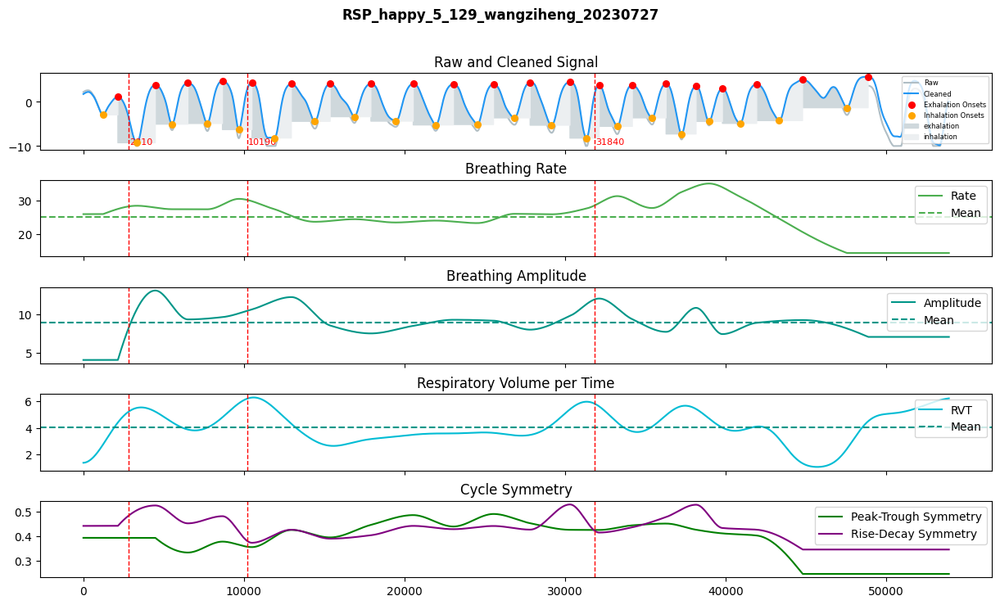

In [25]:
time_points = get_apexs(avi)
rsp = df_biopac_marker['RSP'].to_numpy()
rsp_signals, info = nk.rsp_process(rsp, sampling_rate=1000)
rsp_plot(rsp_signals, info, avi, time_points, show=True)

### EDA

In [26]:
def eda_plot(signals, info, avi_name, time_points, show, static=True):
    # Determine peaks, onsets, and half recovery.
    peaks = np.where(eda_signals["SCR_Peaks"] == 1)[0]
    onsets = np.where(eda_signals["SCR_Onsets"] == 1)[0]
    half_recovery = np.where(eda_signals["SCR_Recovery"] == 1)[0]

    # clean peaks that do not have onsets
    if len(peaks) > len(onsets):
        peaks = peaks[1:]

    # Determine unit of x-axis.
#     x_label = "Time (seconds)"
    x_axis = np.linspace(0, len(eda_signals), len(eda_signals))

    if static:
        fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(15,8))
        fig.suptitle("EDA_" + avi_name.split('.')[0], fontweight="bold")

        # 设置子图之间的垂直和水平间距
        plt.subplots_adjust(hspace=0.4)  # hspace 控制垂直间距

        last_ax = fig.get_axes()[-1]
#         last_ax.set_xlabel(x_label)

        # Plot cleaned and raw electrodermal activity.
        ax0.set_title("Raw and Cleaned Signal")
        ax0.plot(x_axis, eda_signals["EDA_Raw"], color="#B0BEC5", label="Raw", zorder=1)
        ax0.plot(
            x_axis,
            eda_signals["EDA_Clean"],
            color="#9C27B0",
            label="Cleaned",
            linewidth=1.5,
            zorder=1,
        )
        ax0.legend(loc="upper right")

        # Plot skin conductance response.
        ax1.set_title("Skin Conductance Response (SCR)")

        # Plot Phasic.
        ax1.plot(
            x_axis,
            eda_signals["EDA_Phasic"],
            color="#E91E63",
            label="Phasic Component",
            linewidth=1.5,
            zorder=1,
        )

        # Mark segments.
        risetime_coord, amplitude_coord, halfr_coord = _eda_plot_dashedsegments(
            eda_signals, ax1, x_axis, onsets, peaks, half_recovery
        )

        risetime = matplotlib.collections.LineCollection(
            risetime_coord, colors="#FFA726", linewidths=1, linestyle="dashed"
        )
        ax1.add_collection(risetime)

        amplitude = matplotlib.collections.LineCollection(
            amplitude_coord, colors="#1976D2", linewidths=1, linestyle="solid"
        )
        ax1.add_collection(amplitude)

        halfr = matplotlib.collections.LineCollection(
            halfr_coord, colors="#FDD835", linewidths=1, linestyle="dashed"
        )
        ax1.add_collection(halfr)
        ax1.legend(loc="upper right")

        # Plot Tonic.
        ax2.set_title("Skin Conductance Level (SCL)")
        ax2.plot(
            x_axis,
            eda_signals["EDA_Tonic"],
            color="#673AB7",
            label="Tonic Component",
            linewidth=1.5,
        )
        ax2.legend(loc="upper right")
        
        # ------------------------------------------ 添加竖线 ------------------------------------------------

        for tp in time_points:
            ax0.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax1.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax2.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            
            # 在红色虚线的右下侧显示对应的数字
            ax0.text(tp + 50, ax0.get_ylim()[0] + 0.05 * (ax0.get_ylim()[1] - ax0.get_ylim()[0]), 
                     str(tp), color='red', fontsize=8, verticalalignment='bottom', horizontalalignment='left')   
            
        # 保存图像到本地
        save_path = os.path.join('pics_pre_aft\Macro', 'eda_' + avi_name.split('.')[0] + '.png')
        plt.savefig(save_path, dpi=300)
        
        if show:
            plt.show()
        else:
            plt.close()  # 关闭当前图形，不会显示

    else:
        # Create interactive plot with plotly.
        try:
            import plotly.graph_objects as go
            from plotly.subplots import make_subplots

        except ImportError as e:
            raise ImportError(
                "NeuroKit error: ppg_plot(): the 'plotly'",
                " module is required when 'static' is False.",
                " Please install it first (`pip install plotly`).",
            ) from e

        fig = make_subplots(
            rows=3,
            cols=1,
            shared_xaxes=True,
            vertical_spacing=0.05,
            subplot_titles=(
                "Raw and Cleaned Signal",
                "Skin Conductance Response (SCR)",
                "Skin Conductance Level (SCL)",
            ),
        )

        # Plot cleaned and raw electrodermal activity.
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=eda_signals["EDA_Raw"],
                mode="lines",
                name="Raw",
                line=dict(color="#B0BEC5"),
                showlegend=True,
            ),
            row=1,
            col=1,
        )

        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=eda_signals["EDA_Clean"],
                mode="lines",
                name="Cleaned",
                line=dict(color="#9C27B0"),
                showlegend=True,
            ),
            row=1,
            col=1,
        )

        # Plot skin conductance response.
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=eda_signals["EDA_Phasic"],
                mode="lines",
                name="Phasic Component",
                line=dict(color="#E91E63"),
                showlegend=True,
            ),
            row=2,
            col=1,
        )

        # Mark segments.
        _, _, _ = _eda_plot_dashedsegments(
            eda_signals, fig, x_axis, onsets, peaks, half_recovery, static=static
        )

        # TODO add dashed segments to plotly version

        # Plot skin conductance level.
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=eda_signals["EDA_Tonic"],
                mode="lines",
                name="Tonic Component",
                line=dict(color="#673AB7"),
                showlegend=True,
            ),
            row=3,
            col=1,
        )

        # Add title to entire figure.
        fig.update_layout(title_text="Electrodermal Activity (EDA)", title_x=0.5)

        return fig

def _eda_plot_dashedsegments(eda_signals, ax, x_axis, onsets, peaks, half_recovery, static=True):
    # Mark onsets, peaks, and half-recovery.
    onset_x_values = x_axis[onsets]
    onset_y_values = eda_signals["EDA_Phasic"][onsets].values
    peak_x_values = x_axis[peaks]
    peak_y_values = eda_signals["EDA_Phasic"][peaks].values
    halfr_x_values = x_axis[half_recovery]
    halfr_y_values = eda_signals["EDA_Phasic"][half_recovery].values

    end_onset = pd.Series(
        eda_signals["EDA_Phasic"][onsets].values, eda_signals["EDA_Phasic"][peaks].index
    )

    risetime_coord = []
    amplitude_coord = []
    halfr_coord = []

    for i in range(len(onsets)):
        # Rise time.
        start = (onset_x_values[i], onset_y_values[i])
        end = (peak_x_values[i], onset_y_values[i])
        risetime_coord.append((start, end))

    for i in range(len(peaks)):
        # SCR Amplitude.
        start = (peak_x_values[i], onset_y_values[i])
        end = (peak_x_values[i], peak_y_values[i])
        amplitude_coord.append((start, end))

    for i in range(len(half_recovery)):
        # Half recovery.
        end = (halfr_x_values[i], halfr_y_values[i])
        peak_x_idx = np.where(peak_x_values < halfr_x_values[i])[0][-1]
        start = (peak_x_values[peak_x_idx], halfr_y_values[i])
        halfr_coord.append((start, end))

    if static:
        # Plot with matplotlib.
        # Mark onsets, peaks, and half-recovery.
        ax.scatter(
            x_axis[onsets],
            eda_signals["EDA_Phasic"][onsets],
            color="#FFA726",
            label="SCR - Onsets",
            zorder=2,
        )
        ax.scatter(
            x_axis[peaks],
            eda_signals["EDA_Phasic"][peaks],
            color="#1976D2",
            label="SCR - Peaks",
            zorder=2,
        )
        ax.scatter(
            x_axis[half_recovery],
            eda_signals["EDA_Phasic"][half_recovery],
            color="#FDD835",
            label="SCR - Half recovery",
            zorder=2,
        )

        ax.scatter(x_axis[end_onset.index], end_onset.values, alpha=0)
    else:
        # Create interactive plot with plotly.
        try:
            import plotly.graph_objects as go

        except ImportError as e:
            raise ImportError(
                "NeuroKit error: ppg_plot(): the 'plotly'",
                " module is required when 'static' is False.",
                " Please install it first (`pip install plotly`).",
            ) from e
        # Plot with plotly.
        # Mark onsets, peaks, and half-recovery.
        ax.add_trace(
            go.Scatter(
                x=x_axis[onsets],
                y=eda_signals["EDA_Phasic"][onsets],
                mode="markers",
                name="SCR - Onsets",
                marker=dict(color="#FFA726"),
                showlegend=True,
            ),
            row=2,
            col=1,
        )
        ax.add_trace(
            go.Scatter(
                x=x_axis[peaks],
                y=eda_signals["EDA_Phasic"][peaks],
                mode="markers",
                name="SCR - Peaks",
                marker=dict(color="#1976D2"),
                showlegend=True,
            ),
            row=2,
            col=1,
        )
        ax.add_trace(
            go.Scatter(
                x=x_axis[half_recovery],
                y=eda_signals["EDA_Phasic"][half_recovery],
                mode="markers",
                name="SCR - Half recovery",
                marker=dict(color="#FDD835"),
                showlegend=True,
            ),
            row=2,
            col=1,
        )
        ax.add_trace(
            go.Scatter(
                x=x_axis[end_onset.index],
                y=end_onset.values,
                mode="markers",
                marker=dict(color="#FDD835", opacity=0),
                showlegend=False,
            ),
            row=2,
            col=1,
        )

    return risetime_coord, amplitude_coord, halfr_coord

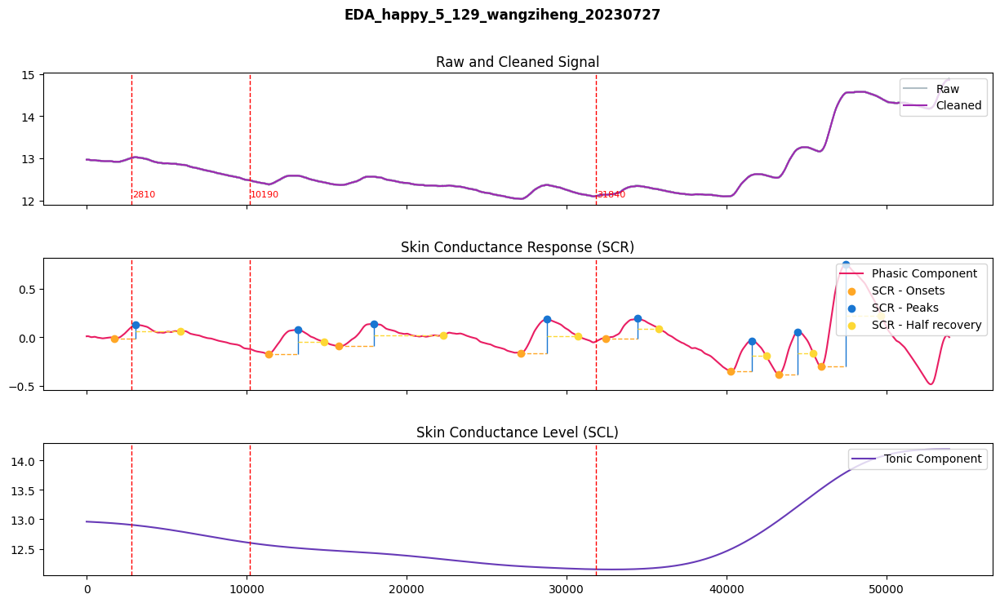

In [27]:
time_points = get_apexs(avi)
eda = df_biopac_marker['EDA'].to_numpy()
eda_signals, info = nk.eda_process(eda, sampling_rate=1000)
eda_plot(eda_signals, info, avi, time_points, show=True)

### PPG

In [28]:
def ppg_plot(ppg_signals, info, avi_name, time_points, show, static=True):
    # Sanity-check input.
    if not isinstance(ppg_signals, pd.DataFrame):
        raise ValueError(
            "NeuroKit error: The `ppg_signals` argument must"
            " be the DataFrame returned by `ppg_process()`."
        )

    # Extract Peaks.
    if info is None:
        warn(
            "'info' dict not provided. Some information might be missing."
            + " Sampling rate will be set to 1000 Hz.",
            category=NeuroKitWarning,
        )
        info = {"sampling_rate": 1000}

    # Extract Peaks (take those from df as it might have been cropped)
    if "PPG_Peaks" in ppg_signals.columns:
        info["PPG_Peaks"] = np.where(ppg_signals["PPG_Peaks"] == 1)[0]

    if static:    
        fig, (ax0, ax1) = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(15,8))
        fig.suptitle("PPG_" + avi_name.split('.')[0], fontweight="bold")

        # Plot cleaned and raw PPG
        ax0 = _ppg_peaks_plot(
            ppg_signals["PPG_Clean"].values,
            info=info,
            sampling_rate=info["sampling_rate"],
            raw=ppg_signals["PPG_Raw"].values,
            quality=ppg_signals["PPG_Quality"].values,
            ax=ax0,
        )

        # Plot Heart Rate
        ax1 = _signal_rate_plot(
            ppg_signals["PPG_Rate"].values,
            info["PPG_Peaks"],
            sampling_rate=info["sampling_rate"],
            title="Heart Rate",
            ytitle="Beats per minute (bpm)",
            color="#FB661C",
            color_mean="#FBB41C",
            color_points="#FF9800",
            ax=ax1,
        )
        
        # ------------------------------------------ 添加竖线 ------------------------------------------------

        for tp in time_points:
            ax0.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            ax1.axvline(x=tp, color='red', linestyle='--', linewidth=1)  # 红色虚线
            # 在红色虚线的右下侧显示对应的数字
            ax0.text(tp + 50, ax0.get_ylim()[0] + 0.05 * (ax0.get_ylim()[1] - ax0.get_ylim()[0]), 
                     str(tp), color='red', fontsize=8, verticalalignment='bottom', horizontalalignment='left')   
            
        # 保存图像到本地
        save_path = os.path.join('pics_pre_aft\Macro', 'ppg_' + avi_name.split('.')[0] + '.png')
        plt.savefig(save_path, dpi=300)
        
        if show:
            plt.show()
        else:
            plt.close()  # 关闭当前图形，不会显示


    else:
        try:
            import plotly.graph_objects as go
            from plotly.subplots import make_subplots

        except ImportError as e:
            raise ImportError(
                "NeuroKit error: ppg_plot(): the 'plotly'",
                " module is required when 'static' is False.",
                " Please install it first (`pip install plotly`).",
            ) from e

        # X-axis
        x_axis = np.linspace(0, len(ppg_signals), len(ppg_signals))

        fig = make_subplots(
            rows=2,
            cols=1,
            shared_xaxes=True,
            subplot_titles=("Raw and Cleaned Signal", "Rate"),
        )

        # Plot cleaned and raw PPG
        fig.add_trace(
            go.Scatter(x=x_axis, y=ppg_signals["PPG_Raw"], name="Raw"), row=1, col=1
        )
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=ppg_signals["PPG_Clean"],
                name="Cleaned",
                marker_color="#FB1CF0",
            ),
            row=1,
            col=1,
        )

        # Plot peaks
        fig.add_trace(
            go.Scatter(
                x=x_axis[info["PPG_Peaks"]],
                y=ppg_signals["PPG_Clean"][info["PPG_Peaks"]],
                name="Peaks",
                mode="markers",
                marker_color="#D60574",
            ),
            row=1,
            col=1,
        )

        # Rate
        ppg_rate_mean = ppg_signals["PPG_Rate"].mean()
        fig.add_trace(
            go.Scatter(
                x=x_axis,
                y=ppg_signals["PPG_Rate"],
                name="Rate",
                mode="lines",
                marker_color="#FB661C",
            ),
            row=2,
            col=1,
        )
        fig.add_hline(
            y=ppg_rate_mean,
            line_dash="dash",
            line_color="#FBB41C",
            name="Mean",
            row=2,
            col=1,
        )
        fig.update_layout(title_text="Photoplethysmogram (PPG)", height=500, width=750)
        if info["sampling_rate"] is not None:
            fig.update_xaxes(title_text="Time (seconds)", row=1, col=1)
            fig.update_xaxes(title_text="Time (seconds)", row=2, col=1)
        elif info["sampling_rate"] is None:
            fig.update_xaxes(title_text="Samples", row=1, col=1)
            fig.update_xaxes(title_text="Samples", row=2, col=1)
        return fig
    
def _ppg_peaks_plot(
    ppg_cleaned,
    info=None,
    sampling_rate=1000,
    raw=None,
    quality=None,
    ax=None,):
    x_axis = np.linspace(0, len(ppg_cleaned), len(ppg_cleaned))

    # Prepare plot
    if ax is None:
        _, ax = plt.subplots()

#     ax.set_xlabel("Time (seconds)")
    ax.set_title("PPG signal and peaks")

    # Quality Area -------------------------------------------------------------
    if quality is not None:
        quality = rescale(
            quality,
            to=[
                np.min([np.min(raw), np.min(ppg_cleaned)]),
                np.max([np.max(raw), np.max(ppg_cleaned)]),
            ],
        )
        minimum_line = np.full(len(x_axis), quality.min())

        # Plot quality area first
        ax.fill_between(
            x_axis,
            minimum_line,
            quality,
            alpha=0.12,
            zorder=0,
            interpolate=True,
            facecolor="#4CAF50",
            label="Signal quality",
        )

    # Raw Signal ---------------------------------------------------------------
    if raw is not None:
        ax.plot(x_axis, raw, color="#B0BEC5", label="Raw signal", zorder=1)
        label_clean = "Cleaned signal"
    else:
        label_clean = "Signal"

    # Peaks -------------------------------------------------------------------
    ax.scatter(
        x_axis[info["PPG_Peaks"]],
        ppg_cleaned[info["PPG_Peaks"]],
        color="#FFC107",
        label="Systolic peaks",
        zorder=2,
        s=10
    )

    # Artifacts ---------------------------------------------------------------
    _ecg_peaks_plot_artefacts(
        x_axis,
        ppg_cleaned,
        info,
        info["PPG_Peaks"],
        ax,
    )

    # Clean Signal ------------------------------------------------------------
    ax.plot(
        x_axis,
        ppg_cleaned,
        color="#E91E63",
        label=label_clean,
        zorder=3,
        linewidth=0.6
    )

    # Optimize legend
    ax.legend(loc="upper right")

    return ax

def _ecg_peaks_plot_artefacts(
    x_axis,
    signal,
    info,
    peaks,
    ax,):
    raw = [s for s in info.keys() if str(s).endswith("Peaks_Uncorrected")]
    if len(raw) == 0:
        return "No correction"
    raw = info[raw[0]]
    if len(raw) == 0:
        return "No bad peaks"
    if any([i < len(signal) for i in raw]):
        return "Peak indices longer than signal. Signals might have been cropped. " + "Better skip plotting."

    extra = [i for i in raw if i not in peaks]
    if len(extra) > 0:
        ax.scatter(
            x_axis[extra],
            signal[extra],
            color="#4CAF50",
            label="Peaks removed after correction",
            marker="x",
            zorder=2,
        )

    added = [i for i in peaks if i not in raw]
    if len(added) > 0:
        ax.scatter(
            x_axis[added],
            signal[added],
            color="#FF9800",
            label="Peaks added after correction",
            marker="x",
            zorder=2,
        )
    return ax

def _signal_rate_plot(
    rate,
    peaks,
    sampling_rate=None,
    interpolation_method=None,
    title="Rate",
    ytitle="Cycle per minute",
    color="black",
    color_mean="orange",
    color_points="red",
    ax=None,):
    # Prepare plot
    
    if ax is None:
        fig, ax = plt.subplots()

    if sampling_rate is None:
        x_axis = np.arange(0, len(rate))
#         ax.set_xlabel("Time (samples)")
    else:
        x_axis = np.linspace(0, len(rate), len(rate))
#         ax.set_xlabel("Time (seconds)")

    if interpolation_method is not None:
        title += " (interpolation method: " + str(interpolation_method) + ")"
    ax.set_title(title)
    ax.set_ylabel(ytitle)

    # Plot continuous rate
    ax.plot(
        x_axis,
        rate,
        color=color,
        label="Rate",
        linewidth=0.6
    )

    # Plot points
    if peaks is not None:
        ax.scatter(
            x_axis[peaks],
            rate[peaks],
            color=color_points,
            s=10
        )

    # Show average rate
    rate_mean = rate.mean()
    ax.axhline(y=rate_mean, label="Mean", linestyle="--", color=color_mean)

    ax.legend(loc="upper right")

    return ax

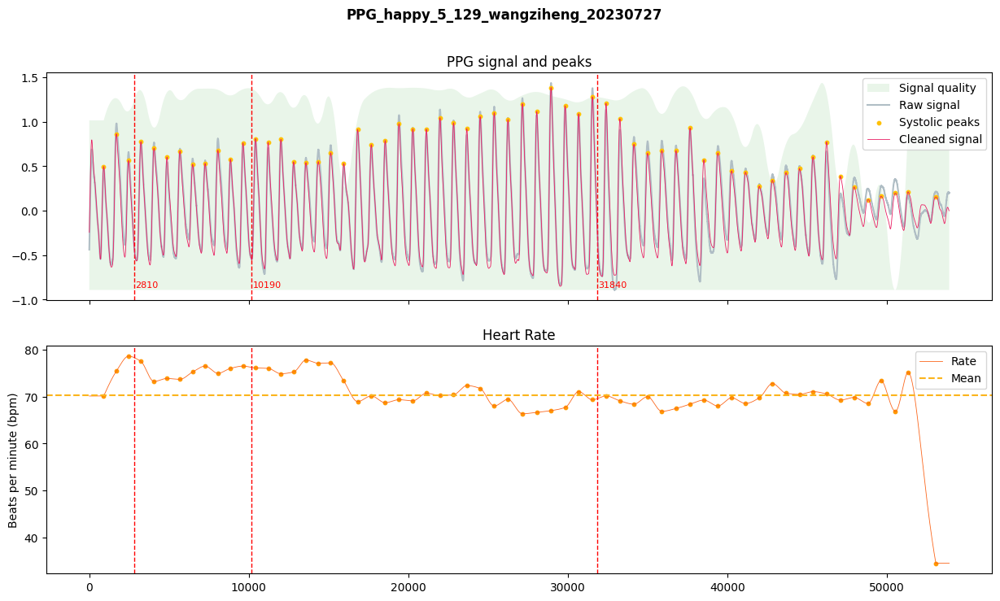

In [29]:
time_points = get_apexs(avi)
ppg = df_biopac_marker['PPG'].to_numpy()
ppg_signals, info = nk.ppg_process(ppg, sampling_rate=1000)
ppg_plot(ppg_signals, info, avi, time_points, show=True)

### 遍历所有.h5文件和marker

In [30]:
# 遍历目录下的文件
for filename in os.listdir('biopac_data_HDF5'):
    if filename.endswith('.h5'):
        print(filename)  # 输出 .h5 文件的完整路径
        # 加载该h5文件
        df_biopac_data = pd.read_hdf(os.path.join('biopac_data_HDF5', filename), key='df')
        # 根据h5找avi
        avi_names = h5_to_avis(filename, macro_dict)
        print('avi_names:', avi_names)
        if avi_names: # 如果列表不为空，遍历
            for avi in avi_names:
                marker = avi.split('_')[2]
                time_points = get_apexs(avi)
                print('time_points:', time_points)
                # 根据marker找到对应的数据
                df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
                df_biopac_marker = df_biopac_marker.reset_index(drop=True)
                
                # ECG
                ecg = df_biopac_marker['ECG'].to_numpy()
                ecg_signals, ecg_info = nk.ecg_process(ecg, sampling_rate=1000)
                ecg_plot(ecg_signals, ecg_info, avi, time_points, show=False)
                # RSP
                rsp = df_biopac_marker['RSP'].to_numpy()
                rsp_signals, rsp_info = nk.rsp_process(rsp, sampling_rate=1000)
                rsp_plot(rsp_signals, rsp_info, avi, time_points, show=False)
                # EDA
                eda = df_biopac_marker['EDA'].to_numpy()
                eda_signals, eda_info = nk.eda_process(eda, sampling_rate=1000)
                eda_plot(eda_signals, eda_info, avi, time_points, show=False) 
                # PPG
                ppg = df_biopac_marker['PPG'].to_numpy()
                ppg_signals, ppg_info = nk.ppg_process(ppg, sampling_rate=1000)
                ppg_plot(ppg_signals, ppg_info, avi, time_points, show=False)     

fengdengfang_8.2.h5
avi_names: ['angry_1_146_fengdengfang_20230802.avi', 'angry_2_107_fengdengfang_20230802.avi', 'disgust_4_119_fengdengfang_20230802.avi', 'disgust_5_128_fengdengfang_20230802.avi', 'fear_2_104_fengdengfang_20230802.avi', 'fear_5_130_fengdengfang_20230802.avi', 'happy_2_103_fengdengfang_20230802.avi', 'happy_3_111_fengdengfang_20230802.avi', 'sad_6_136_fengdengfang_20230802.avi']
time_points: [24590]
time_points: [19440]


D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\rsp\rsp_symmetry.py:90: NeuroKitWarning: Not enough peaks and troughs (signal too short?) to compute symmetry, returning nan for symmetry.
  warn(


time_points: [10490, 23440]
time_points: [23900]


D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\rsp\rsp_symmetry.py:90: NeuroKitWarning: Not enough peaks and troughs (signal too short?) to compute symmetry, returning nan for symmetry.
  warn(


time_points: [26700]


D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\rsp\rsp_symmetry.py:90: NeuroKitWarning: Not enough peaks and troughs (signal too short?) to compute symmetry, returning nan for symmetry.
  warn(


time_points: [27950]
time_points: [15000, 18730, 30820, 41180]
time_points: [35510]
time_points: [46720]
linjiaying_7.19.h5
avi_names: []
liuhaoyu_7.28.h5
avi_names: []
liyan_8.2.h5
avi_names: ['disgust_3_110_liyan_20230802.avi', 'disgust_6_137_liyan_20230802.avi', 'fear_2_104_liyan_20230802.avi']
time_points: [12250, 3580]
time_points: [39000]
time_points: [42590]
lvpinxin_8.3.h5
avi_names: []
mayiran_7.18.h5
avi_names: []
qiangweihua_7.31.h5
avi_names: []
qingwenyang_8.3.h5
avi_names: []
shengxin_7.31.h5
avi_names: []
shitianyang_7.20.h5
avi_names: []
wangjintao_7.19.h5
avi_names: []
wangsen_8.1.h5
avi_names: []
wangshuai_8.2.h5
avi_names: ['angry_2_107_wangshuai_20230802.avi', 'angry_5_133_wangshuai_20230802.avi', 'angry_6_142_wangshuai_20230802.avi', 'disgust_3_110_wangshuai_20230802.avi', 'disgust_4_119_wangshuai_20230802.avi', 'fear_2_104_wangshuai_20230802.avi', 'fear_4_121_wangshuai_20230802.avi', 'happy_2_103_wangshuai_20230802.avi', 'happy_3_111_wangshuai_20230802.avi', 'happ

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\rsp\rsp_symmetry.py:90: NeuroKitWarning: Not enough peaks and troughs (signal too short?) to compute symmetry, returning nan for symmetry.
  warn(


time_points: [46640]


D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\rsp\rsp_symmetry.py:90: NeuroKitWarning: Not enough peaks and troughs (signal too short?) to compute symmetry, returning nan for symmetry.
  warn(


zhangdi_7.21.h5
avi_names: ['disgust_1_112_zhangdi_20230721.avi', 'disgust_5_128_zhangdi_20230721.avi', 'happy_2_103_zhangdi_20230721.avi', 'happy_6_138_zhangdi_20230721.avi']
time_points: [35030]
time_points: [12950, 16560]
time_points: [31140, 50930]
time_points: [45360]
zhaolei_8.3.h5
avi_names: []
zhaoshaohua_8.1.h5
avi_names: ['disgust_1_112_zhaoshaohua_20230801.avi', 'disgust_2_102_zhaoshaohua_20230801.avi', 'disgust_3_110_zhaoshaohua_20230801.avi', 'disgust_4_119_zhaoshaohua_20230801.avi', 'disgust_5_128_zhaoshaohua_20230801.avi', 'fear_2_104_zhaoshaohua_20230801.avi', 'happy_2_103_zhaoshaohua_20230801.avi', 'happy_3_111_zhaoshaohua_20230801.avi', 'happy_4_120_zhaoshaohua_20230801.avi', 'sad_4_118_zhaoshaohua_20230801.avi']
time_points: [24420]
time_points: [20740, 4510, 51370]
time_points: [22100, 29300, 4890]
time_points: [11240, 23000, 4170, 35920]
time_points: [11950, 3160, 25410]
time_points: [25360, 31510]
time_points: [15900]
time_points: [15990, 35150]
time_points: [7870

## 将图片保存至PDF

### 不同的PS分别保存为单独的pdf

In [50]:
import os
from PIL import Image
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas

# 函数：将图片保存为高分辨率PDF
def images_to_pdf(image_paths, output_pdf, dpi=300):
    # 设置高 DPI 的页面宽度和高度
    c = canvas.Canvas(output_pdf, pagesize=letter)
    page_width, page_height = letter
    images_per_page = 3  # 每页三张图片

    # 按照DPI调整每英寸的像素数量
    scale_factor = dpi / 72  # ReportLab使用72DPI为基准

    for i in range(0, len(image_paths), images_per_page):
        images = image_paths[i:i + images_per_page]

        # 计算每张图片的宽高并按比例缩放
        heights = []
        for img_path in images:
            img = Image.open(img_path)
            width, height = img.size
            aspect_ratio = height / width
            img_resized_height = page_width * aspect_ratio  # 缩放后的高度
            heights.append(img_resized_height * scale_factor)  # 按DPI缩放

        total_height = sum(heights)

        # 如果拼接后的总高度超过页面高度，则等比例缩小所有图片
        if total_height > page_height * scale_factor:
            page_scale_factor = (page_height * scale_factor) / total_height
            heights = [h * page_scale_factor for h in heights]

        # 在每页按顺序放置图片
        current_y = page_height
        for img_path, height in zip(images, heights):
            img = Image.open(img_path)
            img_width, img_height = img.size
            aspect_ratio = img_height / img_width
            new_height = page_width * aspect_ratio * scale_factor
            new_height = height  # 使用之前计算的DPI调整后的高度

            # 在页面中逐步向下放置图片
            current_y -= new_height / scale_factor  # 转换回像素

            # 将高分辨率图片绘制到PDF中
            c.drawImage(
                img_path,
                0,
                current_y,
                width=page_width,
                height=new_height / scale_factor,  # 按DPI还原比例
                preserveAspectRatio=True,
                mask='auto'
            )

        c.showPage()

    c.save()

# 函数：遍历目录下的所有以"ECG"开头的图片
def find_ps_images(directory, start):
    ps_images = []
    for filename in os.listdir(directory):
        if filename.startswith(start) and filename.endswith((".jpg", ".png", ".jpeg")):
            ps_images.append(os.path.join(directory, filename))
    return sorted(ps_images)  # 排序，确保顺序一致

In [52]:
PS = ['ecg', 'rsp', 'eda', 'ppg']
image_directory = r'pics_pre_aft\Macro'

for start in PS:
    output_pdf = image_directory + '\\' + start + "_images.pdf"

    # 找到所有ECG开头的图片
    images = find_ps_images(image_directory, start)

    # 将这些图片拼接为高分辨率PDF
    if images:
        images_to_pdf(images, output_pdf, dpi=300)
        print(f"High-resolution PDF saved as {output_pdf}")
    else:
        print("No images found.")

High-resolution PDF saved as pics_pre_aft\Macro\ecg_images.pdf
High-resolution PDF saved as pics_pre_aft\Macro\rsp_images.pdf
High-resolution PDF saved as pics_pre_aft\Macro\eda_images.pdf
High-resolution PDF saved as pics_pre_aft\Macro\ppg_images.pdf


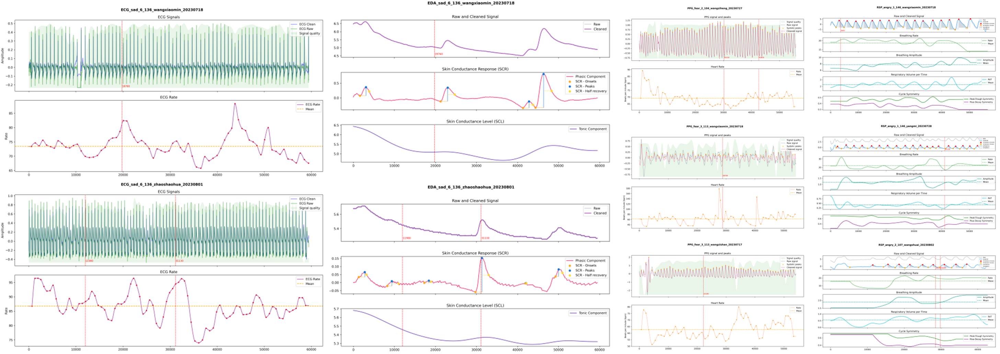

### 每个MaE所有PS合并

In [53]:
import os
from PIL import Image
from reportlab.pdfgen import canvas
from reportlab.lib.pagesizes import letter
from reportlab.lib.utils import ImageReader  # 用于直接从 PIL.Image 读取图像
  
def images_to_pdf(image_groups, output_pdf, dpi=300):
    # 设置高 DPI 的页面宽度和高度
    c = canvas.Canvas(output_pdf, pagesize=letter)
    page_width, page_height = letter
    images_per_page = 4  # 每页放置的图片数量

    # 按照DPI调整每英寸的像素数量
    scale_factor = dpi / 72  # ReportLab使用72DPI为基准

    for images in image_groups:
        # 计算每张图片的宽高并按比例缩放
        heights = []
        for i, img_path in enumerate(images):
            img = Image.open(img_path)
            width, height = img.size
            aspect_ratio = height / width
            if i == 0:  # 如果是第一张图片，放大宽度
                img_resized_height = page_width * aspect_ratio * 0.825
            else:
                img_resized_height = page_width * aspect_ratio  # 缩放后的高度
            heights.append(img_resized_height * scale_factor)  # 按DPI缩放

        total_height = sum(heights)

        # 如果拼接后的总高度超过页面高度，则等比例缩小所有图片
        if total_height > page_height * scale_factor:
            page_scale_factor = (page_height * scale_factor) / total_height
            heights = [h * page_scale_factor for h in heights]

        # 在每页按顺序放置图片
        current_y = page_height
        for i, (img_path, height) in enumerate(zip(images, heights)):
            img = Image.open(img_path)
            img_width, img_height = img.size
            aspect_ratio = img_height / img_width
            new_height = page_width * aspect_ratio * scale_factor
            new_height = height  # 使用之前计算的DPI调整后的高度

            # 在页面中逐步向下放置图片
            current_y -= new_height / scale_factor  # 转换回像素

            # 将高分辨率图片绘制到PDF中
            if i == 0:  # 如果是第一张图片，向左移动一点
                x_offset = -2  # 向左移动的距离，可以根据需要调整
            else:
                x_offset = 0  # 其他图片不进行偏移

            c.drawImage(
                img_path,
                x_offset,  # 调整x_offset，第一张图片向左移动
                current_y,
                width=page_width,
                height=new_height / scale_factor,  # 按DPI还原比例
                preserveAspectRatio=True,
                mask='auto'
            )

        c.showPage()

    c.save()

# 查找所有符合条件的图片，并按相同信息部分分组
def find_images_by_group(directory):
    image_groups = {}
    prefixes = ['ecg', 'rsp', 'eda', 'ppg']

    for filename in os.listdir(directory):
        if filename.endswith('.png'):
            for prefix in prefixes:
                if filename.startswith(prefix):
                    # 提取去掉前缀后的信息部分作为分组依据
                    info = filename[len(prefix)+1:].split('.')[0]  # 提取除去前缀的部分
                    if info not in image_groups:
                        image_groups[info] = {}
                    image_groups[info][prefix] = os.path.join(directory, filename)

    # 按编号排序，并组装完整的图片路径列表
    sorted_groups = []
    for info in sorted(image_groups.keys()):
        group = image_groups[info]
        if all(prefix in group for prefix in prefixes):  # 确保每组都包含所有前缀的图片
            sorted_groups.append([group[prefix] for prefix in prefixes])

    return sorted_groups

image_directory = r'pics_pre_aft\Macro'
output_pdf = image_directory + "\\combined_images.pdf"
# 找到按信息部分分组的图片
image_groups = find_images_by_group(image_directory)

# print('image_groups:', image_groups)

# 如果找到符合条件的图片，生成PDF
if image_groups:
    images_to_pdf(image_groups, output_pdf, dpi=300)  # 调整DPI到300，提高分辨率
    print(f"PDF saved as {output_pdf}")
else:
    print("No matching image groups found.")

PDF saved as pics_pre_aft\Macro\combined_images.pdf


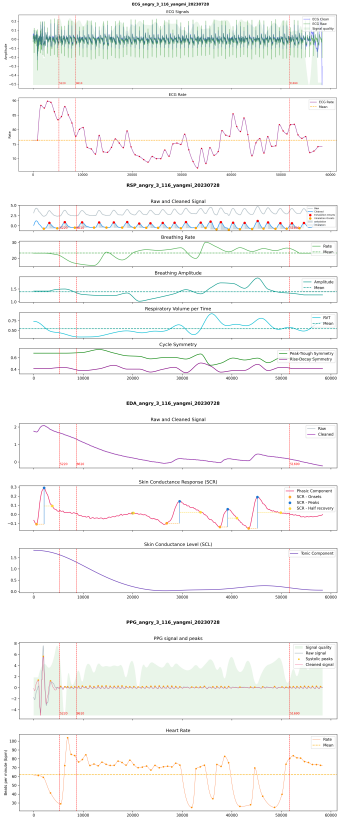

## 相关性检验

对于许多心率变异指数来说，3 秒钟（甚至 60 秒钟）肯定太短了。如果想计算一些东西，只能计算基本的时域指标，比如 RMSSD。只使用 hrv_time()。   
如果只有几秒钟，建议使用 ecg_eventrelated()，而不是 ecg_intervalrelated()

In [54]:
macro_dict

{'angry_1_146_fengdengfang_20230802.avi': [('24.330', '24.590', '25.330')],
 'angry_1_146_wangxiaomin_20230718.avi': [('12.090', '12.680', '12.680'),
  ('3.320', '3.600', '3.600'),
  ('36.310', '36.860', '37.750'),
  ('37.700', '38.230', '38.230'),
  ('39.660', '39.840', '40.290')],
 'angry_1_146_xietao_20230803.avi': [('34.870', '35.460', '35.460')],
 'angry_1_146_yangmi_20230728.avi': [('27.540', '27.890', '28.160'),
  ('3.210', '3.660', '3.660')],
 'angry_1_146_zhengwansheng_20230718.avi': [('14.920', '15.270', '15.270'),
  ('46.310', '46.850', '46.850')],
 'angry_2_107_fengdengfang_20230802.avi': [('19.060', '19.440', '19.700')],
 'angry_2_107_wangshuai_20230802.avi': [('40.370', '40.670', '41.660')],
 'angry_2_107_wangxiaomin_20230718.avi': [('17.560', '18.440', '18.440'),
  ('4.550', '5.650', '5.650')],
 'angry_2_107_wangzishan_20230717.avi': [('17.720', '18.130', '18.600')],
 'angry_2_107_yangmi_20230728.avi': [('24.140', '24.880', '24.880')],
 'angry_2_107_zhengwansheng_2023071

In [55]:
def convert_2_df(info):
    # 统一长度：根据ECG_R_Peaks的长度为基准
    length = len(info['ECG_R_Peaks'])

    # 将标量或较短的列表扩展成与主要数据长度一致的形式
    def expand_data(key, value):
        if isinstance(value, list) or isinstance(value, np.ndarray):
            if len(value) < length:
                return list(value) + [None] * (length - len(value))  # 补齐长度
            else:
                return value
        else:
            return [value] * length  # 将标量扩展成重复值

    # 构建包含所有键值的DataFrame
    df = pd.DataFrame({key: expand_data(key, value) for key, value in info.items()})

    # 输出结果
    return df

### 遍历所有宏表情

In [63]:
def get_ecg_features(df_epoch, pre_or_aft):
    # 提取ECG统计特征
    ecg = df_epoch['ECG'].to_numpy()
    ecg_mean = round(np.mean(ecg), 5)  # 平均值
    ecg_std = round(np.std(ecg), 5)  # 标准差
    ecg_max = round(np.max(ecg), 5)  # 最大值
    ecg_min = round(np.min(ecg), 5)  # 最小值
    ecg_range = round(ecg_max - ecg_min, 5)  # 幅度范围
    
    try:
        # 提取心率和RR间隔信息
        ecg_epoch, info = nk.ecg_process(ecg, sampling_rate=1000)
        heart_rate = ecg_epoch['ECG_Rate']  # 获取心率（bpm）
        rr_intervals = np.diff(ecg_epoch['ECG_R_Peaks']) / 1000  # 计算RR间隔（秒）

        # 计算RR间隔的统计特征
        rr_mean = round(np.mean(rr_intervals), 5)  # RR间隔均值
        rr_std = round(np.std(rr_intervals), 5)  # RR间隔标准差
        heart_rate_mean = round(np.mean(heart_rate), 5)  # 心率平均值
    except:
        rr_mean, rr_std, heart_rate_mean = None, None, None
    
    ecg_features = (ecg_mean, ecg_std, ecg_max, ecg_min, ecg_range, rr_mean, rr_std, heart_rate_mean)
    
    ecg_features_names = ['ecg_mean', 'ecg_std', 'ecg_max', 'ecg_min', 'ecg_range', 'rr_mean', 'rr_std', 'heart_rate_mean']
    
    if pre_or_aft =='pre':
        ecg_features_names = [item + '_pre' for item in ecg_features_names]
    if pre_or_aft =='aft':
        ecg_features_names = [item + '_aft' for item in ecg_features_names]
#     print('ecg_features:', ecg_features)
    # 返回统计特征
    return ecg_features, ecg_features_names

In [64]:
def get_hrv_features(df_epoch, pre_or_aft):
    ecg = df_epoch['ECG'].to_numpy()
    try:
        ecg_peaks, info = nk.ecg_peaks(ecg, sampling_rate=1000)
        hrv_features = nk.hrv_time(ecg_peaks, sampling_rate=1000, show=False)
        hrv_features_names = hrv_features.columns.tolist()
        hrv_features = tuple(hrv_features.iloc[0].apply(lambda x: np.nan if x is None else x))
        
    except:
        hrv_features = [None for _ in range(25)]
        hrv_features_names = ['HRV_MeanNN', 'HRV_SDNN', 'HRV_SDANN1', 'HRV_SDNNI1', 'HRV_SDANN2', 'HRV_SDNNI2', 'HRV_SDANN5', 
                              'HRV_SDNNI5',  'HRV_RMSSD', 'HRV_SDSD', 'HRV_CVNN', 'HRV_CVSD', 'HRV_MedianNN', 'HRV_MadNN', 
                              'HRV_MCVNN', 'HRV_IQRNN', 'HRV_SDRMSSD', 'HRV_Prc20NN', 'HRV_Prc80NN', 'HRV_pNN50', 'HRV_pNN20', 
                              'HRV_MinNN', 'HRV_MaxNN', 'HRV_HTI', 'HRV_TINN']
    
    if pre_or_aft =='pre':
        hrv_features_names = [item + '_pre' for item in hrv_features_names]
    if pre_or_aft =='aft':
        hrv_features_names = [item + '_aft' for item in hrv_features_names]
#     print('hrv_features_names:', hrv_features_names)
    return hrv_features, hrv_features_names

In [65]:
def get_ppg_features(df_epoch, pre_or_aft):
    ppg = df_epoch['PPG'].to_numpy()
    try:
        ppg_epoch, info = nk.ppg_process(ppg, sampling_rate=1000)
        # 计算PPG_Rate的均值
        ppg_rate_mean = ppg_epoch['PPG_Rate'].mean()
    except:
        ppg_rate_mean = None
        
    ppg_features = (ppg_rate_mean,)
    ppg_features_names = ['ppg_rate_mean']
    
    if pre_or_aft =='pre':
        ppg_features_names = [item + '_pre' for item in ppg_features_names]
    if pre_or_aft =='aft':
        ppg_features_names = [item + '_aft' for item in ppg_features_names]
        
    return ppg_features, ppg_features_names

In [66]:
def get_rsp_features(df_epoch, pre_or_aft):
    rsp = df_epoch['RSP'].to_numpy()
    rsp_mean = round(np.mean(rsp), 5)
    rsp_std_dev = round(np.std(rsp), 5)
    rsp_median = round(np.median(rsp), 5)
    rsp_max_value = round(np.max(rsp), 5)
    rsp_min_value = round(np.min(rsp), 5)
    rsp_skewness = round(stats.skew(rsp), 5)
    rsp_kurtosis = round(stats.kurtosis(rsp), 5)
    
    rsp_features = (rsp_mean, rsp_std_dev, rsp_median, rsp_max_value, rsp_min_value, rsp_skewness, rsp_kurtosis)
    rsp_features_names = ['rsp_mean', 'rsp_std_dev', 'rsp_median', 'rsp_max_value', 'rsp_min_value', 'rsp_skewness', 'rsp_kurtosis']
    
    if pre_or_aft =='pre':
        rsp_features_names = [item + '_pre' for item in rsp_features_names]
    if pre_or_aft =='aft':
        rsp_features_names = [item + '_aft' for item in rsp_features_names] 
    
    return rsp_features, rsp_features_names    

In [67]:
def get_eda_features(df_epoch, pre_or_aft):
    eda = df_epoch['EDA'].to_numpy()
    try:
        eda_epoch, info = nk.eda_process(eda, sampling_rate=1000)

        # 提取SCL和SCR特征
        scl = eda_epoch["EDA_Tonic"]  # 皮肤电水平
        scr = eda_epoch["EDA_Phasic"]  # 皮肤电反应

        # 计算统计特征
        eda_mean = round(np.mean(scl), 5)  # 平均值
        eda_std = round(np.std(scl), 5)  # 标准差
        eda_max = round(np.max(scl), 5)  # 最大值
        eda_min = round(np.min(scl), 5)  # 最小值
        eda_range = round(eda_max - eda_min, 5)  # 幅度范围
    except:
        eda_mean, eda_std, eda_max, eda_min, eda_range = None, None, None, None, None
        
    try:
        # 检测皮肤电反应的峰值
        peaks_info = nk.eda_findpeaks(scr)
        peaks = peaks_info["SCR_Peaks"]  # 获取峰值的索引
        eda_num_peaks = len(peaks)  # 皮肤电反应次数
        peak_amplitudes = scr[peaks]  # 反应峰值的振幅
        eda_mean_amplitude = round(np.mean(peak_amplitudes), 5) if num_peaks > 0 else 0  # 平均振幅
    except:
        eda_num_peaks, eda_mean_amplitude = None, None
        
    eda_features = (eda_mean, eda_std, eda_max, eda_min, eda_range, eda_num_peaks, eda_mean_amplitude)
    eda_features_names = ['eda_mean', 'eda_std', 'eda_max', 'eda_min', 'eda_range', 'eda_num_peaks', 'eda_mean_amplitude']
    
    if pre_or_aft =='pre':
        eda_features_names = [item + '_pre' for item in eda_features_names]
    if pre_or_aft =='aft':
        eda_features_names = [item + '_aft' for item in eda_features_names] 
    
    return eda_features, eda_features_names 

In [68]:
def get_skt_features(df_epoch, pre_or_aft):
    skt_signal = df_epoch['SKT A'].to_numpy()
    # 计算统计特征
    skt_mean = round(np.mean(skt_signal), 5)  # 平均值
    skt_std = round(np.std(skt_signal), 5)  # 标准差
    skt_max = round(np.max(skt_signal), 5)  # 最大值
    skt_min = round(np.min(skt_signal), 5)  # 最小值
    skt_range = round(skt_max - skt_min, 5)  # 幅度范围

    # 计算信号的斜率
    time = np.arange(len(skt_signal))  # 时间轴（以秒为单位）
    skt_slope = round(np.polyfit(time, skt_signal, 1)[0], 5)  # 线性拟合，计算斜率
    
    skt_features = (skt_mean, skt_std, skt_max, skt_min, skt_range, skt_slope)
    skt_features_names = ['skt_mean', 'skt_std', 'skt_max', 'skt_min', 'skt_range', 'skt_slope']
    
    if pre_or_aft =='pre':
        skt_features_names = [item + '_pre' for item in skt_features_names]
    if pre_or_aft =='aft':
        skt_features_names = [item + '_aft' for item in skt_features_names] 
    
    return skt_features, skt_features_names

In [71]:
def get_features(epoch):
    df_features = pd.DataFrame() # 初始化一个空 DataFrame 用于存储结果
    # 遍历目录下的h5文件
    for filename in os.listdir('biopac_data_HDF5'):
        if filename.endswith('.h5'):
            # 加载该h5文件（1h），包含marker信息
            df_biopac_data = pd.read_hdf(os.path.join('biopac_data_HDF5', filename), key='df')
            # 获取h5对应的视频（1min）
            avi_names = h5_to_avis(filename, macro_dict)
            if avi_names: # 如果列表不为空
                # 获取.avi中的宏表情
                for avi in avi_names:
                    marker = avi.split('_')[2]
                    mae_apexs = get_apexs(avi)
                    # 根据marker找到对应的数据
                    df_biopac_marker = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker)]
                    df_biopac_marker = df_biopac_marker.reset_index(drop=True)
                    # 获取行数
                    row_count = len(df_biopac_marker)

                    # 遍历每个微表情
                    for apex in mae_apexs:
                        me = avi.split('.avi')[0] + '_' + str(apex/1000)

                        if float(apex/1000) > epoch and int((float(apex/1000) + epoch)*1000) <= row_count:
                            df_epoch_pre = df_biopac_marker.iloc[int((float(apex/1000) - epoch)*1000): apex + 1, :]
                            df_epoch_aft = df_biopac_marker.iloc[apex: int((float(apex/1000) + epoch)*1000) + 1, :]

                            # ECG
                            ecg_features_pre, ecg_features_names_pre = get_ecg_features(df_epoch_pre, 'pre')
                            ecg_features_aft, ecg_features_names_aft = get_ecg_features(df_epoch_aft, 'aft')
                            # HRV
                            hrv_features_pre, hrv_features_names_pre = get_hrv_features(df_epoch_pre, 'pre')
                            hrv_features_aft, hrv_features_names_aft = get_hrv_features(df_epoch_aft, 'aft')
                            # PPG
                            ppg_features_pre, ppg_features_names_pre = get_ppg_features(df_epoch_pre, 'pre')
                            ppg_features_aft, ppg_features_names_aft = get_ppg_features(df_epoch_aft, 'aft')
                            # RSP
                            rsp_features_pre, rsp_features_names_pre = get_rsp_features(df_epoch_pre, 'pre')
                            rsp_features_aft, rsp_features_names_aft = get_rsp_features(df_epoch_aft, 'aft')                    
                            # EDA
                            eda_features_pre, eda_features_names_pre = get_eda_features(df_epoch_pre, 'pre')
                            eda_features_aft, eda_features_names_aft = get_eda_features(df_epoch_aft, 'aft')                         
                            # SKT
                            skt_features_pre, skt_features_names_pre = get_skt_features(df_epoch_pre, 'pre')
                            skt_features_aft, skt_features_names_aft = get_skt_features(df_epoch_aft, 'aft')                       

                            features = (
                                (me,) + 
                                ecg_features_pre + ecg_features_aft + hrv_features_pre + hrv_features_aft +
                                ppg_features_pre + ppg_features_aft + rsp_features_pre + rsp_features_aft +
                                eda_features_pre + eda_features_aft + skt_features_pre + skt_features_aft
                            )

                            features_names = (
                                ['MaE'] + 
                                ecg_features_names_pre + ecg_features_names_aft + hrv_features_names_pre + hrv_features_names_aft +
                                ppg_features_names_pre + ppg_features_names_aft + rsp_features_names_pre + rsp_features_names_aft +
                                eda_features_names_pre + eda_features_names_aft + skt_features_names_pre + skt_features_names_aft
                            )

                            # 将ecg_features转换为一个DataFrame，然后使用pd.concat添加到df_features中
                            new_row = pd.DataFrame([features], columns=features_names)
                            df_features = pd.concat([df_features, new_row], ignore_index=True)
                            
    xlsx_name = r'features_epoch\MaEs\features_' + str(epoch) + '.xlsx'
    df_features.to_excel(xlsx_name, index=False)  # index=False 可以省略行索引 
    print("DataFrame 已成功写入Excel文件")
    
    return df_features

In [73]:
epochs = [3, 5, 7, 9, 10, 11, 13, 15]
for epoch in epochs:
    df_features = get_features(epoch)
    print('df_features.shape:', df_features.shape) # 109列， 108/2=54种特征
    display(df_features)

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\hrv\hrv_time.py:175: RuntimeWarning: invalid value encountered in scalar divide
  out["SDRMSSD"] = out["SDNN"] / out["RMSSD"]  # Sollers

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Admini

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, 

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_fixpeaks.py:307: RuntimeWarning: invalid value encountered in divide
  mrrs /= th2
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signa

C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anac

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_fixpeaks.py:307: RuntimeWarning: invalid value encountered in divide
  mrrs /= th2
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signa

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administra

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anac

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\

D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
C:\Users\Administrator\AppData\Roaming\Python\Python310\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-

DataFrame 已成功写入Excel文件
df_features.shape: (277, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,angry_1_146_fengdengfang_20230802_24.59,-0.00906,0.12722,0.44495,-0.42648,0.87143,None,None,None,-0.01135,...,32.00244,31.99634,0.00610,-0.00000,31.99999,0.00080,32.00305,31.99695,0.00610,-0.0
1,angry_2_107_fengdengfang_20230802_19.44,-0.00535,0.11871,0.45929,-0.36972,0.82901,None,None,None,-0.00626,...,32.00244,31.99817,0.00427,-0.00000,32.00036,0.00065,32.00244,31.99817,0.00427,-0.0
2,disgust_4_119_fengdengfang_20230802_10.49,-0.01177,0.12844,0.42953,-0.38116,0.81069,None,None,None,-0.00615,...,32.00305,31.99695,0.00610,-0.00000,31.99985,0.00076,32.00305,31.99695,0.00610,-0.0
3,disgust_4_119_fengdengfang_20230802_23.44,-0.00604,0.13563,0.42725,-0.36942,0.79667,None,None,None,-0.00652,...,32.00244,31.99756,0.00488,-0.00000,32.00008,0.00070,32.00244,31.99756,0.00488,-0.0
4,disgust_5_128_fengdengfang_20230802_23.9,-0.01051,0.12785,0.42313,-0.41275,0.83588,None,None,None,-0.01032,...,32.00305,31.99695,0.00610,-0.00000,32.00010,0.00085,32.00305,31.99695,0.00610,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272,happy_6_138_zhengwansheng_20230718_35.16,-0.00553,0.24766,0.92285,-0.96649,1.88934,None,None,None,0.00328,...,30.02185,30.01697,0.00488,0.00000,30.01954,0.00074,30.02185,30.01697,0.00488,0.0
273,happy_6_138_zhengwansheng_20230718_42.74,-0.00006,0.22086,0.93567,-0.96008,1.89575,None,None,None,-0.02029,...,30.02185,30.01697,0.00488,-0.00000,30.01962,0.00074,30.02185,30.01697,0.00488,-0.0
274,sad_4_118_zhengwansheng_20230718_26.06,-0.00659,0.22302,0.87570,-0.94757,1.82327,None,None,None,-0.01876,...,30.09082,30.06702,0.02380,-0.00001,30.05954,0.00233,30.07068,30.05664,0.01404,-0.0
275,sad_4_118_zhengwansheng_20230718_36.98,-0.01035,0.21525,0.91263,-0.92865,1.84128,None,None,None,-0.00706,...,30.06152,30.05542,0.00610,-0.00000,30.06888,0.00090,30.07129,30.05786,0.01343,0.0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calc

C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly

DataFrame 已成功写入Excel文件
df_features.shape: (251, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,angry_1_146_fengdengfang_20230802_24.59,-0.00804,0.12849,0.46234,-0.42648,0.88882,0.0,0.00004,68.18493,-0.00759,...,32.00244,31.99634,0.00610,-0.00000,31.99997,0.00076,32.00305,31.99695,0.00610,-0.0
1,angry_2_107_fengdengfang_20230802_19.44,-0.00877,0.12313,0.46722,-0.36972,0.83694,0.0,0.00004,75.53120,-0.00696,...,32.00244,31.99756,0.00488,-0.00000,32.00041,0.00070,32.00305,31.99817,0.00488,0.0
2,disgust_4_119_fengdengfang_20230802_10.49,-0.01006,0.13524,0.44022,-0.38193,0.82215,0.0,0.00005,88.59679,-0.00883,...,32.00305,31.99695,0.00610,-0.00000,31.99992,0.00082,32.00366,31.99695,0.00671,0.0
3,disgust_4_119_fengdengfang_20230802_23.44,-0.00591,0.12754,0.42725,-0.37140,0.79865,0.0,0.00005,78.37879,-0.00827,...,32.00244,31.99756,0.00488,-0.00000,32.00009,0.00069,32.00244,31.99756,0.00488,-0.0
4,disgust_5_128_fengdengfang_20230802_23.9,-0.00957,0.13731,0.46890,-0.43030,0.89920,0.0,0.00005,77.80523,-0.00664,...,32.00305,31.99695,0.00610,-0.00000,32.00001,0.00087,32.00366,31.99634,0.00732,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,happy_6_138_zhengwansheng_20230718_35.16,-0.01424,0.25095,0.92285,-0.96924,1.89209,0.0,0.00005,80.04166,-0.00220,...,30.02185,30.01697,0.00488,-0.00000,30.01952,0.00074,30.02185,30.01697,0.00488,-0.0
247,happy_6_138_zhengwansheng_20230718_42.74,0.00194,0.22199,0.93567,-0.96069,1.89636,0.0,0.00004,65.16521,-0.00917,...,30.02185,30.01697,0.00488,0.00000,30.01961,0.00074,30.02185,30.01697,0.00488,-0.0
248,sad_4_118_zhengwansheng_20230718_26.06,-0.00180,0.22405,0.87601,-0.94757,1.82358,0.0,0.00004,59.99574,-0.00969,...,30.10059,30.06702,0.03357,-0.00001,30.05933,0.00188,30.07068,30.05664,0.01404,-0.0
249,sad_4_118_zhengwansheng_20230718_36.98,-0.00975,0.21610,0.91263,-0.92865,1.84128,0.0,0.00004,63.25480,-0.01228,...,30.06152,30.05542,0.00610,-0.00000,30.06891,0.00082,30.07129,30.05786,0.01343,0.0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calc

DataFrame 已成功写入Excel文件
df_features.shape: (235, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,angry_1_146_fengdengfang_20230802_24.59,-0.00624,0.12513,0.46234,-0.42648,0.88882,0.0,0.00005,68.87817,-0.00757,...,32.00244,31.99634,0.00610,-0.0,31.99995,0.00073,32.00305,31.99695,0.00610,-0.0
1,angry_2_107_fengdengfang_20230802_19.44,-0.00759,0.12280,0.46722,-0.37491,0.84213,0.0,0.00005,81.07920,-0.00750,...,32.00244,31.99756,0.00488,0.0,32.00038,0.00071,32.00305,31.99756,0.00549,0.0
2,disgust_4_119_fengdengfang_20230802_10.49,-0.00767,0.13639,0.48645,-0.38193,0.86838,0.0,0.00005,87.30167,-0.00643,...,32.00305,31.99695,0.00610,-0.0,31.99996,0.00078,32.00366,31.99695,0.00671,0.0
3,disgust_4_119_fengdengfang_20230802_23.44,-0.00746,0.12816,0.44250,-0.37140,0.81390,0.0,0.00005,79.49251,-0.01000,...,32.00244,31.99756,0.00488,-0.0,32.00008,0.00069,32.00244,31.99756,0.00488,-0.0
4,disgust_5_128_fengdengfang_20230802_23.9,-0.00992,0.13542,0.47913,-0.43030,0.90943,0.0,0.00005,76.06132,-0.00619,...,32.00366,31.99695,0.00671,-0.0,32.00004,0.00081,32.00366,31.99634,0.00732,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,happy_6_138_zhengwansheng_20230718_25.78,-0.01296,0.23073,0.90195,-0.97412,1.87607,0.0,0.00004,63.99047,-0.00547,...,30.02246,30.01697,0.00549,0.0,30.01965,0.00072,30.02185,30.01697,0.00488,-0.0
231,happy_6_138_zhengwansheng_20230718_35.16,-0.01280,0.24297,0.92285,-0.96924,1.89209,0.0,0.00005,74.86771,-0.00517,...,30.02185,30.01697,0.00488,-0.0,30.01953,0.00073,30.02185,30.01697,0.00488,0.0
232,happy_6_138_zhengwansheng_20230718_42.74,-0.00591,0.22183,0.93567,-0.96069,1.89636,0.0,0.00004,63.71026,-0.00940,...,30.02185,30.01697,0.00488,-0.0,30.01962,0.00074,30.02185,30.01697,0.00488,-0.0
233,sad_4_118_zhengwansheng_20230718_26.06,-0.00627,0.22498,0.87601,-0.94757,1.82358,0.0,0.00004,62.45768,-0.00840,...,30.10059,30.06702,0.03357,-0.0,30.05924,0.00164,30.07068,30.05664,0.01404,-0.0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calc

DataFrame 已成功写入Excel文件
df_features.shape: (215, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,angry_1_146_fengdengfang_20230802_24.59,-0.00818,0.12513,0.46234,-0.42648,0.88882,0.0,0.00005,71.03001,-0.00805,...,32.00244,31.99634,0.00610,0.0,31.99996,0.00072,32.00305,31.99695,0.00610,-0.0
1,angry_2_107_fengdengfang_20230802_19.44,-0.00686,0.11991,0.46722,-0.38361,0.85083,0.0,0.00005,84.89437,-0.00930,...,32.00244,31.99756,0.00488,0.0,32.00039,0.00070,32.00305,31.99756,0.00549,0.0
2,disgust_4_119_fengdengfang_20230802_10.49,-0.00840,0.13466,0.53345,-0.38193,0.91538,0.0,0.00005,84.15945,-0.00680,...,32.00305,31.99695,0.00610,-0.0,31.99999,0.00076,32.00366,31.99695,0.00671,0.0
3,disgust_4_119_fengdengfang_20230802_23.44,-0.00817,0.12785,0.44998,-0.37521,0.82519,0.0,0.00005,79.90415,-0.00785,...,32.00366,31.99695,0.00671,-0.0,32.00006,0.00069,32.00305,31.99756,0.00549,-0.0
4,disgust_5_128_fengdengfang_20230802_23.9,-0.00872,0.13513,0.47913,-0.43030,0.90943,0.0,0.00005,75.42087,-0.00739,...,32.00366,31.99695,0.00671,0.0,32.00006,0.00077,32.00366,31.99634,0.00732,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210,happy_6_138_zhengwansheng_20230718_25.78,-0.01197,0.22855,0.90195,-0.97412,1.87607,0.0,0.00004,62.79726,-0.00358,...,30.03223,30.01697,0.01526,-0.0,30.01963,0.00073,30.02185,30.01697,0.00488,-0.0
211,happy_6_138_zhengwansheng_20230718_35.16,-0.01207,0.23813,0.92285,-0.96924,1.89209,0.0,0.00005,71.71982,-0.00857,...,30.02185,30.01697,0.00488,-0.0,30.01956,0.00073,30.02185,30.01697,0.00488,0.0
212,happy_6_138_zhengwansheng_20230718_42.74,-0.00696,0.22649,0.93567,-0.96649,1.90216,0.0,0.00005,66.92235,-0.00869,...,30.02185,30.01697,0.00488,-0.0,30.01767,0.00465,30.02185,29.99805,0.02380,-0.0
213,sad_4_118_zhengwansheng_20230718_26.06,-0.00650,0.22595,0.88730,-0.94757,1.83487,0.0,0.00004,63.25728,-0.00881,...,30.10059,30.06702,0.03357,-0.0,30.05919,0.00149,30.07068,30.05542,0.01526,-0.0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calc

DataFrame 已成功写入Excel文件
df_features.shape: (209, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,angry_1_146_fengdengfang_20230802_24.59,-0.00808,0.12517,0.47379,-0.42648,0.90027,0.0,0.00005,71.57304,-0.00762,...,32.00244,31.99634,0.00610,0.0,31.99995,0.00071,32.00305,31.99695,0.00610,-0.0
1,angry_2_107_fengdengfang_20230802_19.44,-0.00865,0.12278,0.46722,-0.39948,0.86670,0.0,0.00005,85.28677,-0.00751,...,32.00244,31.99756,0.00488,0.0,32.00039,0.00069,32.00305,31.99756,0.00549,0.0
2,disgust_4_119_fengdengfang_20230802_10.49,-0.00862,0.13116,0.53345,-0.38193,0.91538,0.0,0.00005,84.76968,-0.00688,...,32.00305,31.99695,0.00610,-0.0,31.99999,0.00075,32.00366,31.99695,0.00671,0.0
3,disgust_4_119_fengdengfang_20230802_23.44,-0.00665,0.12740,0.44998,-0.37521,0.82519,0.0,0.00005,80.33365,-0.00821,...,32.00366,31.99695,0.00671,-0.0,32.00006,0.00070,32.00305,31.99756,0.00549,-0.0
4,disgust_5_128_fengdengfang_20230802_23.9,-0.00917,0.13554,0.47913,-0.43030,0.90943,0.0,0.00005,75.24441,-0.00838,...,32.00366,31.99695,0.00671,0.0,32.00007,0.00076,32.00366,31.99634,0.00732,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,happy_6_138_zhengwansheng_20230718_25.78,-0.01164,0.22769,0.90195,-0.97412,1.87607,0.0,0.00004,62.73564,-0.00592,...,30.04199,30.01697,0.02502,-0.0,30.01962,0.00073,30.02185,30.01697,0.00488,-0.0
205,happy_6_138_zhengwansheng_20230718_35.16,-0.01159,0.23654,0.92285,-0.96924,1.89209,0.0,0.00005,71.04826,-0.00512,...,30.02185,30.01697,0.00488,-0.0,30.01956,0.00074,30.02185,30.01697,0.00488,0.0
206,happy_6_138_zhengwansheng_20230718_42.74,-0.00634,0.22881,0.93567,-0.96649,1.90216,0.0,0.00005,68.18557,-0.00806,...,30.02185,30.01697,0.00488,-0.0,30.01590,0.00692,30.02185,29.99011,0.03174,-0.0
207,sad_4_118_zhengwansheng_20230718_26.06,-0.00746,0.22184,0.88730,-0.94757,1.83487,0.0,0.00004,63.17356,-0.00896,...,30.10059,30.06702,0.03357,-0.0,30.05917,0.00143,30.07068,30.05542,0.01526,-0.0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calc

DataFrame 已成功写入Excel文件
df_features.shape: (196, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,angry_1_146_fengdengfang_20230802_24.59,-0.00700,0.12554,0.47379,-0.42648,0.90027,0.0,0.00005,71.38988,-0.00785,...,32.00244,31.99634,0.00610,0.0,31.99997,0.00072,32.00305,31.99695,0.00610,0.0
1,angry_2_107_fengdengfang_20230802_19.44,-0.00672,0.12322,0.47546,-0.39948,0.87494,0.0,0.00005,85.54255,-0.00716,...,32.00244,31.99756,0.00488,0.0,32.00039,0.00069,32.00305,31.99756,0.00549,0.0
2,disgust_4_119_fengdengfang_20230802_23.44,-0.00837,0.12845,0.44998,-0.37521,0.82519,0.0,0.00005,80.56691,-0.00948,...,32.00366,31.99695,0.00671,0.0,32.00005,0.00070,32.00305,31.99756,0.00549,-0.0
3,disgust_5_128_fengdengfang_20230802_23.9,-0.00846,0.13282,0.47913,-0.43030,0.90943,0.0,0.00005,75.79935,-0.00690,...,32.00366,31.99695,0.00671,0.0,32.00008,0.00075,32.00366,31.99634,0.00732,0.0
4,fear_2_104_fengdengfang_20230802_26.7,-0.01005,0.13692,0.54520,-0.42114,0.96634,0.0,0.00005,85.58239,-0.00624,...,32.00305,31.99817,0.00488,0.0,32.00056,0.00076,32.00427,31.99756,0.00671,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,happy_5_129_zhengwansheng_20230718_17.88,-0.00836,0.23215,0.95413,-0.96390,1.91803,0.0,0.00005,70.20679,-0.00757,...,30.10059,30.04688,0.05371,-0.0,30.04829,0.00292,30.05176,30.02856,0.02320,-0.0
192,happy_6_138_zhengwansheng_20230718_25.78,-0.01131,0.22707,0.90195,-0.97412,1.87607,0.0,0.00004,62.76588,-0.00839,...,30.05054,30.01697,0.03357,-0.0,30.01961,0.00073,30.02185,30.01697,0.00488,-0.0
193,happy_6_138_zhengwansheng_20230718_35.16,-0.01093,0.23562,0.92285,-0.96924,1.89209,0.0,0.00005,70.07992,-0.00468,...,30.02185,30.01697,0.00488,-0.0,30.01956,0.00074,30.02185,30.01697,0.00488,0.0
194,happy_6_138_zhengwansheng_20230718_42.74,-0.00795,0.23338,0.93567,-0.96924,1.90491,0.0,0.00005,69.38392,-0.00831,...,30.02185,30.01697,0.00488,-0.0,30.01354,0.00995,30.02185,29.98767,0.03418,-0.0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets

DataFrame 已成功写入Excel文件
df_features.shape: (171, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,angry_1_146_fengdengfang_20230802_24.59,-0.00786,0.12718,0.47379,-0.42648,0.90027,0.0,0.00005,71.64201,-0.00913,...,32.00244,31.99634,0.00610,0.0,31.99997,0.00073,32.00305,31.99695,0.00610,-0.0
1,angry_2_107_fengdengfang_20230802_19.44,-0.00803,0.12505,0.49835,-0.39948,0.89783,0.0,0.00005,85.55533,-0.00748,...,32.00427,31.99756,0.00671,-0.0,32.00040,0.00068,32.00305,31.99756,0.00549,0.0
2,disgust_4_119_fengdengfang_20230802_23.44,-0.00761,0.12971,0.44998,-0.37521,0.82519,0.0,0.00005,81.41696,-0.00798,...,32.00366,31.99695,0.00671,0.0,32.00002,0.00074,32.00305,31.99634,0.00671,-0.0
3,disgust_5_128_fengdengfang_20230802_23.9,-0.00877,0.13239,0.47913,-0.43030,0.90943,0.0,0.00005,75.90828,-0.00765,...,32.00366,31.99695,0.00671,0.0,32.00013,0.00081,32.00427,31.99634,0.00793,0.0
4,fear_2_104_fengdengfang_20230802_26.7,-0.01019,0.13776,0.54520,-0.42114,0.96634,0.0,0.00005,84.75590,-0.00701,...,32.00305,31.99817,0.00488,0.0,32.00053,0.00076,32.00427,31.99756,0.00671,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,happy_5_129_zhengwansheng_20230718_17.88,-0.00776,0.22962,0.95413,-0.96390,1.91803,0.0,0.00005,70.84372,-0.00820,...,30.10059,30.04688,0.05371,-0.0,30.04450,0.00948,30.05176,30.01758,0.03418,-0.0
167,happy_6_138_zhengwansheng_20230718_25.78,-0.01086,0.22580,0.90195,-0.97412,1.87607,0.0,0.00004,62.36201,-0.00761,...,30.06091,30.01697,0.04394,-0.0,30.01960,0.00073,30.02185,30.01697,0.00488,-0.0
168,happy_6_138_zhengwansheng_20230718_35.16,-0.00880,0.23352,0.92285,-0.97412,1.89697,0.0,0.00005,69.52876,-0.00611,...,30.02185,30.01697,0.00488,-0.0,30.01956,0.00074,30.02185,30.01697,0.00488,0.0
169,happy_6_138_zhengwansheng_20230718_42.74,-0.00531,0.23228,0.93567,-0.96924,1.90491,0.0,0.00005,70.81008,-0.00829,...,30.02185,30.01697,0.00488,-0.0,30.00992,0.01250,30.02185,29.98706,0.03479,-0.0


C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_20492\4133615592.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets

DataFrame 已成功写入Excel文件
df_features.shape: (149, 109)


,ME,ecg_mean_pre,ecg_std_pre,ecg_max_pre,ecg_min_pre,ecg_range_pre,rr_mean_pre,rr_std_pre,heart_rate_mean_pre,ecg_mean_aft,...,skt_max_pre,skt_min_pre,skt_range_pre,skt_slope_pre,skt_mean_aft,skt_std_aft,skt_max_aft,skt_min_aft,skt_range_aft,skt_slope_aft
0,angry_1_146_fengdengfang_20230802_24.59,-0.00632,0.12518,0.47379,-0.43076,0.90455,0.0,0.00005,72.92645,-0.00778,...,32.00244,31.99634,0.00610,0.0,31.99999,0.00074,32.00305,31.99695,0.00610,0.0
1,angry_2_107_fengdengfang_20230802_19.44,-0.00805,0.12655,0.57693,-0.39948,0.97641,0.0,0.00005,85.70686,-0.00799,...,32.00427,31.99756,0.00671,-0.0,32.00042,0.00068,32.00305,31.99756,0.00549,0.0
2,disgust_4_119_fengdengfang_20230802_23.44,-0.00780,0.13011,0.44998,-0.37521,0.82519,0.0,0.00005,82.61147,-0.00891,...,32.00366,31.99695,0.00671,0.0,32.00003,0.00075,32.00305,31.99634,0.00671,-0.0
3,disgust_5_128_fengdengfang_20230802_23.9,-0.00943,0.13147,0.47913,-0.43030,0.90943,0.0,0.00005,75.34312,-0.00726,...,32.00366,31.99634,0.00732,0.0,32.00014,0.00080,32.00427,31.99634,0.00793,0.0
4,fear_2_104_fengdengfang_20230802_26.7,-0.00834,0.13622,0.54520,-0.42114,0.96634,0.0,0.00005,84.52250,-0.00803,...,32.00305,31.99817,0.00488,-0.0,32.00046,0.00085,32.00427,31.99573,0.00854,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,happy_5_129_zhengwansheng_20230718_17.88,-0.00768,0.23125,0.95413,-0.96390,1.91803,0.0,0.00005,71.50197,-0.00841,...,30.10059,30.04688,0.05371,-0.0,30.03989,0.01472,30.05176,30.00720,0.04456,-0.0
145,happy_6_138_zhengwansheng_20230718_25.78,-0.01079,0.22485,0.90195,-0.97412,1.87607,0.0,0.00005,62.31100,-0.00546,...,30.06152,30.01697,0.04455,-0.0,30.01959,0.00073,30.02185,30.01697,0.00488,-0.0
146,happy_6_138_zhengwansheng_20230718_35.16,-0.00719,0.23353,0.92285,-0.97412,1.89697,0.0,0.00005,68.66380,-0.00629,...,30.02185,30.01697,0.00488,-0.0,30.01958,0.00074,30.02185,30.01697,0.00488,0.0
147,happy_6_138_zhengwansheng_20230718_42.74,-0.00505,0.23134,0.93567,-0.96924,1.90491,0.0,0.00005,70.00183,-0.00826,...,30.02185,30.01697,0.00488,-0.0,30.00725,0.01347,30.02185,29.98706,0.03479,-0.0


### 配对t检验

In [74]:
def get_t_test(xlsx_file):
    # 读取 Excel 文件
    df_features = pd.read_excel(xlsx_file)

    # 获取表头（列名）
    header_list = df_features.columns.tolist()
    header_list.remove('MaE')

    # 初始化特征对的空列表
    feature_pairs = []

    # 遍历所有的 _pre 特征
    for feature in header_list:
        if feature.endswith('_pre'):
            aft_feature = feature.replace('_pre', '_aft')  # 找到相应的 _aft 特征
            feature_pairs.append((feature, aft_feature))  # 添加配对特征

    # 创建一个空的 DataFrame 来存储结果
    results_df = pd.DataFrame(columns=['feature_name', 'pre', 'aft', 't_stat', 'p_value'])

    # 遍历配对特征并进行 t 检验
    for pair in feature_pairs:
        # 提取特征名
        feature_name = pair[0].split('_pre')[0]
        # 计算 pre 和 aft 的均值和标准差
        mean_std_pre = f"{df_features[pair[0]].mean():.4f} ({df_features[pair[0]].std():.4f})"
        mean_std_aft = f"{df_features[pair[1]].mean():.4f} ({df_features[pair[1]].std():.4f})"

        # 执行配对样本 t 检验
        t_stat, p_value = stats.ttest_rel(df_features[pair[0]], df_features[pair[1]])

        # 将结果作为 DataFrame 插入
        result = pd.DataFrame({
            'feature_name': [feature_name],
            'pre': [mean_std_pre],
            'aft': [mean_std_aft],
            't_stat': [t_stat],
            'p_value': [p_value]
        })
        results_df = pd.concat([results_df, result], ignore_index=True)

    # 定义一个用于标记 p 值的函数，如果 p < 0.05 则返回带颜色的值
    def highlight_p_value(val):
        color = 'red' if val < 0.05 else 'black'
        return f'color: {color}'

    # 使用 style.applymap 对 'p_value' 列进行条件格式化
    styled_results_df = results_df.style.applymap(highlight_p_value, subset=['p_value'])

    return styled_results_df

In [77]:
epochs = [3, 5, 7, 9, 10, 11, 13, 15]
for epoch in epochs:
    xlsx_file = r'features_epoch\MaEs\features_' + str(epoch) + '.xlsx'
    results_df = get_t_test(xlsx_file)
#     display(results_df)
    results_df.to_excel(r'features_epoch\MaEs\paired-t-test-' + str(epoch) + '.xlsx', index=False)

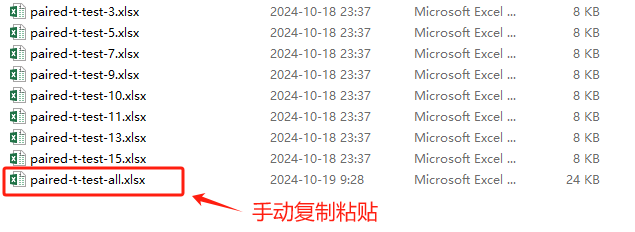

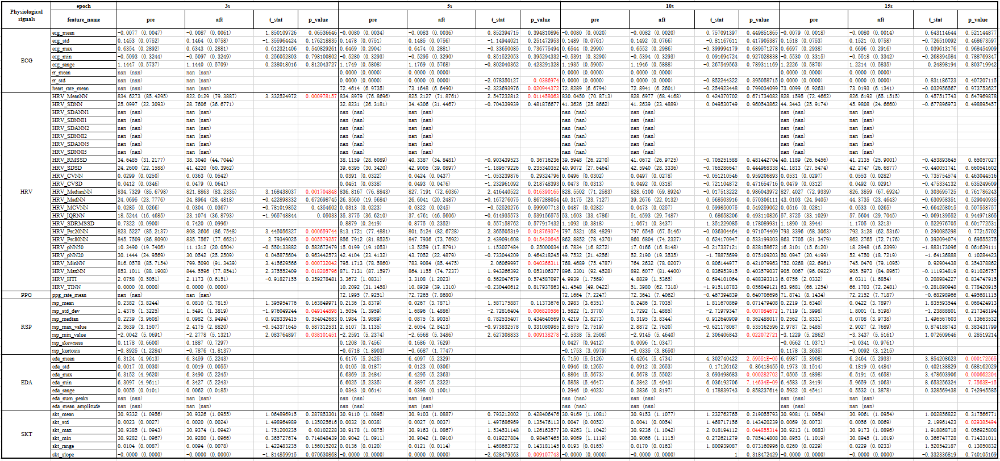

### 绘制配对t检验的图

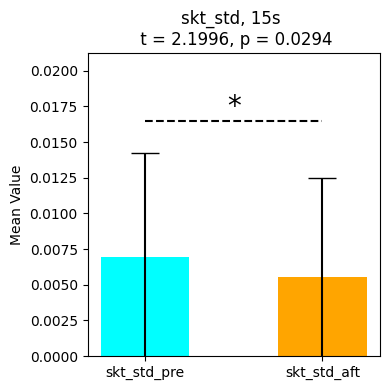

In [947]:
def draw_bar(feature, epoch):
    df_features = pd.read_excel(r'features_epoch\MaEs\features_' + str(epoch) + '.xlsx')
    group1, group2 = df_features[feature + '_pre'], df_features[feature + '_aft']

    # 计算配对 t 检验
    t_stat, p_value = stats.ttest_rel(group1, group2)
    
    # 添加星号以表示显著性水平
    if p_value < 0.0001:
        significance = '****'
    elif p_value < 0.001:
        significance = '***'
    elif p_value < 0.01:
        significance = '**'
    elif p_value < 0.05:
        significance = '*'
    else:
        significance = 'ns'  # 非显著

    # 设置图形
    plt.figure(figsize=(4, 4))

    # 计算两组数据的均值和标准差
    means = [np.mean(group1), np.mean(group2)]
    stds = [np.std(group1), np.std(group2)]

    # 绘制柱状图
    bar_width = 0.4
    bars = plt.bar([0, 0.8], means, yerr=stds, capsize=10, color=['cyan', 'orange'], width=bar_width)

    # 设置标签
    plt.xticks([0, 0.8], [feature + '_pre', feature + '_aft'])
    plt.ylabel('Mean Value')
    # 设置纵坐标范围
    plt.ylim(0, means[0]+ np.max(group1)/2)

    # 在图上方标注星号
    plt.text(0.4, means[0]+ np.max(group1)/3, significance, ha='center', va='bottom', fontsize=20) # 绘制*
    plt.plot([0, 0.3, 0.8], [means[0]+ np.max(group1)/3, means[0]+ np.max(group1)/3, means[0]+ np.max(group1)/3], color='black', linestyle='--')  # 绘制虚线连接两组

    # 显示 p 值
    plt.title(f'{feature}, {epoch}s \n t = {t_stat:.4f}, p = {p_value:.4f}')

    # 显示图形
    plt.tight_layout()
    plt.show()
    
# draw_bar('HRV_MeanNN', 3)
# draw_bar('HRV_MedianNN', 3)
# draw_bar('HRV_Prc20NN', 3)
# draw_bar('HRV_Prc80NN', 3)
# draw_bar('HRV_MaxNN', 3)
# draw_bar('HRV_MinNN', 3)
# draw_bar('rsp_std_dev', 3)
# draw_bar('rsp_min_value', 3)

# draw_bar('rr_std', 5)
# draw_bar('heart_rate_mean', 5)
# draw_bar('HRV_MeanNN', 5)
# draw_bar('HRV_MedianNN', 5)
# draw_bar('HRV_Prc20NN', 5)
# draw_bar('HRV_Prc80NN', 5)
# draw_bar('HRV_MinNN', 5)
# draw_bar('rsp_std_dev', 5)
# draw_bar('rsp_min_value', 5)
# draw_bar('skt_slope', 5)

# draw_bar('rsp_std_dev', 10)
# draw_bar('rsp_min_value', 10)
# draw_bar('eda_mean', 10)
# draw_bar('eda_max', 10)
# draw_bar('eda_min', 10)
# draw_bar('rsp_std_dev', 10)

# draw_bar('eda_mean', 15)
# draw_bar('eda_max', 15)
# draw_bar('eda_min', 15)
draw_bar('skt_std', 15)

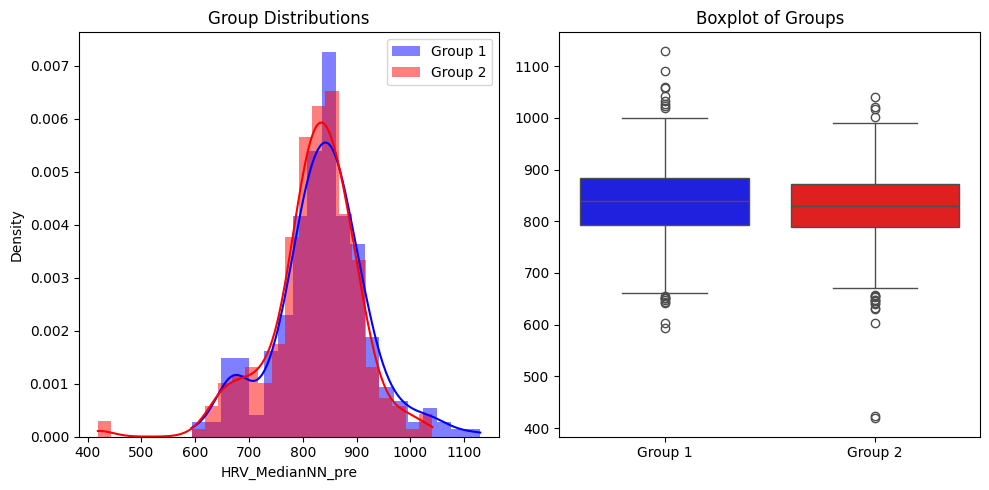

In [819]:
import seaborn as sns
import matplotlib.pyplot as plt

# 可视化两组数据的分布和箱线图
plt.figure(figsize=(10, 5))

# 分布图
plt.subplot(1, 2, 1)
sns.histplot(group1, color='blue', label='Group 1', kde=True, stat="density", linewidth=0)
sns.histplot(group2, color='red', label='Group 2', kde=True, stat="density", linewidth=0)
plt.title('Group Distributions')
plt.legend()

# 箱线图
plt.subplot(1, 2, 2)
sns.boxplot(data=[group1, group2], palette=["blue", "red"])
plt.xticks([0, 1], ['Group 1', 'Group 2'])
plt.title('Boxplot of Groups')

# 显示图形
plt.tight_layout()
plt.show()

# 微表情与静息态

In [993]:
emotions_dict = {1: 'sad', 2:'disgust', 3: 'happy', 4: 'fear', 5: 'nervous', 6: 'calm', 7: 'anger', 8: 'surprise'}
trial2emotion_dict = {101:1, 102:2, 103:3, 104:4, 105:5, 106:6, 
                      107:7, 108:8, 109:1, 110:2, 111:3, 112:2, 113:4, 114:5, 115:6,
                      116:7, 117:8, 118:1, 119:2, 120:3, 121:4, 122:5, 123:3, 124:6,
                      125:7, 126:8, 127:1, 128:2, 129:3, 130:4, 131:5, 132:6, 
                      133:7, 134:4, 135:8, 136:1, 137:2, 138:3, 139:4, 140:5, 141:6, 
                      142:7, 143:8, 144:5, 145:6, 
                      146:7, 147:8, 148:1}

# 找出所有值为6（对应'calm'）的键
keys_with_value_calm = [key for key, value in trial2emotion_dict.items() if value == 6]

print('calm视频的marker为：', keys_with_value_calm)

calm视频的marker为： [106, 115, 124, 132, 141, 145]


In [1030]:
file_path = 'coding_file_mc.xlsx'  # Replace with your actual file path
df = pd.read_excel(file_path)

# 初始化字典，文件名为键，微表情关键帧的时刻构成的列表为值，(起始帧，峰值帧，结束帧)
micro_dict = {}

# 遍历每一行
for index, row in df.iterrows():
    if row['Macro/Micro'] == 'Micro':
        filename = row['Filename']
        onset_time = round(row['OnsetTime'], 3)
        onset_time = f"{onset_time:.3f}"  # 保留小数点后三位，补零

        apex_time = round(row['ApexTime'], 3)
        apex_time = f"{apex_time:.3f}"

        offset_time = round(row['OffsetTime'], 3)
        offset_time = f"{offset_time:.3f}"

        if filename in micro_dict:
            micro_dict[filename].append((onset_time, apex_time, offset_time))
        else:
            micro_dict[filename] = [(onset_time, apex_time, offset_time)]

# 查看字典的长度
length = len(micro_dict)
print(f"字典的长度是: {length}")

# 打印生成的字典
print('micro_dict:', micro_dict)

字典的长度是: 81
micro_dict: {'angry_1_146_wangxiaomin_20230718.avi': [('3.400', '3.600', '3.600')], 'angry_1_146_yangmi_20230728.avi': [('40.960', '41.100', '41.370')], 'angry_2_107_wangshuai_20230802.avi': [('28.250', '28.500', '28.700'), ('29.440', '29.840', '29.840')], 'angry_2_107_wangzishan_20230717.avi': [('26.100', '26.260', '26.260')], 'angry_2_107_zhaoshaohua_20230801.avi': [('16.860', '17.190', '17.330')], 'angry_3_116_liyan_20230802.avi': [('1.700', '1.970', '2.200'), ('10.060', '10.250', '10.500'), ('41.290', '41.570', '41.760')], 'angry_3_116_yangmi_20230728.avi': [('4.940', '5.220', '5.400'), ('51.500', '51.690', '51.970'), ('8.420', '8.610', '8.890')], 'angry_3_116_zhaoshaohua_20230801.avi': [('25.450', '25.640', '25.910')], 'angry_4_125_wangziheng_20230727.avi': [('53.780', '53.960', '54.230')], 'angry_4_125_zhengwansheng_20230718.avi': [('6.270', '6.540', '6.720')], 'angry_5_133_wangxiaomin_20230718.avi': [('2.190', '2.470', '2.660'), ('6.560', '6.750', '7.010')], 'angry_6_

## 获取marker出现的顺序与数量

In [998]:
marker_list = df_biopac_data['Marker'].tolist()
print('len(marker_list):', len(marker_list))
# 初始化一个新的列表来存储处理后的结果
filtered_marker_list = []

# 遍历原始列表
for i in range(len(marker_list)):
    # 如果是第一个元素或者当前元素与前一个元素不相同，则添加到新列表中
    if i == 0 or marker_list[i] != marker_list[i - 1]:
        filtered_marker_list.append(marker_list[i])

# 将结果转换为列表
filtered_marker_list = list(filtered_marker_list)

# 输出结果
# print(filtered_marker_list)

# 初始化变量
count_marker = []
current_count = 1

# 遍历 marker_list，从第二个元素开始
for i in range(1, len(marker_list)):
    if marker_list[i] == marker_list[i - 1]:
        # 如果当前元素与前一个相同，计数+1
        current_count += 1
    else:
        # 如果不同，将当前计数添加到 count_marker，并重置计数器
        count_marker.append(current_count)
        current_count = 1

# 添加最后一组计数
count_marker.append(current_count)


df_marker_count = pd.DataFrame({
    'marker': filtered_marker_list,
    'frames': count_marker,
    'time(s)': [x / 1000 for x in count_marker],
    'time(m)': [x / 1000 / 60 for x in count_marker]
})

df_marker_count.head(15)

len(marker_list): 4222200


,marker,frames,time(s),time(m)
0,100,60865,60.865,1.014417
1,0,5705,5.705,0.095083
2,77,10004,10.004,0.166733
3,88,3987,3.987,0.066450
4,0,14,0.014,0.000233
5,101,59006,59.006,0.983433
6,0,11,0.011,0.000183
7,100,30536,30.536,0.508933
8,0,11,0.011,0.000183
9,102,57848,57.848,0.964133


## 生成微表情与静息态特征，存入excel

In [1033]:
def get_ecg_features_me_vs_calm(df_epoch, me_or_calm):
    # 提取ECG统计特征
    ecg = df_epoch['ECG'].to_numpy()
    ecg_mean = round(np.mean(ecg), 5)  # 平均值
    ecg_std = round(np.std(ecg), 5)  # 标准差
    ecg_max = round(np.max(ecg), 5)  # 最大值
    ecg_min = round(np.min(ecg), 5)  # 最小值
    ecg_range = round(ecg_max - ecg_min, 5)  # 幅度范围
    
    try:
        # 提取心率和RR间隔信息
        ecg_epoch, info = nk.ecg_process(ecg, sampling_rate=1000)
        heart_rate = ecg_epoch['ECG_Rate']  # 获取心率（bpm）
        rr_intervals = np.diff(ecg_epoch['ECG_R_Peaks']) / 1000  # 计算RR间隔（秒）

        # 计算RR间隔的统计特征
        rr_mean = round(np.mean(rr_intervals), 5)  # RR间隔均值
        rr_std = round(np.std(rr_intervals), 5)  # RR间隔标准差
        heart_rate_mean = round(np.mean(heart_rate), 5)  # 心率平均值
    except:
        rr_mean, rr_std, heart_rate_mean = None, None, None
    
    ecg_features = (ecg_mean, ecg_std, ecg_max, ecg_min, ecg_range, rr_mean, rr_std, heart_rate_mean)
    
    ecg_features_names = ['ecg_mean', 'ecg_std', 'ecg_max', 'ecg_min', 'ecg_range', 'rr_mean', 'rr_std', 'heart_rate_mean']
    
    if me_or_calm == 'me':
        ecg_features_names = [item + '_me' for item in ecg_features_names]
    if me_or_calm == 'calm':
        ecg_features_names = [item + '_calm' for item in ecg_features_names]
#     print('ecg_features:', ecg_features)
    # 返回统计特征
    return ecg_features, ecg_features_names

In [1034]:
def get_hrv_features_me_vs_calm(df_epoch, me_or_calm):
    ecg = df_epoch['ECG'].to_numpy()
    try:
        ecg_peaks, info = nk.ecg_peaks(ecg, sampling_rate=1000)
        hrv_features = nk.hrv_time(ecg_peaks, sampling_rate=1000, show=False)
        hrv_features_names = hrv_features.columns.tolist()
        hrv_features = tuple(hrv_features.iloc[0].apply(lambda x: np.nan if x is None else x))
        
    except:
        hrv_features = [None for _ in range(25)]
        hrv_features_names = ['HRV_MeanNN', 'HRV_SDNN', 'HRV_SDANN1', 'HRV_SDNNI1', 'HRV_SDANN2', 'HRV_SDNNI2', 'HRV_SDANN5', 
                              'HRV_SDNNI5',  'HRV_RMSSD', 'HRV_SDSD', 'HRV_CVNN', 'HRV_CVSD', 'HRV_MedianNN', 'HRV_MadNN', 
                              'HRV_MCVNN', 'HRV_IQRNN', 'HRV_SDRMSSD', 'HRV_Prc20NN', 'HRV_Prc80NN', 'HRV_pNN50', 'HRV_pNN20', 
                              'HRV_MinNN', 'HRV_MaxNN', 'HRV_HTI', 'HRV_TINN']
    
    if me_or_calm == 'me':
        hrv_features_names = [item + '_me' for item in hrv_features_names]
    if me_or_calm =='calm':
        hrv_features_names = [item + '_calm' for item in hrv_features_names]
#     print('hrv_features_names:', hrv_features_names)
    return hrv_features, hrv_features_names

In [1035]:
def get_ppg_features_me_vs_calm(df_epoch, me_or_calm):
    ppg = df_epoch['PPG'].to_numpy()
    try:
        ppg_epoch, info = nk.ppg_process(ppg, sampling_rate=1000)
        # 计算PPG_Rate的均值
        ppg_rate_mean = ppg_epoch['PPG_Rate'].mean()
    except:
        ppg_rate_mean = None
        
    ppg_features = (ppg_rate_mean,)
    ppg_features_names = ['ppg_rate_mean']
    
    if me_or_calm == 'me':
        ppg_features_names = [item + '_me' for item in ppg_features_names]
    if me_or_calm =='calm':
        ppg_features_names = [item + '_calm' for item in ppg_features_names]
        
    return ppg_features, ppg_features_names

In [1036]:
def get_rsp_features_me_vs_calm(df_epoch, me_or_calm):
    rsp = df_epoch['RSP'].to_numpy()
    rsp_mean = round(np.mean(rsp), 5)
    rsp_std_dev = round(np.std(rsp), 5)
    rsp_median = round(np.median(rsp), 5)
    rsp_max_value = round(np.max(rsp), 5)
    rsp_min_value = round(np.min(rsp), 5)
    rsp_skewness = round(stats.skew(rsp), 5)
    rsp_kurtosis = round(stats.kurtosis(rsp), 5)
    
    rsp_features = (rsp_mean, rsp_std_dev, rsp_median, rsp_max_value, rsp_min_value, rsp_skewness, rsp_kurtosis)
    rsp_features_names = ['rsp_mean', 'rsp_std_dev', 'rsp_median', 'rsp_max_value', 'rsp_min_value', 'rsp_skewness', 'rsp_kurtosis']
    
    if me_or_calm == 'me':
        rsp_features_names = [item + '_me' for item in rsp_features_names]
    if me_or_calm =='calm':
        rsp_features_names = [item + '_calm' for item in rsp_features_names] 
    
    return rsp_features, rsp_features_names    

In [1037]:
def get_eda_features_me_vs_calm(df_epoch, me_or_calm):
    eda = df_epoch['EDA'].to_numpy()
    try:
        eda_epoch, info = nk.eda_process(eda, sampling_rate=1000)

        # 提取SCL和SCR特征
        scl = eda_epoch["EDA_Tonic"]  # 皮肤电水平
        scr = eda_epoch["EDA_Phasic"]  # 皮肤电反应

        # 计算统计特征
        eda_mean = round(np.mean(scl), 5)  # 平均值
        eda_std = round(np.std(scl), 5)  # 标准差
        eda_max = round(np.max(scl), 5)  # 最大值
        eda_min = round(np.min(scl), 5)  # 最小值
        eda_range = round(eda_max - eda_min, 5)  # 幅度范围
    except:
        eda_mean, eda_std, eda_max, eda_min, eda_range = None, None, None, None, None
        
    try:
        # 检测皮肤电反应的峰值
        peaks_info = nk.eda_findpeaks(scr)
        peaks = peaks_info["SCR_Peaks"]  # 获取峰值的索引
        eda_num_peaks = len(peaks)  # 皮肤电反应次数
        peak_amplitudes = scr[peaks]  # 反应峰值的振幅
        eda_mean_amplitude = round(np.mean(peak_amplitudes), 5) if num_peaks > 0 else 0  # 平均振幅
    except:
        eda_num_peaks, eda_mean_amplitude = None, None
        
    eda_features = (eda_mean, eda_std, eda_max, eda_min, eda_range, eda_num_peaks, eda_mean_amplitude)
    eda_features_names = ['eda_mean', 'eda_std', 'eda_max', 'eda_min', 'eda_range', 'eda_num_peaks', 'eda_mean_amplitude']
    
    if me_or_calm == 'me':
        eda_features_names = [item + '_me' for item in eda_features_names]
    if me_or_calm =='calm':
        eda_features_names = [item + '_calm' for item in eda_features_names] 
    
    return eda_features, eda_features_names 

In [1038]:
def get_skt_features_me_vs_calm(df_epoch, me_or_calm):
    skt_signal = df_epoch['SKT A'].to_numpy()
    # 计算统计特征
    skt_mean = round(np.mean(skt_signal), 5)  # 平均值
    skt_std = round(np.std(skt_signal), 5)  # 标准差
    skt_max = round(np.max(skt_signal), 5)  # 最大值
    skt_min = round(np.min(skt_signal), 5)  # 最小值
    skt_range = round(skt_max - skt_min, 5)  # 幅度范围

    # 计算信号的斜率
    time = np.arange(len(skt_signal))  # 时间轴（以秒为单位）
    skt_slope = round(np.polyfit(time, skt_signal, 1)[0], 5)  # 线性拟合，计算斜率
    
    skt_features = (skt_mean, skt_std, skt_max, skt_min, skt_range, skt_slope)
    skt_features_names = ['skt_mean', 'skt_std', 'skt_max', 'skt_min', 'skt_range', 'skt_slope']
    
    if me_or_calm == 'me':
        skt_features_names = [item + '_me' for item in skt_features_names]
    if me_or_calm =='calm':
        skt_features_names = [item + '_calm' for item in skt_features_names] 
    
    return skt_features, skt_features_names

In [1039]:
def find_closest_marker(marker_me, markers_calm):
    marker_me = int(marker_me)
    # 找到所有大于 marker_me 的值
    greater = [m for m in markers_calm if m > marker_me]
    
    if greater:
        # 返回大于 marker_me 且最接近的值
        return min(greater)
    else:
        # 找到所有小于 marker_me 的值
        smaller = [m for m in markers_calm if m < marker_me]
        # 返回小于 marker_me 且最接近的值
        return max(smaller)

In [1065]:
def get_features_me_vs_calm(epoch):
    df_features = pd.DataFrame() # 初始化一个空 DataFrame 用于存储结果
    markers_calm = [106, 115, 124, 132, 141, 145]
    # 遍历目录下的h5文件
    for filename in os.listdir('biopac_data_HDF5'):
        if filename.endswith('.h5'):
            # 加载该h5文件（1h），包含marker信息
            df_biopac_data = pd.read_hdf(os.path.join('biopac_data_HDF5', filename), key='df')
            # 获取h5对应的视频（1min）
            avi_names = h5_to_avis(filename, micro_dict)
            if avi_names: # 如果列表不为空
                # 获取.avi中的宏表情
                for avi in avi_names:
                    marker_me = avi.split('_')[2]
                    marker_calm = find_closest_marker(marker_me, markers_calm)
                    me_apexs = get_apexs(avi)
                    # 根据marker找到对应的数据
                    df_biopac_marker_me = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker_me)]
                    df_biopac_marker_me = df_biopac_marker_me.reset_index(drop=True)

                    df_biopac_marker_calm = df_biopac_data.loc[df_biopac_data['Marker'] == int(marker_calm)]
                    df_biopac_marker_calm = df_biopac_marker_calm.reset_index(drop=True)
                    # 获取行数
                    row_count = len(df_biopac_marker_me)

                    # 遍历每个微表情
                    for apex in me_apexs:
                        me = avi.split('.avi')[0] + '_' + str(apex/1000)
                        if float(apex/1000) > epoch and int((float(apex/1000) + epoch)*1000) + 1 <= row_count:
                            df_me_epoch = df_biopac_marker_me.iloc[int((float(apex/1000) - epoch)*1000): int((float(apex/1000) + epoch)*1000) + 1, :]
                            df_calm_epoch = df_biopac_marker_calm.iloc[-(epoch*2*1000 + 1):, :]

                            # ECG
                            ecg_features_me, ecg_features_me_names = get_ecg_features_me_vs_calm(df_me_epoch, 'me')
                            ecg_features_calm, ecg_features_calm_names = get_ecg_features_me_vs_calm(df_calm_epoch, 'calm')

                            # HRV
                            hrv_features_me, hrv_features_me_names = get_hrv_features_me_vs_calm(df_me_epoch, 'me')
                            hrv_features_calm, hrv_features_calm_names = get_hrv_features_me_vs_calm(df_calm_epoch, 'calm')
                            # PPG
                            ppg_features_me, ppg_features_me_names = get_ppg_features_me_vs_calm(df_me_epoch, 'me')
                            ppg_features_calm, ppg_features_calm_names = get_ppg_features_me_vs_calm(df_calm_epoch, 'calm')
                            # RSP
                            rsp_features_me, rsp_features_me_names = get_rsp_features_me_vs_calm(df_me_epoch, 'me')
                            rsp_features_calm, rsp_features_calm_names = get_rsp_features_me_vs_calm(df_calm_epoch, 'calm')                    
                            # EDA
                            eda_features_me, eda_features_me_names = get_eda_features_me_vs_calm(df_me_epoch, 'me')
                            eda_features_calm, eda_features_calm_names = get_eda_features_me_vs_calm(df_calm_epoch, 'calm')                         
                            # SKT
                            skt_features_me, skt_features_me_names = get_skt_features_me_vs_calm(df_me_epoch, 'me')
                            skt_features_calm, skt_features_calm_names = get_skt_features_me_vs_calm(df_calm_epoch, 'calm')                       

                            features = (
                                (me,) + 
                                ecg_features_me + ecg_features_calm + hrv_features_me + hrv_features_calm +
                                ppg_features_me + ppg_features_calm + rsp_features_me + rsp_features_calm +
                                eda_features_me + eda_features_calm + skt_features_me + skt_features_calm
                            )

                            features_names = (
                                ['ME'] + 
                                ecg_features_me_names + ecg_features_calm_names + hrv_features_me_names + hrv_features_calm_names +
                                ppg_features_me_names + ppg_features_calm_names + rsp_features_me_names + rsp_features_calm_names +
                                eda_features_me_names + eda_features_calm_names + skt_features_me_names + skt_features_calm_names
                            )

                            # 将ecg_features转换为一个DataFrame，然后使用pd.concat添加到df_features中
                            new_row = pd.DataFrame([features], columns=features_names)
                            df_features = pd.concat([df_features, new_row], ignore_index=True)
    
    return df_features

In [1066]:
def get_t_test_me_vs_calm(xlsx_file):
    # 读取 Excel 文件
    df_features = pd.read_excel(xlsx_file)

    # 获取表头（列名）
    header_list = df_features.columns.tolist()
    header_list.remove('ME')

    # 初始化特征对的空列表
    feature_pairs = []

    # 遍历所有的 _pre 特征
    for feature in header_list:
        if feature.endswith('_me'):
            calm_feature = feature[:-2] + 'calm'  # 找到相应的 _aft 特征
            feature_pairs.append((feature, calm_feature))  # 添加配对特征
            
    # 创建一个空的 DataFrame 来存储结果
    results_df = pd.DataFrame(columns=['feature_name', 'me', 'calm', 't_stat', 'p_value'])

    # 遍历配对特征并进行 t 检验
    for pair in feature_pairs:
        # 提取特征名
        feature_name = pair[0].split('_me')[0]
        # 计算 pre 和 aft 的均值和标准差
        mean_std_me = f"{df_features[pair[0]].mean():.4f} ({df_features[pair[0]].std():.4f})"
        mean_std_calm = f"{df_features[pair[1]].mean():.4f} ({df_features[pair[1]].std():.4f})"

        # 执行配对样本 t 检验
        t_stat, p_value = stats.ttest_rel(df_features[pair[0]], df_features[pair[1]])

        # 将结果作为 DataFrame 插入
        result = pd.DataFrame({
            'feature_name': [feature_name],
            'me': [mean_std_me],
            'calm': [mean_std_calm],
            't_stat': [t_stat],
            'p_value': [p_value]
        })
        results_df = pd.concat([results_df, result], ignore_index=True)

    # 定义一个用于标记 p 值的函数，如果 p < 0.05 则返回带颜色的值
    def highlight_p_value(val):
        color = 'red' if val < 0.05 else 'black'
        return f'color: {color}'

    # 使用 style.applymap 对 'p_value' 列进行条件格式化
    styled_results_df = results_df.style.applymap(highlight_p_value, subset=['p_value'])

    return styled_results_df

In [1067]:
epochs = [3, 5, 7, 9, 10, 11, 13, 15]
for epoch in epochs:
    df_features = get_features_me_vs_calm(epoch)
    xlsx_name = r'features_epoch\MEs_vs_calm\features_' + str(epoch) + '.xlsx'
    df_features.to_excel(xlsx_name, index=False)  # index=False 可以省略行索引 
    print("DataFrame 已成功写入Excel文件")

C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"]

C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"]

DataFrame 已成功写入Excel文件


C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"]

C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculat

DataFrame 已成功写入Excel文件


C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly id

DataFrame 已成功写入Excel文件


C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculat

DataFrame 已成功写入Excel文件


C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"]

DataFrame 已成功写入Excel文件


C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
D:\ProgramData\Anaconda3\envs\TF_2G\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly id

DataFrame 已成功写入Excel文件


C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculat

DataFrame 已成功写入Excel文件


C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_kurtosis = round(stats.kurtosis(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:8: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  rsp_skewness = round(stats.skew(rsp), 5)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_31464\194243254.py:9: RuntimeWarning: Precision loss occurred in moment calculat

PermissionError: [Errno 13] Permission denied: 'features_epoch\\MEs_vs_calm\\features_15.xlsx'

In [1068]:
epochs = [3, 5, 7, 9, 10, 11, 13, 15]
for epoch in epochs:
    xlsx_name = r'features_epoch\MEs_vs_calm\features_' + str(epoch) + '.xlsx'
    results_df_me_vs_calm = get_t_test_me_vs_calm(xlsx_name)
#     display(results_df_me_vs_calm)
    results_df_me_vs_calm.to_excel(r'features_epoch\MEs_vs_calm\paired-t-test-' + str(epoch) + '.xlsx', index=False)

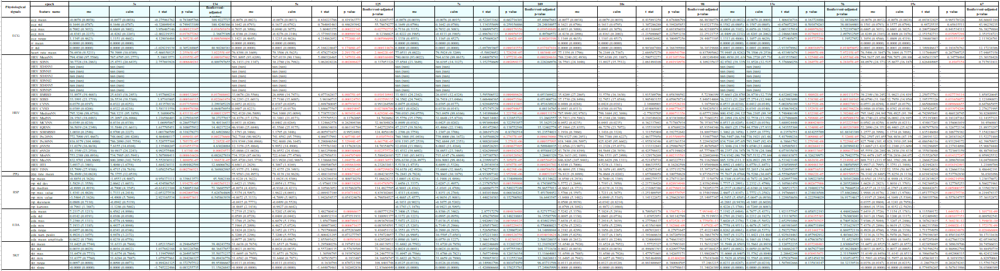